Questions pour Pierre:
    - dfApplicationTest, pas de flag donc pour tester le dashboard
    - équivalent de AUC pour courbe precision-rappel?
    - A. Géron: plutôt courbe précision-rappel si la classe positive est rare (inbalanced classification) ou si on attache plus d'importance aux faux positifs qu'aux faux négatifs
    - cas flagués 0, quid pour eux de la proba de faire défaut? ne faudrait-il pas avoir une proba plutôt que 0 en label?
    - Comment est modélisé un client qui a deux crédits actifs en cours (on a deux lignes dans application_train)
    - GridSearchCV: cherche le meilleur paramètre en terme de métrique mais pas de temps de traitement
    - OneHotEncoding: et si de nouvelles valeurs apparaissent en production?

In [1]:
# https://www.kaggle.com/mathchi/home-credit-risk-with-detailed-feature-engineering
# https://www.kaggle.com/ngainoriko/home-credit-bureau-feature-engineering

In [2]:
from IPython.core.display import display, HTML
display(HTML("<style>.container { width:100% !important; }</style>"))

In [3]:
import os
import datetime
import time
import pandas as pd
import warnings
import matplotlib.pyplot as plt
from myTools import *

from sklearn.model_selection import train_test_split

In [4]:
pd.options.display.max_rows = 1000
pd.options.display.max_columns = 1000

# Import des fichiers

In [5]:
time1 = time.time()
dfApplicationTest = pd.read_csv(os.getcwd() + '/Projet+Mise+en+prod+-+home-credit-default-risk/application_test.csv',",")
dfApplicationTrain = pd.read_csv(os.getcwd() + '/Projet+Mise+en+prod+-+home-credit-default-risk/application_train.csv',",")
dfBureau = pd.read_csv(os.getcwd() + '/Projet+Mise+en+prod+-+home-credit-default-risk/bureau.csv',",")
dfBureauBalance = pd.read_csv(os.getcwd() + '/Projet+Mise+en+prod+-+home-credit-default-risk/bureau_balance.csv',",")
dfPreviousApplication = pd.read_csv(os.getcwd() + '/Projet+Mise+en+prod+-+home-credit-default-risk/previous_application.csv',",")
dfPosCashBalance = pd.read_csv(os.getcwd() + '/Projet+Mise+en+prod+-+home-credit-default-risk/POS_CASH_balance.csv',",")
dfInstallmentsPayments = pd.read_csv(os.getcwd() + '/Projet+Mise+en+prod+-+home-credit-default-risk/installments_payments.csv',",")
dfCreditCardBalance = pd.read_csv(os.getcwd() + '/Projet+Mise+en+prod+-+home-credit-default-risk/credit_card_balance.csv',",")
time2 = time.time()
print(time2-time1)

27.426055431365967


# Mise de côté d'un jeu de validation

In [6]:
from collections import Counter
print("Distribution de la TARGET avant réduction du dataset")
counter = Counter(dfApplicationTrain.TARGET)
for k,v in counter.items():
    per = v / len(dfApplicationTrain.TARGET) * 100
    print('Class=%d, Count=%d, Percentage=%.3f%%' % (k, v, per))

Distribution de la TARGET avant réduction du dataset
Class=1, Count=24825, Percentage=8.073%
Class=0, Count=282686, Percentage=91.927%


In [7]:
dfApplication, dfApplicationVal = train_test_split(dfApplicationTrain, test_size=0.3, random_state=1)
dfApplication = dfApplication[0:50000]

In [8]:
print("Distribution de la TARGET après réduction du jeu de données")
counter = Counter(dfApplication.TARGET)
for k,v in counter.items():
    per = v / len(dfApplication.TARGET) * 100
    print('Class=%d, Count=%d, Percentage=%.3f%%' % (k, v, per))

Distribution de la TARGET après réduction du jeu de données
Class=0, Count=45975, Percentage=91.950%
Class=1, Count=4025, Percentage=8.050%


In [9]:
dfPreviousApplication = dfPreviousApplication.merge(dfApplication[['SK_ID_CURR']], left_on='SK_ID_CURR', right_on='SK_ID_CURR')
dfPosCashBalance = dfPosCashBalance.merge(dfPreviousApplication[['SK_ID_CURR','SK_ID_PREV']], left_on=['SK_ID_CURR','SK_ID_PREV'], right_on=['SK_ID_CURR','SK_ID_PREV'])
dfInstallmentsPayments = dfInstallmentsPayments.merge(dfPreviousApplication[['SK_ID_CURR','SK_ID_PREV']], left_on=['SK_ID_CURR','SK_ID_PREV'], right_on=['SK_ID_CURR','SK_ID_PREV'])
dfCreditCardBalance = dfCreditCardBalance.merge(dfPreviousApplication[['SK_ID_CURR','SK_ID_PREV']], left_on=['SK_ID_CURR','SK_ID_PREV'], right_on=['SK_ID_CURR','SK_ID_PREV'])
dfBureau = dfBureau.merge(dfApplication[['SK_ID_CURR']], left_on='SK_ID_CURR', right_on='SK_ID_CURR')
dfBureauBalance = dfBureauBalance.merge(dfBureau[['SK_ID_BUREAU']], left_on='SK_ID_BUREAU', right_on='SK_ID_BUREAU')

# Marquage des valeurs manquantes

In [10]:
dfApplication = dfApplication.replace('XNA', np.nan)
dfPreviousApplication = dfPreviousApplication.replace('XNA', np.nan)
dfBureau = dfBureau.replace('XNA', np.nan)
dfApplication = dfApplication.replace('XAP', np.nan)
dfPreviousApplication = dfPreviousApplication.replace('XAP', np.nan)
dfBureau = dfBureau.replace('XAP', np.nan)
dfBureauBalance = dfBureauBalance.replace('X', np.nan)

# Exploration de application_train

## Suppression de champs a priori non pertinents

In [11]:
if False:
    col_to_del = [
    'FLAG_MOBIL', # Did client provide mobile phone
    'FLAG_EMP_PHONE',
    'FLAG_WORK_PHONE',
    'FLAG_CONT_MOBILE',
    'FLAG_PHONE',
    'FLAG_EMAIL',

    # ininéressant
    'NAME_TYPE_SUITE',  # Who was accompanying client when he was applying for the loan
    'DAYS_ID_PUBLISH', # How many days before the application did client change the identity document with which he applied for the loan,time only relative to the application
    'DAYS_REGISTRATION', # How many days before the application did client change his registration,time only relative to the application
    'WEEKDAY_APPR_PROCESS_START', # On which day of the week did the client apply for the loan
    'HOUR_APPR_PROCESS_START', # Approximately at what hour did the client apply for the loan,rounded
    'DAYS_LAST_PHONE_CHANGE', # How many days before application did client change phone

    # flags de comparaison de donnée
    'REG_REGION_NOT_LIVE_REGION', # Flag if client's permanent address does not match contact address
    'REG_REGION_NOT_WORK_REGION', # Flag if client's permanent address does not match contact address
    'LIVE_REGION_NOT_WORK_REGION', # Flag if client's contact address does not match work address
    'REG_CITY_NOT_LIVE_CITY', # Flag if client's permanent address does not match contact address (1=different, 0=same, at city level)
    'REG_CITY_NOT_WORK_CITY', # Flag if client's permanent address does not match work address (1=different, 0=same, at city level)
    'LIVE_CITY_NOT_WORK_CITY', # Flag if client's contact address does not match work address (1=different, 0=same, at city level)

    ]

    for col in col_to_del:
        del dfApplication[col]

    for col in dfApplication:
        if col[0:13] == 'FLAG_DOCUMENT':  # Did client provide document
            del dfApplication[col]

## Aperçu des valeurs manquantes

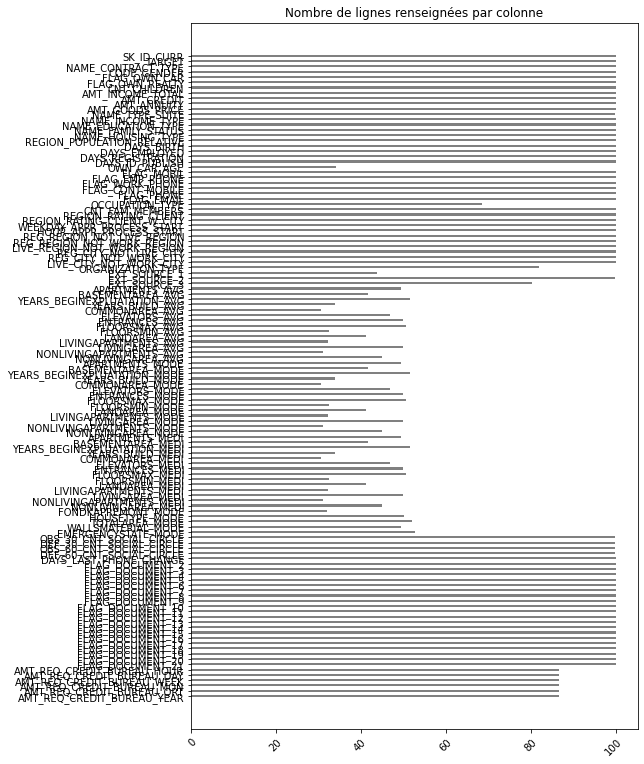

In [12]:
myDf(dfApplication).ColCountLinesChart(typeChart='barh', displayColName=True)

## Recherche de corrélations

### Variables Requests

#### Corrélations entre les variables request

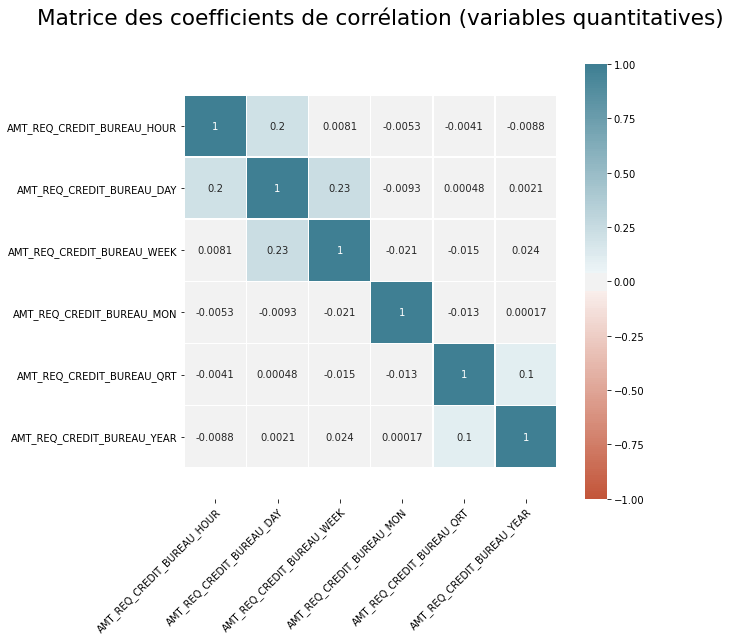

In [13]:
myDf(dfApplication).Stat(['AMT_REQ_CREDIT_BUREAU_HOUR', 'AMT_REQ_CREDIT_BUREAU_DAY',
       'AMT_REQ_CREDIT_BUREAU_WEEK', 'AMT_REQ_CREDIT_BUREAU_MON',
       'AMT_REQ_CREDIT_BUREAU_QRT','AMT_REQ_CREDIT_BUREAU_YEAR'], typeStat='biv',typeFeature='continue',bivThresholdCorr=2)

In [14]:
dfApplication['AMT_REQ_CREDIT_BUREAU_YEAR'] = dfApplication.apply(lambda x: x.AMT_REQ_CREDIT_BUREAU_HOUR + \
                                                                                 x.AMT_REQ_CREDIT_BUREAU_DAY + \
                                                                                 x.AMT_REQ_CREDIT_BUREAU_WEEK + \
                                                                                 x.AMT_REQ_CREDIT_BUREAU_MON + \
                                                                                 x.AMT_REQ_CREDIT_BUREAU_QRT + \
                                                                                 x.AMT_REQ_CREDIT_BUREAU_YEAR, axis=1)
dfApplication['AMT_REQ_CREDIT_BUREAU_QRT'] = dfApplication.apply(lambda x: x.AMT_REQ_CREDIT_BUREAU_HOUR + \
                                                                                 x.AMT_REQ_CREDIT_BUREAU_DAY + \
                                                                                 x.AMT_REQ_CREDIT_BUREAU_WEEK + \
                                                                                 x.AMT_REQ_CREDIT_BUREAU_MON + \
                                                                                 x.AMT_REQ_CREDIT_BUREAU_QRT, axis=1)
dfApplication['AMT_REQ_CREDIT_BUREAU_MON'] = dfApplication.apply(lambda x: x.AMT_REQ_CREDIT_BUREAU_HOUR + \
                                                                                 x.AMT_REQ_CREDIT_BUREAU_DAY + \
                                                                                 x.AMT_REQ_CREDIT_BUREAU_WEEK + \
                                                                                 x.AMT_REQ_CREDIT_BUREAU_MON, axis=1)
dfApplication['AMT_REQ_CREDIT_BUREAU_WEEK'] = dfApplication.apply(lambda x: x.AMT_REQ_CREDIT_BUREAU_HOUR + \
                                                                                 x.AMT_REQ_CREDIT_BUREAU_DAY + \
                                                                                 x.AMT_REQ_CREDIT_BUREAU_WEEK, axis=1)
dfApplication['AMT_REQ_CREDIT_BUREAU_DAY'] = dfApplication.apply(lambda x: x.AMT_REQ_CREDIT_BUREAU_HOUR + \
                                                                                 x.AMT_REQ_CREDIT_BUREAU_DAY, axis=1)

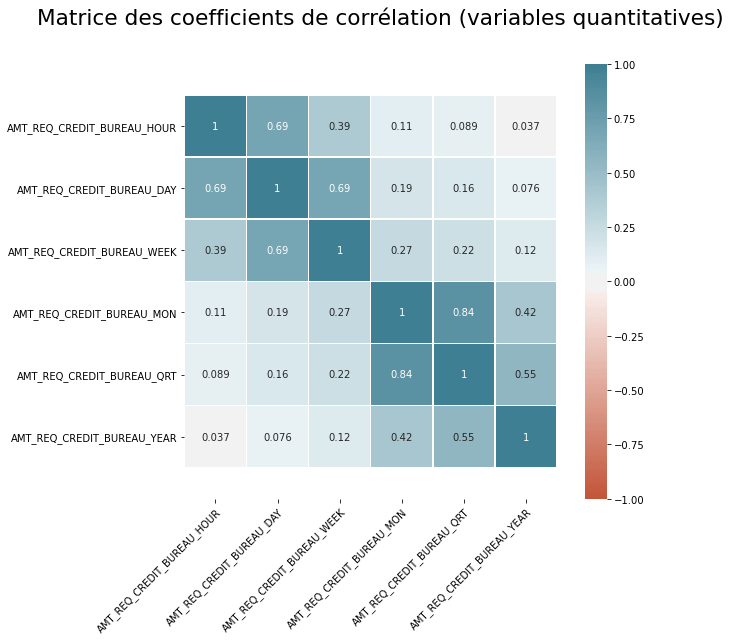

In [15]:
myDf(dfApplication).Stat(['AMT_REQ_CREDIT_BUREAU_HOUR', 'AMT_REQ_CREDIT_BUREAU_DAY',
       'AMT_REQ_CREDIT_BUREAU_WEEK', 'AMT_REQ_CREDIT_BUREAU_MON',
       'AMT_REQ_CREDIT_BUREAU_QRT','AMT_REQ_CREDIT_BUREAU_YEAR'], typeStat='biv',typeFeature='continue',bivThresholdCorr=2)

In [16]:
del dfApplication['AMT_REQ_CREDIT_BUREAU_HOUR']
del dfApplication['AMT_REQ_CREDIT_BUREAU_DAY']
del dfApplication['AMT_REQ_CREDIT_BUREAU_MON']
del dfApplication['AMT_REQ_CREDIT_BUREAU_QRT']

#### Corrélations entre les variables request et TARGET

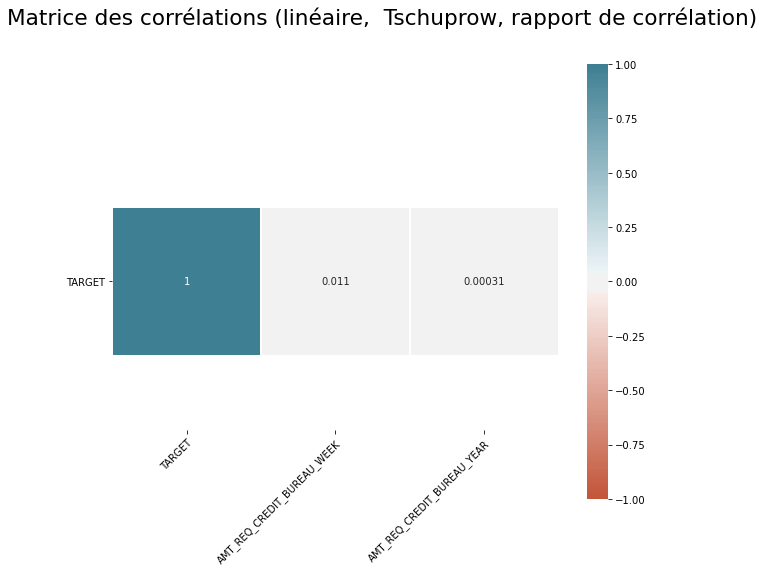

In [17]:
myDf(dfApplication[['TARGET','AMT_REQ_CREDIT_BUREAU_WEEK','AMT_REQ_CREDIT_BUREAU_YEAR']]).Stat(bivInclCol='TARGET',typeStat='biv',bivOnlyCorrTable=True)

### External source

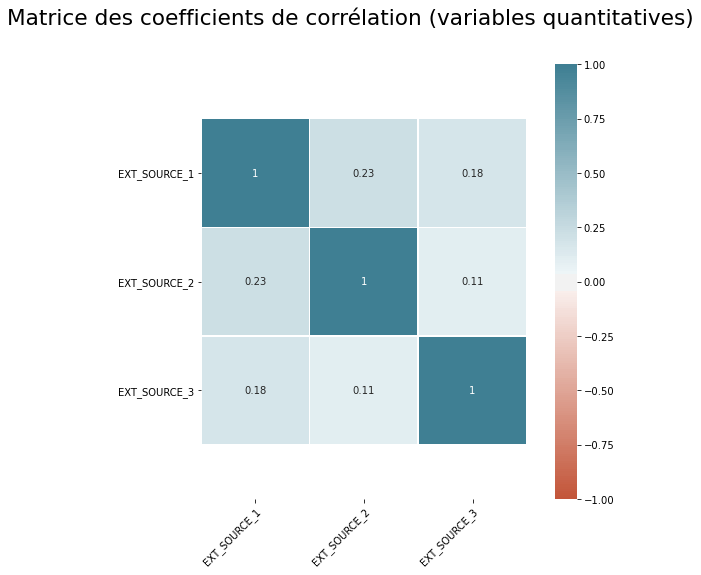

In [18]:
myDf(dfApplication).Stat(['EXT_SOURCE_1', 'EXT_SOURCE_2','EXT_SOURCE_3'], typeStat='biv',typeFeature='continue',bivThresholdCorr=2)

### External source 1 & days birth

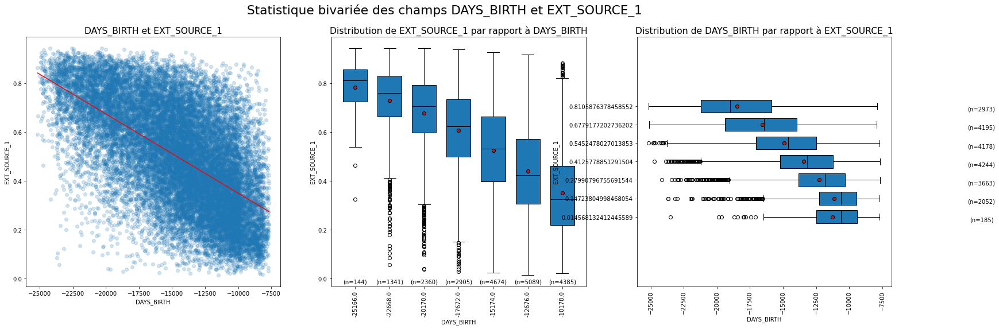

Covariance entre DAYS_BIRTH et EXT_SOURCE_1 : -506.7575914357755 
Covariance débiaisée entre DAYS_BIRTH et EXT_SOURCE_1 : -506.78080950557467 
Coefficient de correlation linéaire entre DAYS_BIRTH et EXT_SOURCE_1 : -0.6058213157598902 
Régression linéaire entre DAYS_BIRTH et EXT_SOURCE_1: y = -3.244323539709517e-05x + 0.024941622054241573
Coefficient de détermination entre DAYS_BIRTH et EXT_SOURCE_1 : 0.36701946662904456 


In [19]:
myDf(dfApplication).Stat(['EXT_SOURCE_1','DAYS_BIRTH'], typeStat='biv')

#### Corrélation avec TARGET

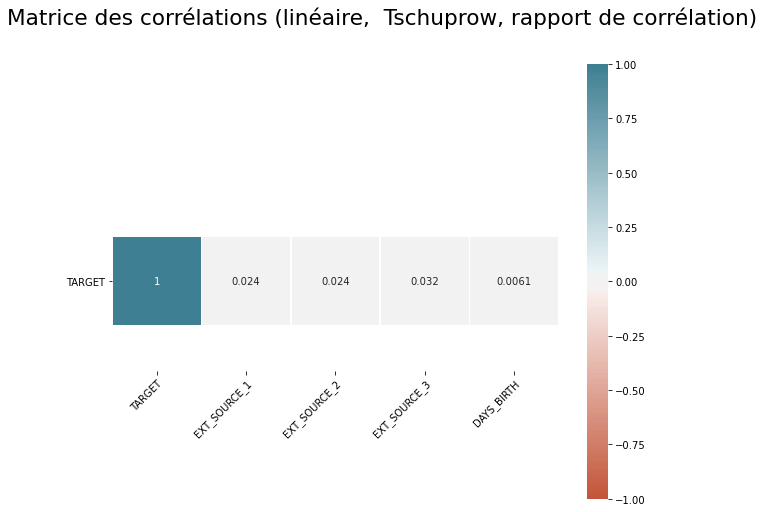

In [20]:
myDf(dfApplication[['TARGET','EXT_SOURCE_1','EXT_SOURCE_2','EXT_SOURCE_3','DAYS_BIRTH']]).Stat(bivInclCol='TARGET',typeStat='biv',bivOnlyCorrTable=True)

### Social circle

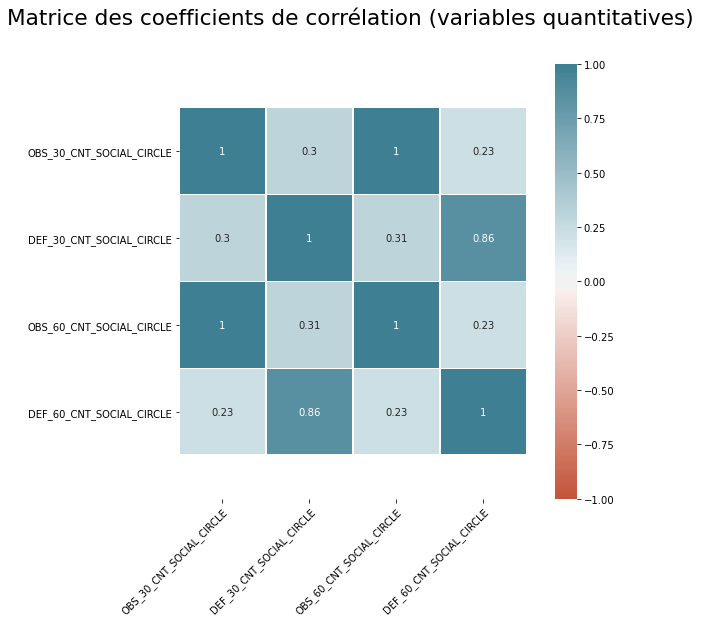

In [21]:
myDf(dfApplication).Stat(['OBS_30_CNT_SOCIAL_CIRCLE', 'DEF_30_CNT_SOCIAL_CIRCLE',
       'OBS_60_CNT_SOCIAL_CIRCLE', 'DEF_60_CNT_SOCIAL_CIRCLE'], typeStat='biv',typeFeature='continue',bivThresholdCorr=2)

In [22]:
print('Nombre de lignes avec le champ vide:')
(dfApplication[['OBS_30_CNT_SOCIAL_CIRCLE', 'DEF_30_CNT_SOCIAL_CIRCLE','OBS_60_CNT_SOCIAL_CIRCLE', 'DEF_60_CNT_SOCIAL_CIRCLE']].isnull()).sum()

Nombre de lignes avec le champ vide:


OBS_30_CNT_SOCIAL_CIRCLE    158
DEF_30_CNT_SOCIAL_CIRCLE    158
OBS_60_CNT_SOCIAL_CIRCLE    158
DEF_60_CNT_SOCIAL_CIRCLE    158
dtype: int64

#### Corrélation avec TARGET

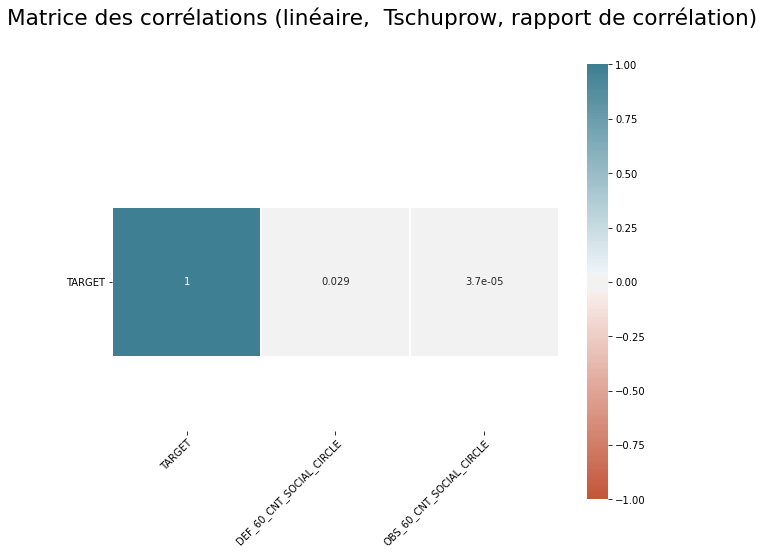

In [23]:
myDf(dfApplication[['OBS_60_CNT_SOCIAL_CIRCLE','DEF_60_CNT_SOCIAL_CIRCLE','TARGET']]).Stat(bivInclCol='TARGET',typeStat='biv',bivOnlyCorrTable=True)

In [24]:
del dfApplication['OBS_60_CNT_SOCIAL_CIRCLE']
del dfApplication['DEF_60_CNT_SOCIAL_CIRCLE']

### Car

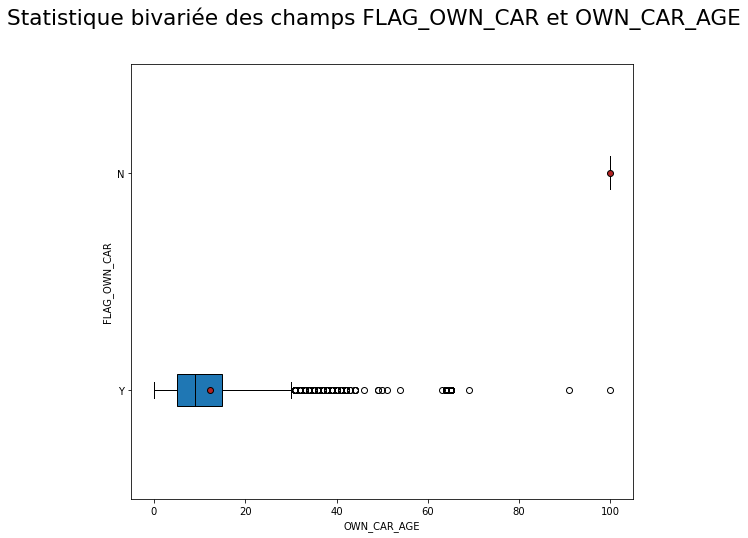

Rapport de corrélation entre FLAG_OWN_CAR et OWN_CAR_AGE: 0.9713299729102199


In [25]:
myDf(dfApplication[['FLAG_OWN_CAR','OWN_CAR_AGE']].replace(np.nan,100)).Stat(['FLAG_OWN_CAR','OWN_CAR_AGE'], typeStat='biv')

#### Corrélation avec TARGET

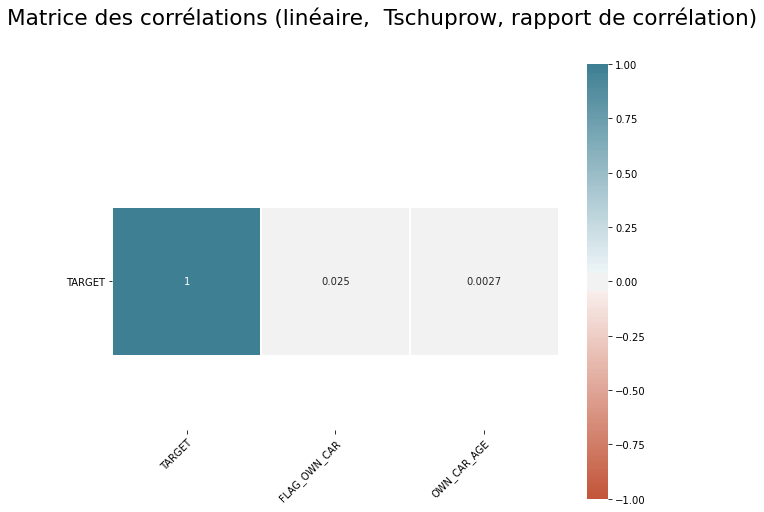

In [26]:
myDf(dfApplication[['FLAG_OWN_CAR','OWN_CAR_AGE','TARGET']]).Stat(bivInclCol='TARGET',typeStat='biv',bivOnlyCorrTable=True)

In [27]:
del dfApplication['OWN_CAR_AGE']

### Familly

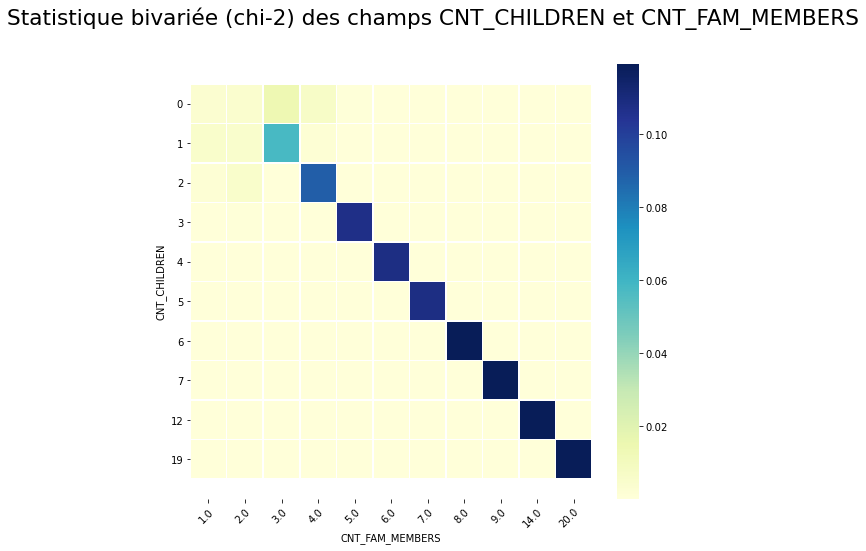

chi-2 entre CNT_CHILDREN et CNT_FAM_MEMBERS : 419507.2397448906 
phi-2 entre CNT_CHILDREN et CNT_FAM_MEMBERS : 8.390144794897813 
coefficient T de Tschuprow entre CNT_CHILDREN et CNT_FAM_MEMBERS : 0.9404248587825144 
coefficient C de Cramer entre CNT_CHILDREN et CNT_FAM_MEMBERS : 0.9655248886197607 


In [28]:
myDf(dfApplication).Stat(['CNT_CHILDREN','CNT_FAM_MEMBERS'], typeStat='biv')

In [29]:
print('Nombre de lignes avec le champ vide:')
(dfApplication[['CNT_CHILDREN','CNT_FAM_MEMBERS']].isnull()).sum()

Nombre de lignes avec le champ vide:


CNT_CHILDREN       0
CNT_FAM_MEMBERS    0
dtype: int64

#### Corrélation avec TARGET

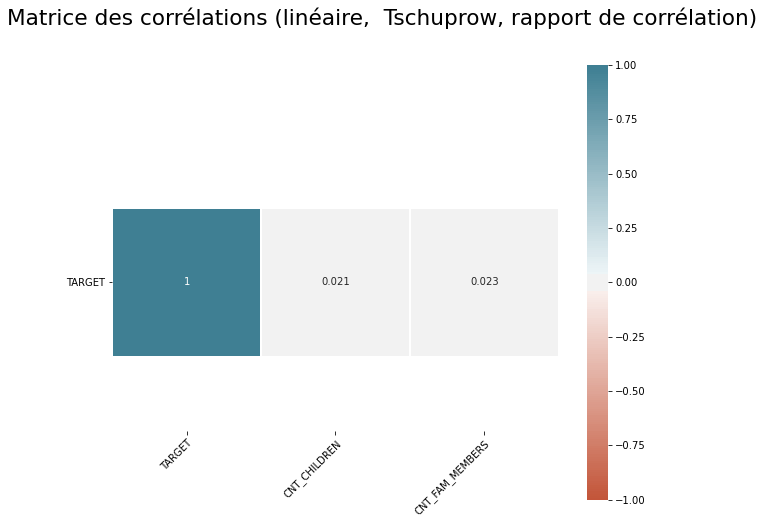

In [30]:
myDf(dfApplication[['CNT_CHILDREN','CNT_FAM_MEMBERS','TARGET']]).Stat(bivInclCol='TARGET',typeStat='biv',bivOnlyCorrTable=True)

In [31]:
del dfApplication['CNT_FAM_MEMBERS']

### Amount

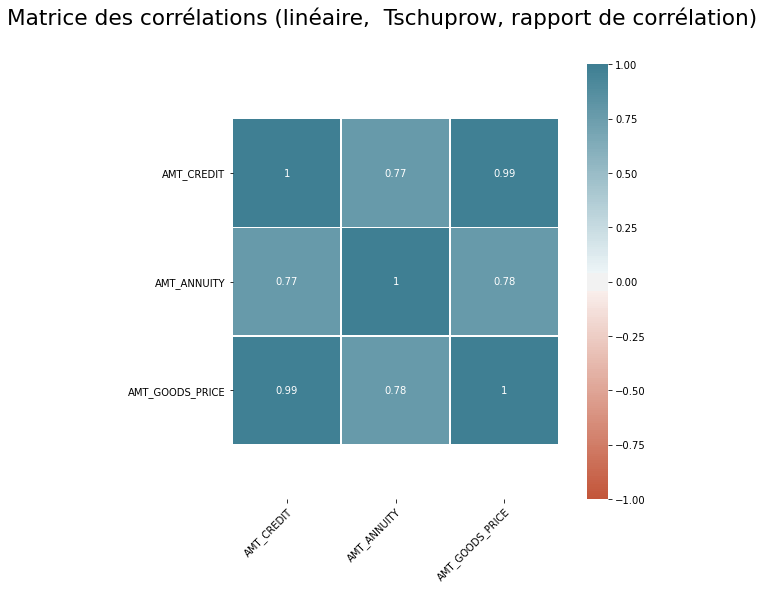

In [32]:
myDf(dfApplication).Stat(['AMT_CREDIT','AMT_ANNUITY','AMT_GOODS_PRICE'], typeStat='biv', bivOnlyCorrTable=True)

In [33]:
print('Nombre de lignes avec le champ vide:')
(dfApplication[['AMT_CREDIT','AMT_ANNUITY','AMT_GOODS_PRICE']].isnull()).sum()

Nombre de lignes avec le champ vide:


AMT_CREDIT          0
AMT_ANNUITY         2
AMT_GOODS_PRICE    43
dtype: int64

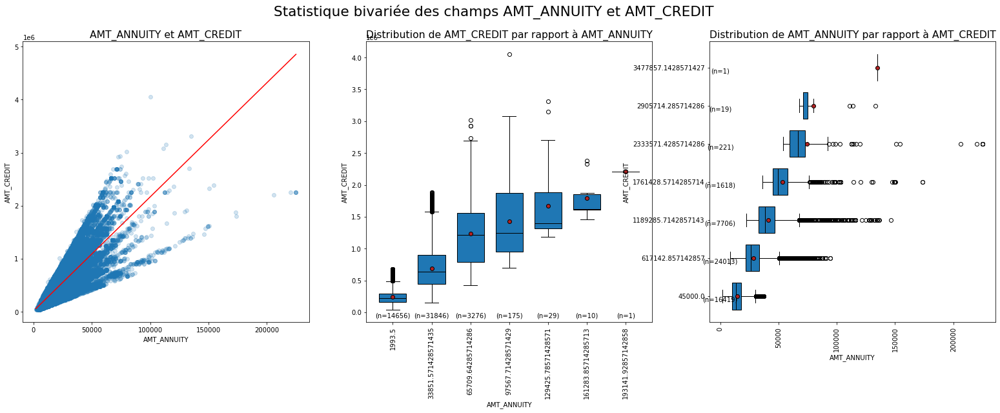

Covariance entre AMT_ANNUITY et AMT_CREDIT : 4527664921.293925 
Covariance débiaisée entre AMT_ANNUITY et AMT_CREDIT : 4527755480.025875 
Coefficient de correlation linéaire entre AMT_ANNUITY et AMT_CREDIT : 0.7727620940012476 
Régression linéaire entre AMT_ANNUITY et AMT_CREDIT: y = 21.5003665398958x + 16789.9629933227
Coefficient de détermination entre AMT_ANNUITY et AMT_CREDIT : 0.597161253925193 


In [34]:
myDf(dfApplication).Stat(['AMT_ANNUITY','AMT_CREDIT'], typeStat='biv')

#### Création d'une variable ratio annuity / income

In [35]:
# Création d'une variable ratio Annuity / Income
annuity = dfApplication.AMT_ANNUITY.values
income = dfApplication.AMT_INCOME_TOTAL.values
ratio_anuity_income = annuity / income
dfApplication['RATIO_ANNUITY_INCOME'] = pd.Series(ratio_anuity_income)

#### Corrélation avec TARGET

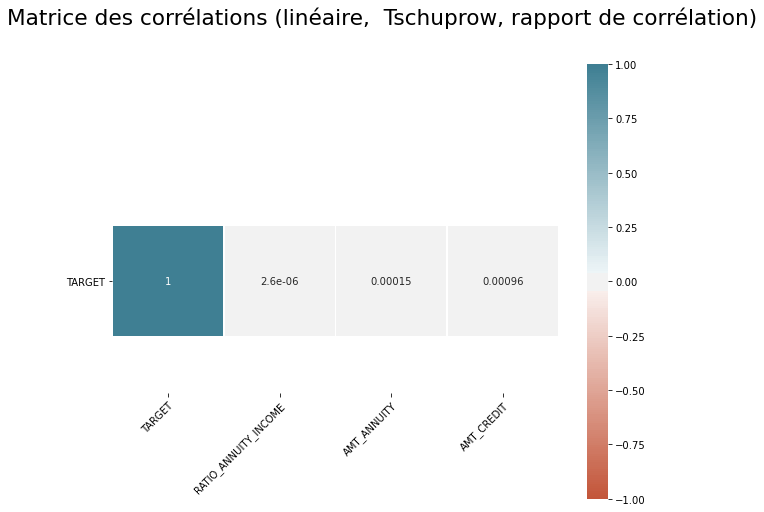

In [36]:
myDf(dfApplication[['RATIO_ANNUITY_INCOME','AMT_ANNUITY','AMT_CREDIT','TARGET']]).Stat(bivInclCol='TARGET',typeStat='biv',bivOnlyCorrTable=True)

In [37]:
del dfApplication['AMT_GOODS_PRICE']

### Income / employment

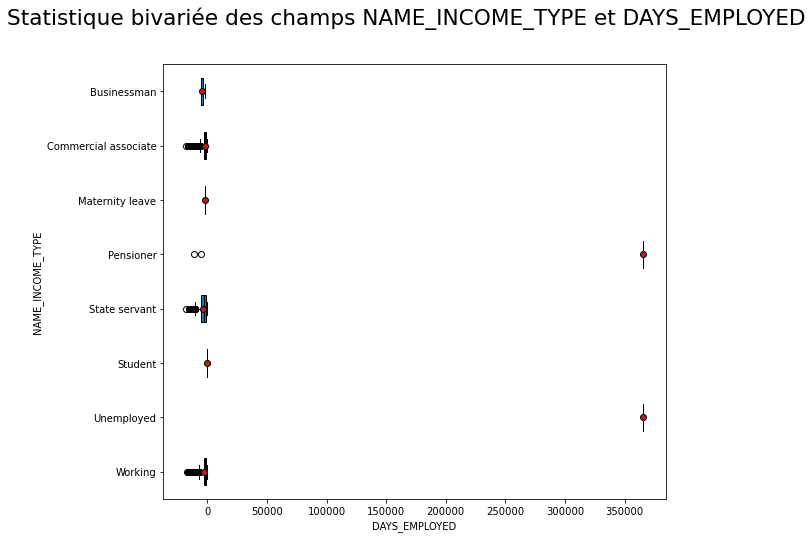

Rapport de corrélation entre NAME_INCOME_TYPE et DAYS_EMPLOYED: 0.9995037904311905


In [38]:
myDf(dfApplication).Stat(['NAME_INCOME_TYPE','DAYS_EMPLOYED'], typeStat='biv')

In [39]:
print('NAME_INCOME_TYPE avec days employed positif::')
dfApplication[dfApplication.DAYS_EMPLOYED > 0].NAME_INCOME_TYPE.unique()

NAME_INCOME_TYPE avec days employed positif::


array(['Pensioner', 'Unemployed'], dtype=object)

In [40]:
dfApplication['DAYS_EMPLOYED'] = dfApplication.apply(lambda x: np.where(x.DAYS_EMPLOYED>0,1,x.DAYS_EMPLOYED),axis=1).astype('int')

In [41]:
dfApplication[['DAYS_EMPLOYED']].dtypes

DAYS_EMPLOYED    int64
dtype: object

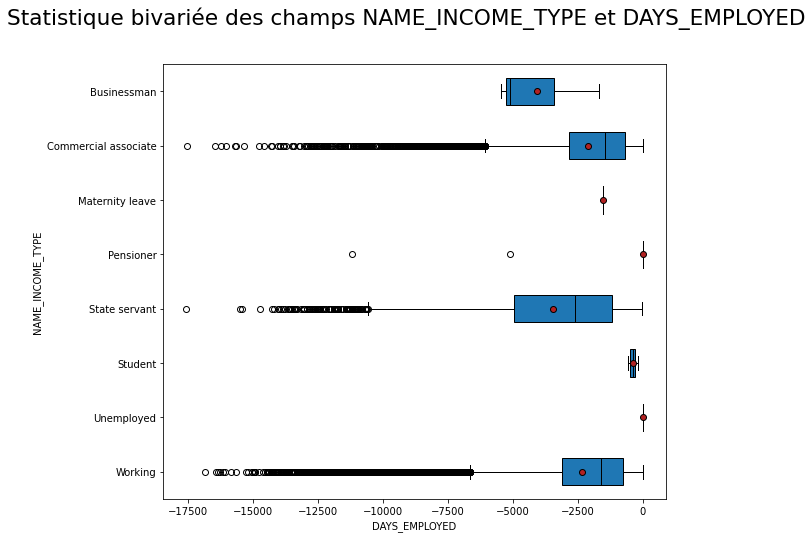

Rapport de corrélation entre NAME_INCOME_TYPE et DAYS_EMPLOYED: 0.17612367685414573


In [42]:
myDf(dfApplication).Stat(['NAME_INCOME_TYPE','DAYS_EMPLOYED'], typeStat='biv')

### Region rating

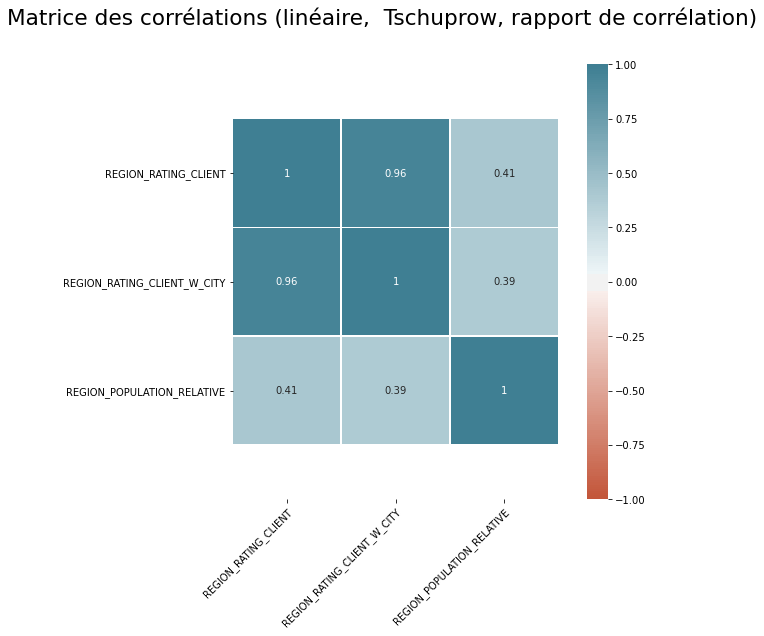

In [43]:
myDf(dfApplication).Stat(['REGION_RATING_CLIENT','REGION_RATING_CLIENT_W_CITY', 'REGION_POPULATION_RELATIVE'], typeStat='biv', bivOnlyCorrTable=True)

In [44]:
dfApplication[['REGION_RATING_CLIENT', 'REGION_RATING_CLIENT_W_CITY' ,'REGION_POPULATION_RELATIVE']].dtypes

REGION_RATING_CLIENT             int64
REGION_RATING_CLIENT_W_CITY      int64
REGION_POPULATION_RELATIVE     float64
dtype: object

In [45]:
print('Nombre de lignes avec le champ vide:')
(dfApplication[['REGION_RATING_CLIENT', 'REGION_RATING_CLIENT_W_CITY' ,'REGION_POPULATION_RELATIVE']].isnull()).sum()

Nombre de lignes avec le champ vide:


REGION_RATING_CLIENT           0
REGION_RATING_CLIENT_W_CITY    0
REGION_POPULATION_RELATIVE     0
dtype: int64

In [46]:
del dfApplication['REGION_RATING_CLIENT_W_CITY']

### Gender & occupation

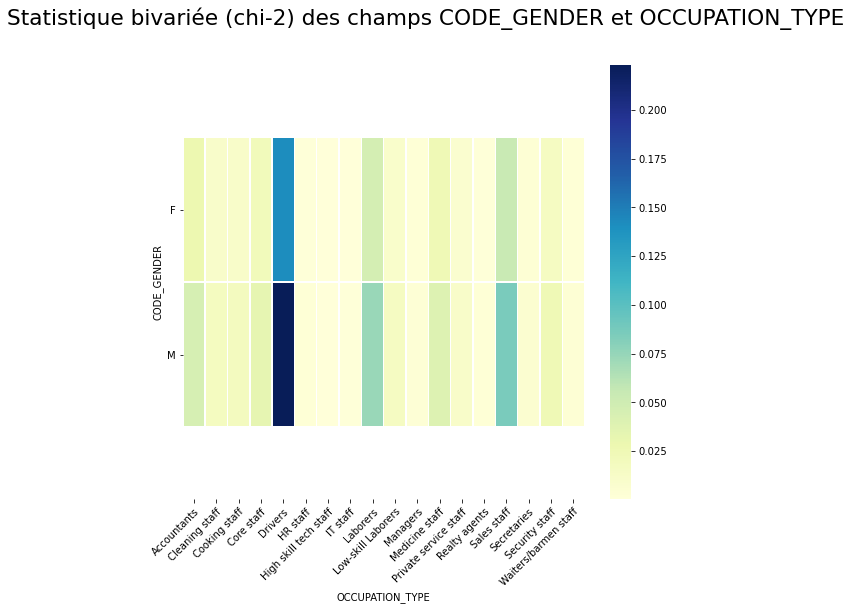

chi-2 entre CODE_GENDER et OCCUPATION_TYPE : 11300.821599593353 
phi-2 entre CODE_GENDER et OCCUPATION_TYPE : 0.33055903119879937 
coefficient T de Tschuprow entre CODE_GENDER et OCCUPATION_TYPE : 0.28314720772630886 
coefficient C de Cramer entre CODE_GENDER et OCCUPATION_TYPE : 0.5749426329633239 


In [47]:
myDf(dfApplication).Stat(['CODE_GENDER','OCCUPATION_TYPE'], typeStat='biv')

In [48]:
print('Nombre de lignes avec le champ vide:')
print((dfApplication[['CODE_GENDER', 'OCCUPATION_TYPE']].isnull()).sum())

Nombre de lignes avec le champ vide:
CODE_GENDER            1
OCCUPATION_TYPE    15812
dtype: int64


### Champs Building

#### Corrélations enre les champs _MEDI ou _AVG ou _MODE

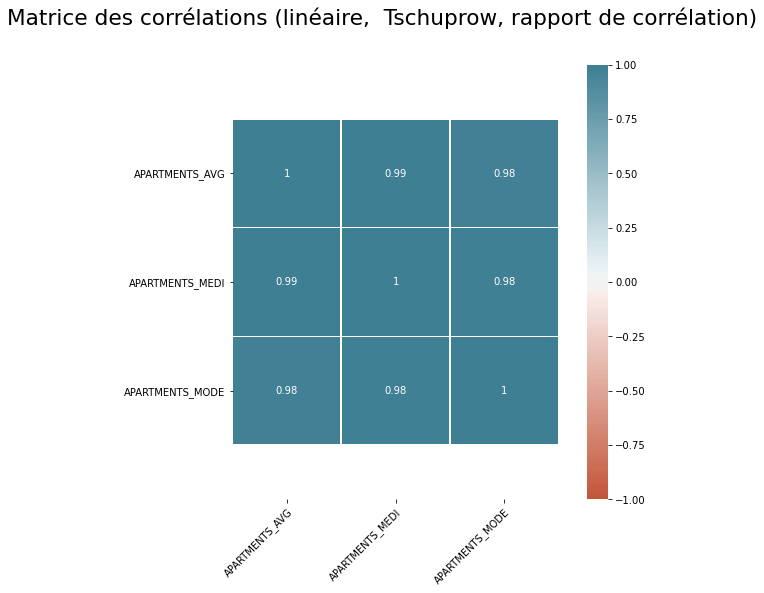

Nombre de lignes avec le champ vide:
APARTMENTS_AVG     25291
APARTMENTS_MEDI    25291
APARTMENTS_MODE    25291
dtype: int64


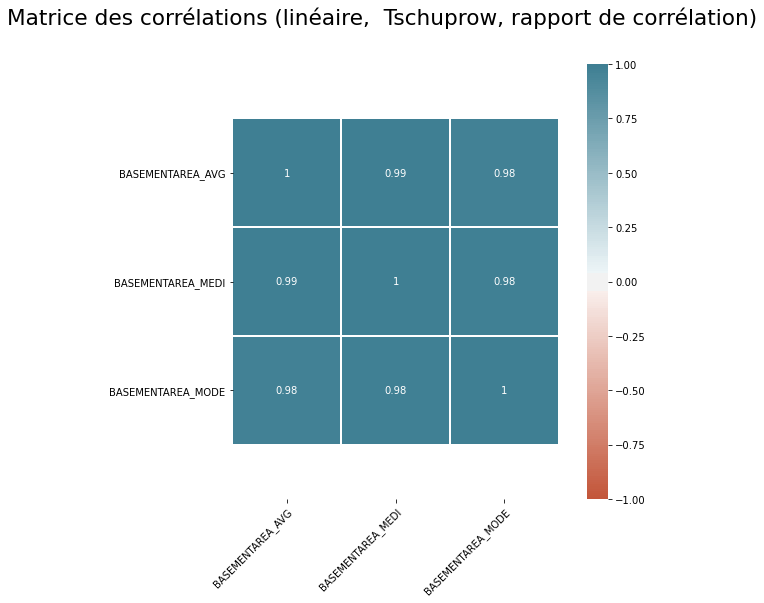

Nombre de lignes avec le champ vide:
BASEMENTAREA_AVG     29178
BASEMENTAREA_MEDI    29178
BASEMENTAREA_MODE    29178
dtype: int64


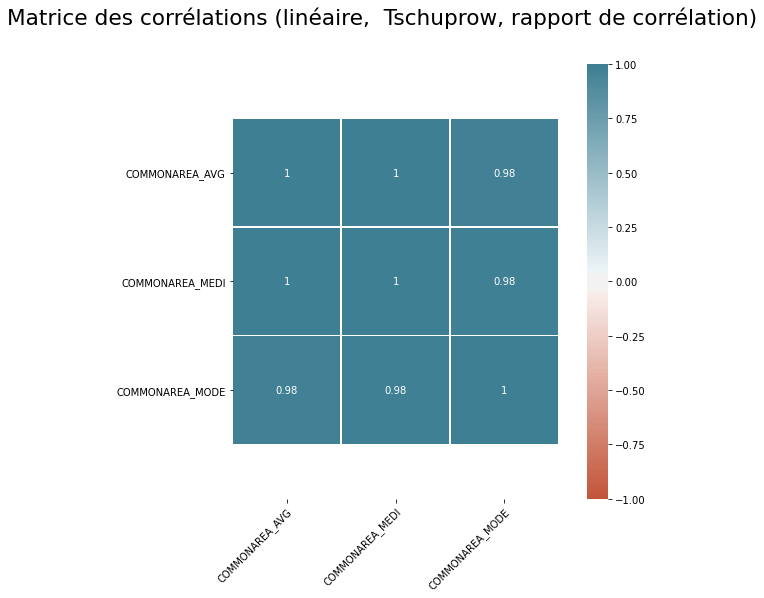

Nombre de lignes avec le champ vide:
COMMONAREA_AVG     34707
COMMONAREA_MEDI    34707
COMMONAREA_MODE    34707
dtype: int64


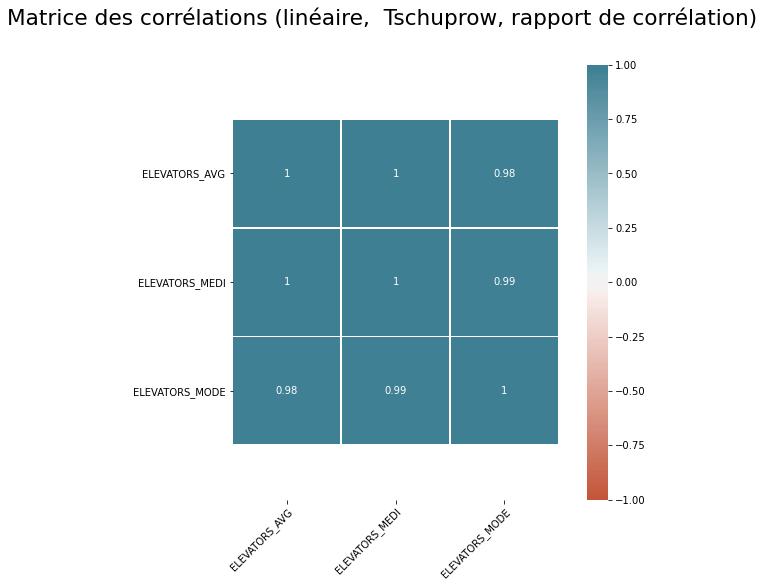

Nombre de lignes avec le champ vide:
ELEVATORS_AVG     26574
ELEVATORS_MEDI    26574
ELEVATORS_MODE    26574
dtype: int64


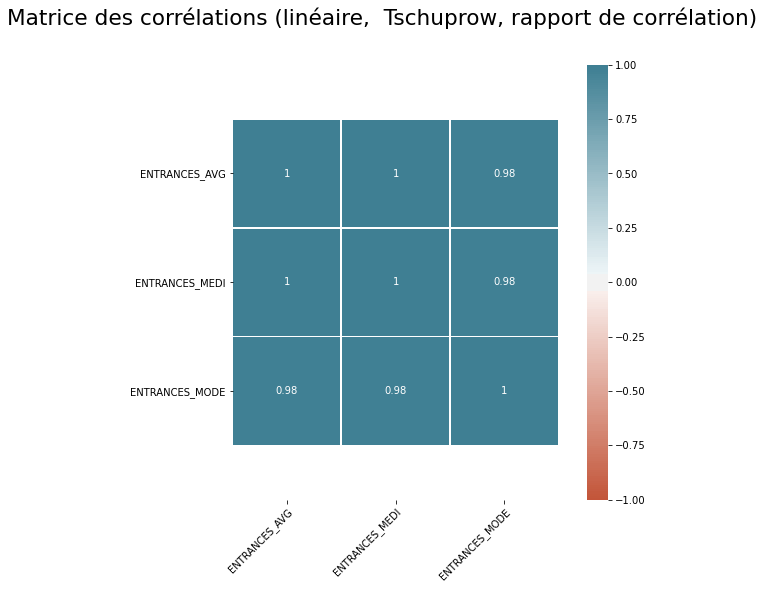

Nombre de lignes avec le champ vide:
ENTRANCES_AVG     25070
ENTRANCES_MEDI    25070
ENTRANCES_MODE    25070
dtype: int64


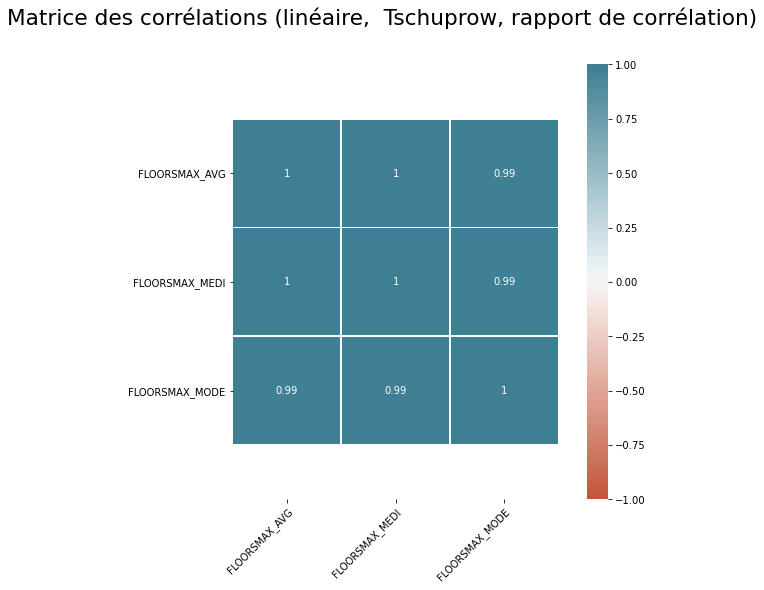

Nombre de lignes avec le champ vide:
FLOORSMAX_AVG     24781
FLOORSMAX_MEDI    24781
FLOORSMAX_MODE    24781
dtype: int64


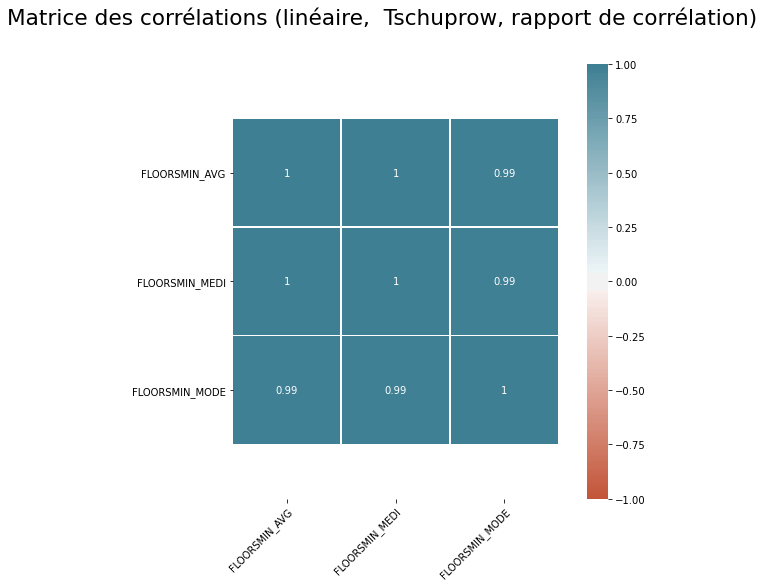

Nombre de lignes avec le champ vide:
FLOORSMIN_AVG     33735
FLOORSMIN_MEDI    33735
FLOORSMIN_MODE    33735
dtype: int64


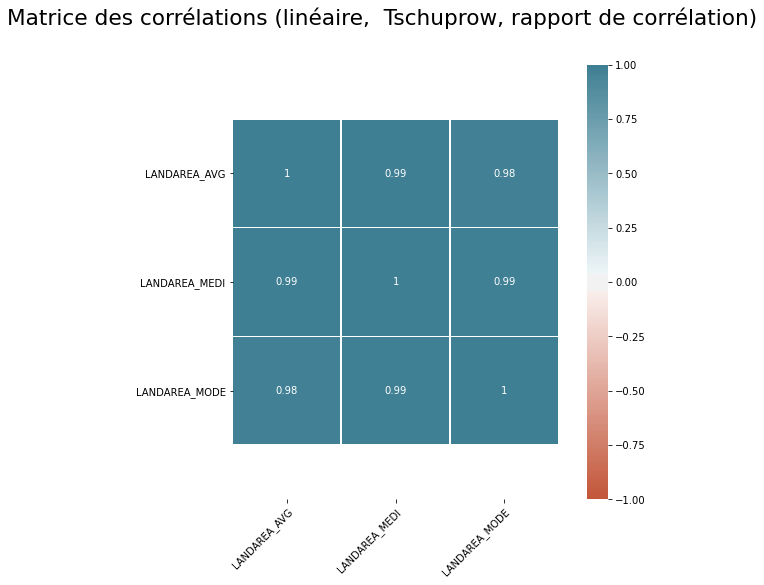

Nombre de lignes avec le champ vide:
LANDAREA_AVG     29463
LANDAREA_MEDI    29463
LANDAREA_MODE    29463
dtype: int64


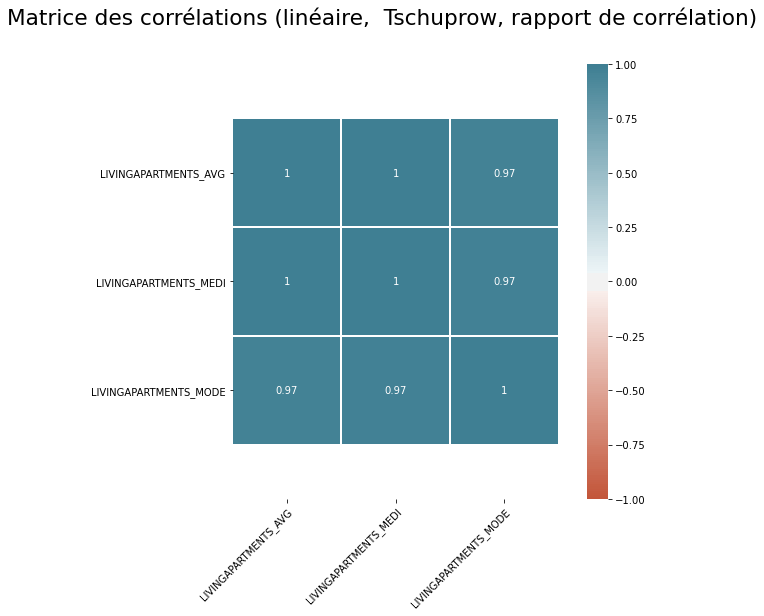

Nombre de lignes avec le champ vide:
LIVINGAPARTMENTS_AVG     33970
LIVINGAPARTMENTS_MEDI    33970
LIVINGAPARTMENTS_MODE    33970
dtype: int64


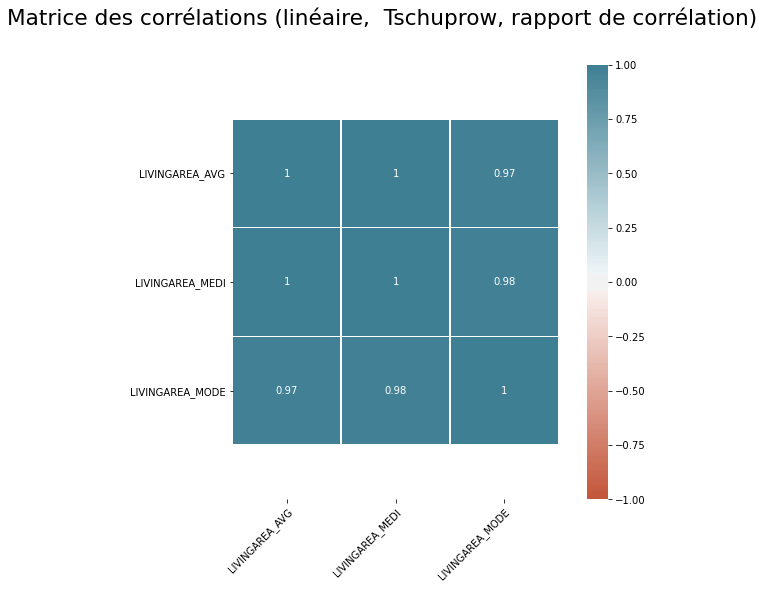

Nombre de lignes avec le champ vide:
LIVINGAREA_AVG     25033
LIVINGAREA_MEDI    25033
LIVINGAREA_MODE    25033
dtype: int64


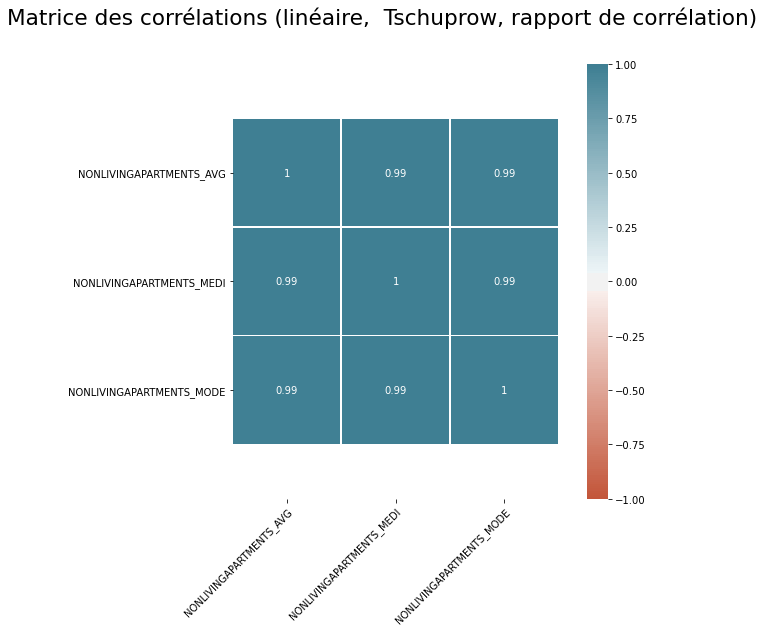

Nombre de lignes avec le champ vide:
NONLIVINGAPARTMENTS_AVG     34515
NONLIVINGAPARTMENTS_MEDI    34515
NONLIVINGAPARTMENTS_MODE    34515
dtype: int64


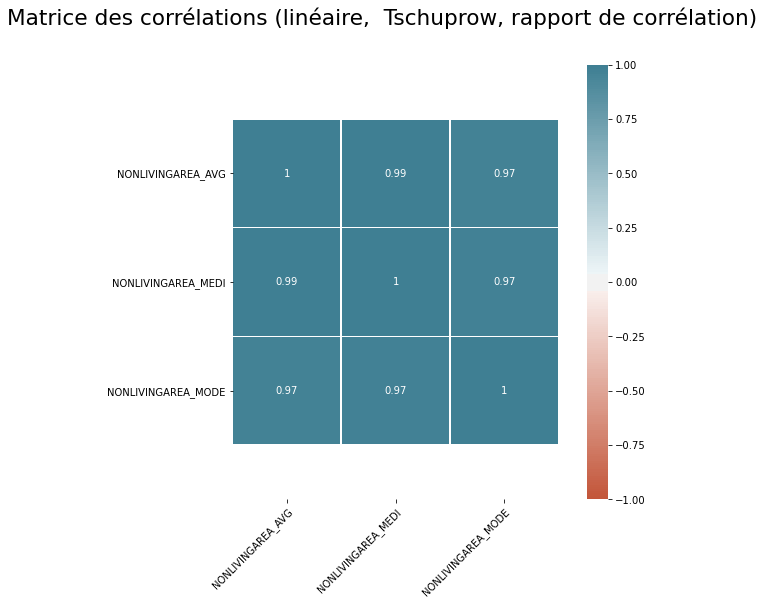

Nombre de lignes avec le champ vide:
NONLIVINGAREA_AVG     27538
NONLIVINGAREA_MEDI    27538
NONLIVINGAREA_MODE    27538
dtype: int64


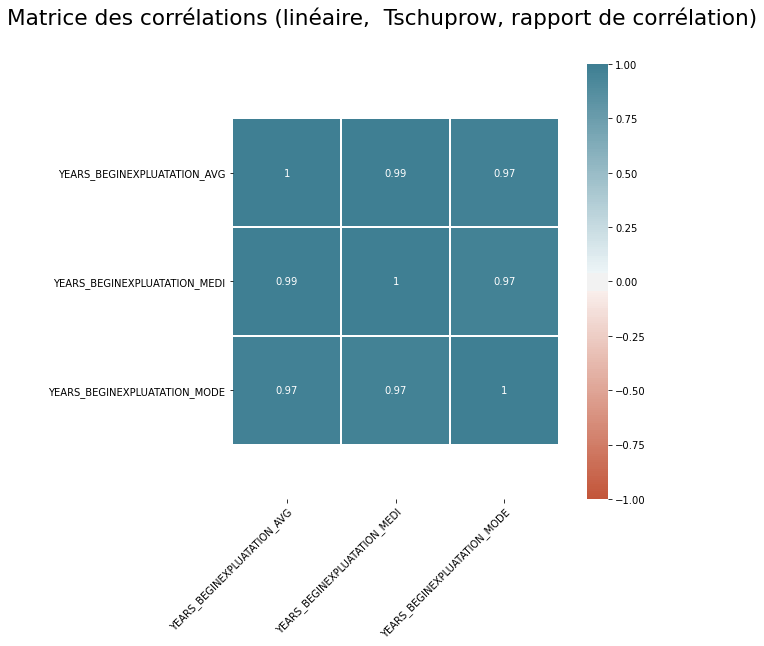

Nombre de lignes avec le champ vide:
YEARS_BEGINEXPLUATATION_AVG     24314
YEARS_BEGINEXPLUATATION_MEDI    24314
YEARS_BEGINEXPLUATATION_MODE    24314
dtype: int64


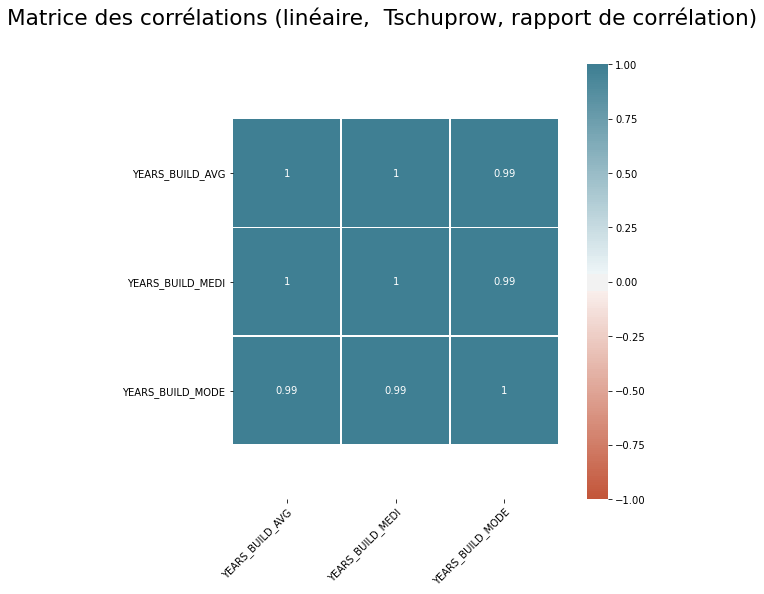

Nombre de lignes avec le champ vide:
YEARS_BUILD_AVG     33037
YEARS_BUILD_MEDI    33037
YEARS_BUILD_MODE    33037
dtype: int64


In [49]:
groups_cols= [['APARTMENTS_AVG','APARTMENTS_MEDI','APARTMENTS_MODE'],
['BASEMENTAREA_AVG','BASEMENTAREA_MEDI','BASEMENTAREA_MODE'],
['COMMONAREA_AVG','COMMONAREA_MEDI','COMMONAREA_MODE'],
['ELEVATORS_AVG','ELEVATORS_MEDI','ELEVATORS_MODE'],
['ENTRANCES_AVG','ENTRANCES_MEDI','ENTRANCES_MODE'],
['FLOORSMAX_AVG','FLOORSMAX_MEDI','FLOORSMAX_MODE'],
['FLOORSMIN_AVG','FLOORSMIN_MEDI','FLOORSMIN_MODE'],
['LANDAREA_AVG','LANDAREA_MEDI','LANDAREA_MODE'],
['LIVINGAPARTMENTS_AVG','LIVINGAPARTMENTS_MEDI','LIVINGAPARTMENTS_MODE'],
['LIVINGAREA_AVG','LIVINGAREA_MEDI','LIVINGAREA_MODE'],
['NONLIVINGAPARTMENTS_AVG','NONLIVINGAPARTMENTS_MEDI','NONLIVINGAPARTMENTS_MODE'],
['NONLIVINGAREA_AVG','NONLIVINGAREA_MEDI','NONLIVINGAREA_MODE'],
['YEARS_BEGINEXPLUATATION_AVG','YEARS_BEGINEXPLUATATION_MEDI','YEARS_BEGINEXPLUATATION_MODE'],
['YEARS_BUILD_AVG','YEARS_BUILD_MEDI','YEARS_BUILD_MODE']]
for group_cols in groups_cols:
    myDf(dfApplication).Stat(group_cols, typeStat='biv', bivOnlyCorrTable=True)
    print('Nombre de lignes avec le champ vide:')
    print((dfApplication[group_cols].isnull()).sum())    

In [50]:
dfApplication[['APARTMENTS_AVG','APARTMENTS_MEDI','APARTMENTS_MODE',
'BASEMENTAREA_AVG','BASEMENTAREA_MEDI','BASEMENTAREA_MODE',
'COMMONAREA_AVG','COMMONAREA_MEDI','COMMONAREA_MODE',
'ELEVATORS_AVG','ELEVATORS_MEDI','ELEVATORS_MODE',
'ENTRANCES_AVG','ENTRANCES_MEDI','ENTRANCES_MODE',
'FLOORSMAX_AVG','FLOORSMAX_MEDI','FLOORSMAX_MODE','FLOORSMIN_AVG',
'FLOORSMIN_MEDI','FLOORSMIN_MODE',
'LANDAREA_AVG','LANDAREA_MEDI','LANDAREA_MODE',
'LIVINGAPARTMENTS_AVG','LIVINGAPARTMENTS_MEDI','LIVINGAPARTMENTS_MODE',
'LIVINGAREA_AVG','LIVINGAREA_MEDI','LIVINGAREA_MODE',
'NONLIVINGAPARTMENTS_AVG','NONLIVINGAPARTMENTS_MEDI','NONLIVINGAPARTMENTS_MODE',
'NONLIVINGAREA_AVG','NONLIVINGAREA_MEDI','NONLIVINGAREA_MODE',
'YEARS_BEGINEXPLUATATION_AVG','YEARS_BEGINEXPLUATATION_MEDI','YEARS_BEGINEXPLUATATION_MODE',
'YEARS_BUILD_AVG','YEARS_BUILD_MEDI','YEARS_BUILD_MODE']].dtypes

APARTMENTS_AVG                  float64
APARTMENTS_MEDI                 float64
APARTMENTS_MODE                 float64
BASEMENTAREA_AVG                float64
BASEMENTAREA_MEDI               float64
BASEMENTAREA_MODE               float64
COMMONAREA_AVG                  float64
COMMONAREA_MEDI                 float64
COMMONAREA_MODE                 float64
ELEVATORS_AVG                   float64
ELEVATORS_MEDI                  float64
ELEVATORS_MODE                  float64
ENTRANCES_AVG                   float64
ENTRANCES_MEDI                  float64
ENTRANCES_MODE                  float64
FLOORSMAX_AVG                   float64
FLOORSMAX_MEDI                  float64
FLOORSMAX_MODE                  float64
FLOORSMIN_AVG                   float64
FLOORSMIN_MEDI                  float64
FLOORSMIN_MODE                  float64
LANDAREA_AVG                    float64
LANDAREA_MEDI                   float64
LANDAREA_MODE                   float64
LIVINGAPARTMENTS_AVG            float64


In [51]:
cols = ['APARTMENTS_AVG','APARTMENTS_MEDI',
'BASEMENTAREA_AVG','BASEMENTAREA_MEDI',
'COMMONAREA_AVG','COMMONAREA_MEDI',
'ELEVATORS_AVG','ELEVATORS_MEDI',
'ENTRANCES_AVG','ENTRANCES_MEDI',
'FLOORSMAX_AVG','FLOORSMAX_MEDI',
'FLOORSMIN_AVG','FLOORSMIN_MEDI',
'LANDAREA_AVG','LANDAREA_MEDI',
'LIVINGAPARTMENTS_AVG','LIVINGAPARTMENTS_MEDI',
'LIVINGAREA_AVG','LIVINGAREA_MEDI',
'NONLIVINGAPARTMENTS_AVG','NONLIVINGAPARTMENTS_MEDI',
'NONLIVINGAREA_AVG','NONLIVINGAREA_MEDI',
'YEARS_BEGINEXPLUATATION_AVG','YEARS_BEGINEXPLUATATION_MEDI',
'YEARS_BUILD_AVG','YEARS_BUILD_MEDI']
for col in cols:
    del dfApplication[col]

#### Corrélations entre champs MODE

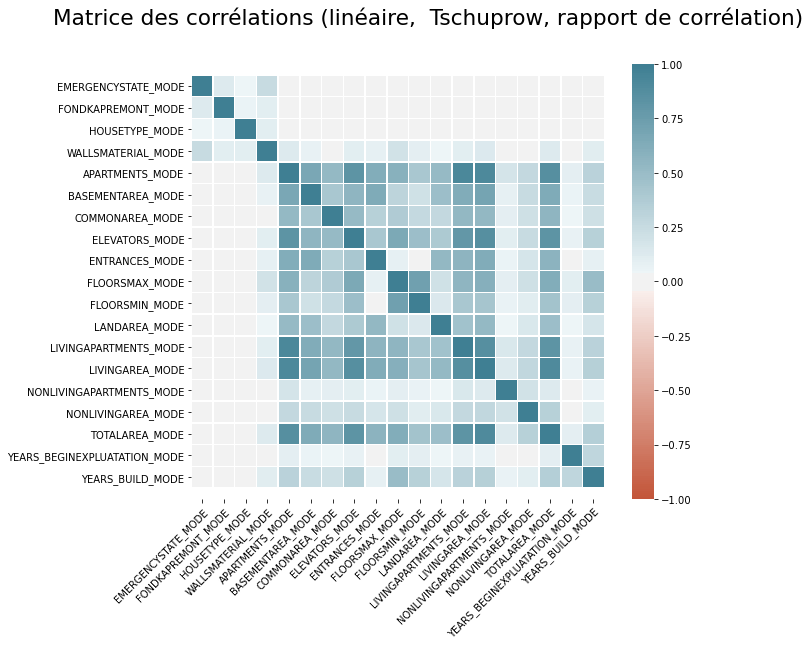

In [52]:
tmp = dfApplication[['APARTMENTS_MODE','BASEMENTAREA_MODE','COMMONAREA_MODE','ELEVATORS_MODE',
                            'EMERGENCYSTATE_MODE','ENTRANCES_MODE','FLOORSMAX_MODE','FLOORSMIN_MODE',
                            'FONDKAPREMONT_MODE','HOUSETYPE_MODE','LANDAREA_MODE','LIVINGAPARTMENTS_MODE','LIVINGAREA_MODE',
                            'NONLIVINGAPARTMENTS_MODE',
                            'NONLIVINGAREA_MODE','TOTALAREA_MODE','WALLSMATERIAL_MODE','YEARS_BEGINEXPLUATATION_MODE',
                            'YEARS_BUILD_MODE']]
myDf(tmp).Stat(typeStat='biv', bivOnlyCorrTable=True,  multivHeatAnnot=False)

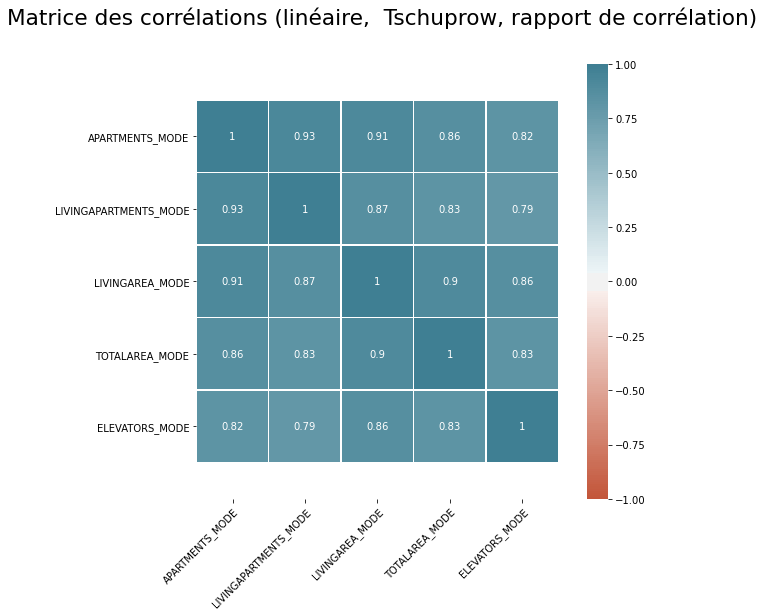

Nombre de lignes avec le champ vide:
APARTMENTS_MODE          25291
LIVINGAPARTMENTS_MODE    33970
LIVINGAREA_MODE          25033
TOTALAREA_MODE           24056
ELEVATORS_MODE           26574
dtype: int64


In [53]:
cols = ['APARTMENTS_MODE','LIVINGAPARTMENTS_MODE','LIVINGAREA_MODE','TOTALAREA_MODE','ELEVATORS_MODE']
tmp = dfApplication[cols]
myDf(tmp).Stat(typeStat='biv', bivOnlyCorrTable=True,  multivHeatAnnot=True)
print('Nombre de lignes avec le champ vide:')
print((dfApplication[cols].isnull()).sum())    
for col in ['LIVINGAPARTMENTS_MODE','LIVINGAREA_MODE','TOTALAREA_MODE','ELEVATORS_MODE']:
    del dfApplication[col]

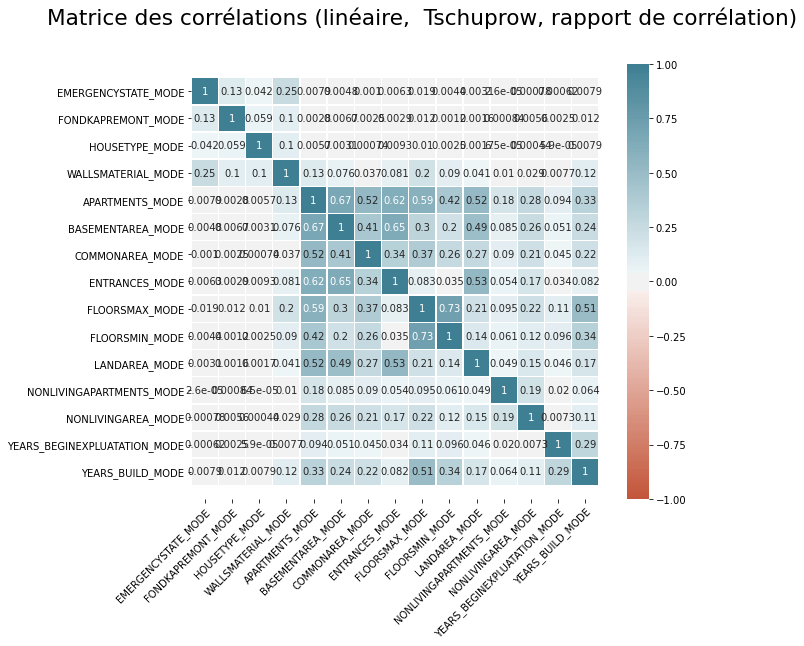

In [54]:
tmp = dfApplication[['APARTMENTS_MODE','BASEMENTAREA_MODE','COMMONAREA_MODE',
                            'EMERGENCYSTATE_MODE','ENTRANCES_MODE','FLOORSMAX_MODE','FLOORSMIN_MODE',
                            'FONDKAPREMONT_MODE','HOUSETYPE_MODE','LANDAREA_MODE',
                            'NONLIVINGAPARTMENTS_MODE',
                            'NONLIVINGAREA_MODE','WALLSMATERIAL_MODE','YEARS_BEGINEXPLUATATION_MODE',
                            'YEARS_BUILD_MODE']]
myDf(tmp).Stat(typeStat='biv', bivOnlyCorrTable=True,  multivHeatAnnot=True)

### Feature engineering sur NAME_EDUCATION_TYPE et NAME_FAMILY_STATUS

In [55]:
dfApplication.at[dfApplication[dfApplication.NAME_EDUCATION_TYPE == 'Academic degree'].index, "NAME_EDUCATION_TYPE_ORD"] = 1
dfApplication.at[dfApplication[dfApplication.NAME_EDUCATION_TYPE == 'Higher education'].index, "NAME_EDUCATION_TYPE_ORD"] = 2
dfApplication.at[dfApplication[dfApplication.NAME_EDUCATION_TYPE == 'Incomplete higher'].index, "NAME_EDUCATION_TYPE_ORD"] = 3
dfApplication.at[dfApplication[dfApplication.NAME_EDUCATION_TYPE == 'Secondary / secondary special'].index, "NAME_EDUCATION_TYPE_ORD"] = 4
dfApplication.at[dfApplication[dfApplication.NAME_EDUCATION_TYPE == 'Lower secondary'].index, "NAME_EDUCATION_TYPE_ORD"] = 5
dfApplication['NAME_EDUCATION_TYPE_ORD'] = dfApplication['NAME_EDUCATION_TYPE_ORD'].astype(float)

dfApplication.at[dfApplication[dfApplication.NAME_FAMILY_STATUS == 'Married'].index, "SINGLE_FLAG"] = 0
dfApplication.at[dfApplication[dfApplication.NAME_FAMILY_STATUS == 'Civil marriage'].index, "SINGLE_FLAG"] = 0
dfApplication.at[dfApplication[dfApplication.NAME_FAMILY_STATUS == 'Single / not married'].index, "SINGLE_FLAG"] = 1
dfApplication.at[dfApplication[dfApplication.NAME_FAMILY_STATUS == 'Separated'].index, "SINGLE_FLAG"] = 1
dfApplication.at[dfApplication[dfApplication.NAME_FAMILY_STATUS == 'Widow'].index, "SINGLE_FLAG"] = 1
dfApplication.at[dfApplication[dfApplication.NAME_FAMILY_STATUS == 'Unknown'].index, "SINGLE_FLAG"] = 1
dfApplication['SINGLE_FLAG'] = dfApplication['SINGLE_FLAG'].astype(float)

### Matrice des corrélations des variables restantes

/home/pierre/Documents/Projet_7/Git/credit_scoring/myTools.py:1477: RuntimeWarning: invalid value encountered in double_scalars
  tschuprow = math.sqrt(phi2 / math.sqrt((r-1)*(c-1)))
/home/pierre/Documents/Projet_7/Git/credit_scoring/myTools.py:1478: RuntimeWarning: invalid value encountered in double_scalars
  cramer = math.sqrt(phi2/(min(r,c)-1))


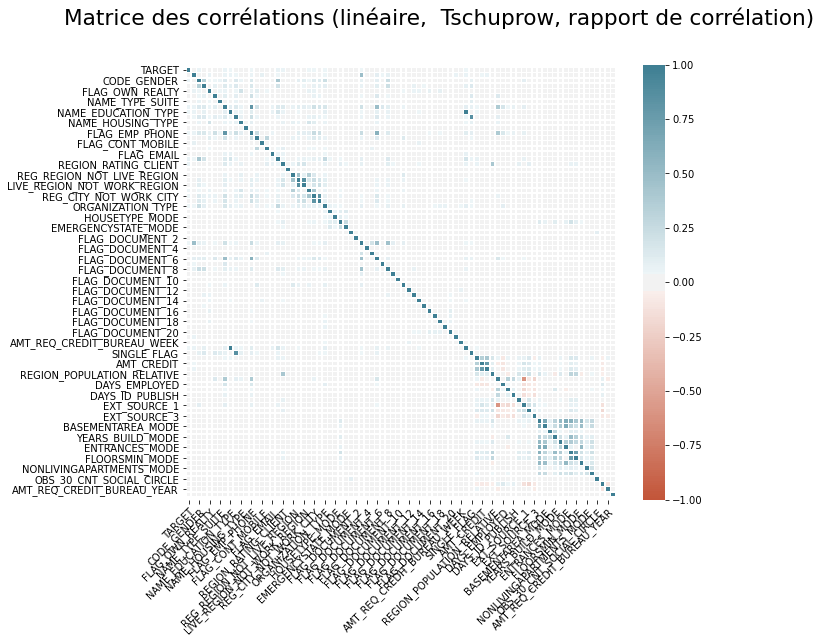

In [56]:
myDf(dfApplication).Stat(exclCol=['SK_ID_CURR'], typeStat='biv', bivOnlyCorrTable=True, multivHeatAnnot=False)

### Statistique univariée

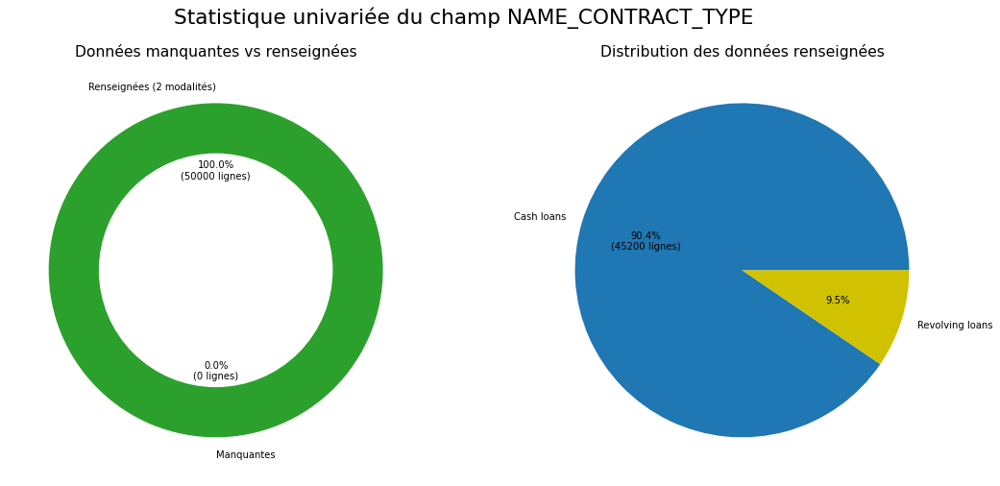

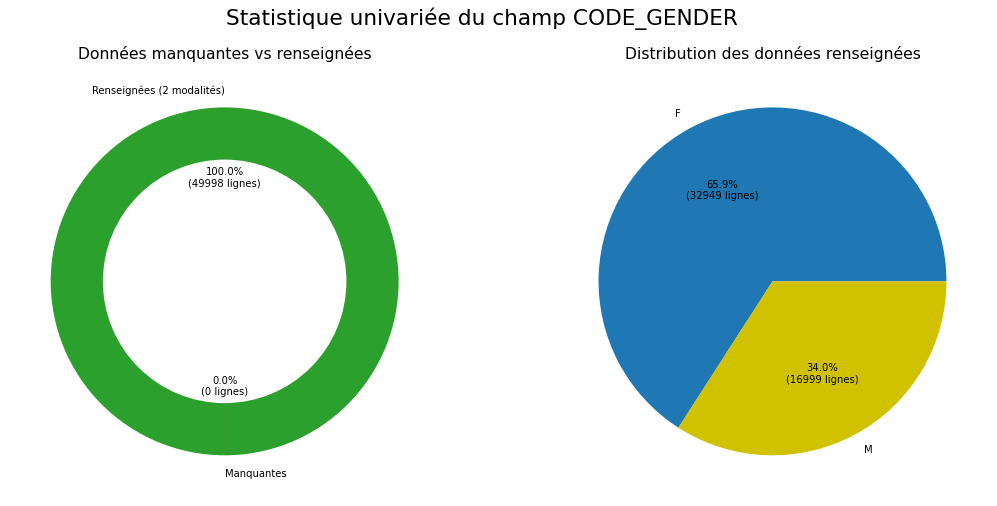

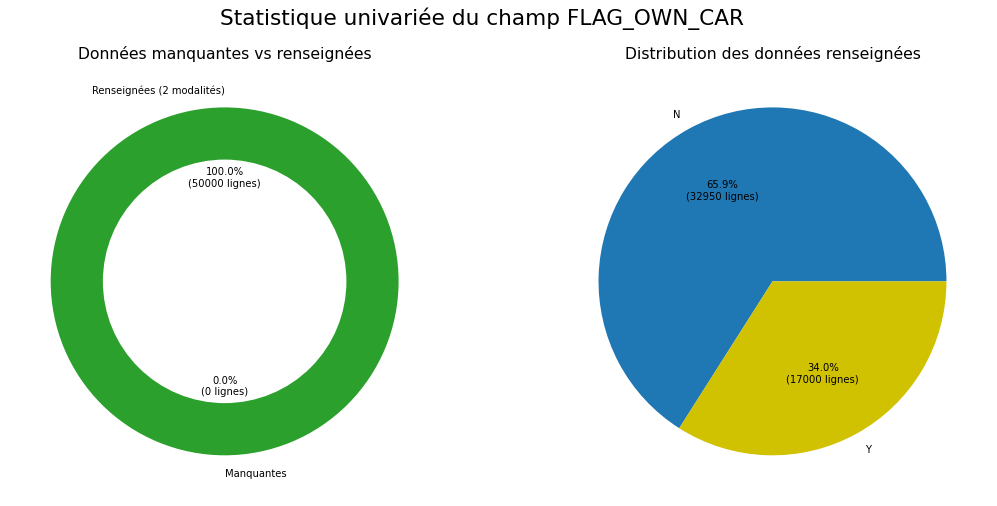

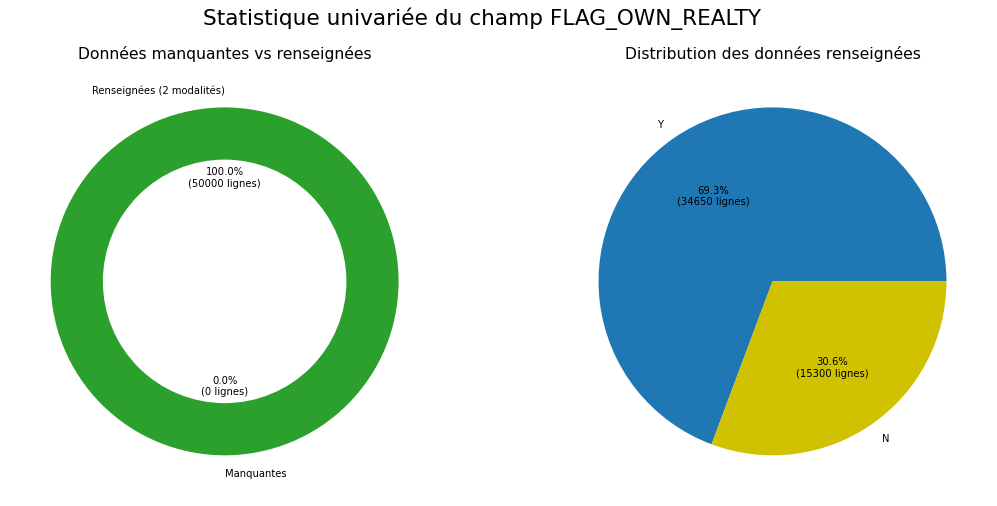

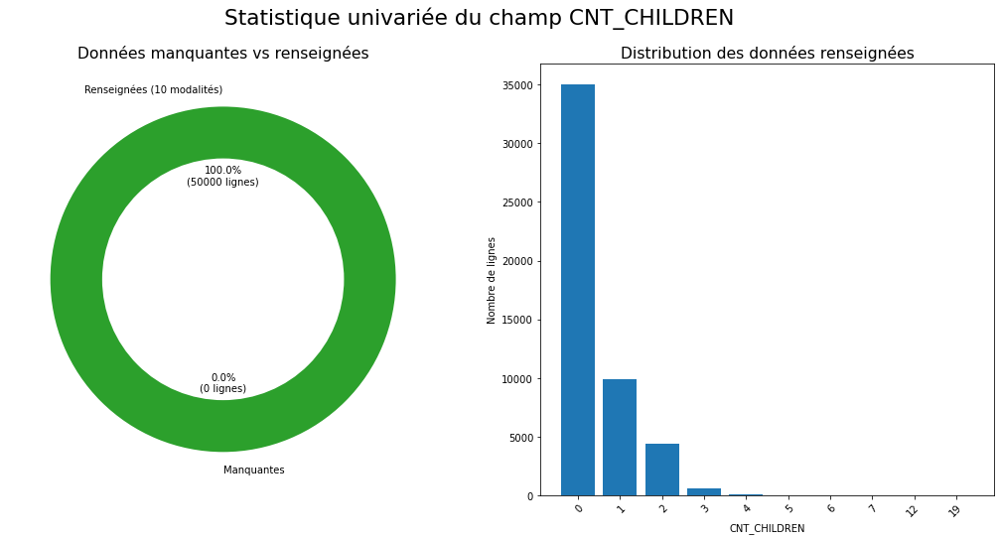

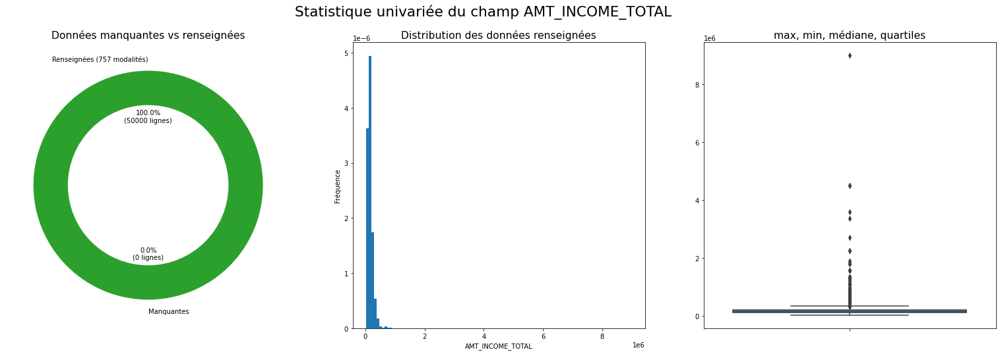

Mesures de position
 - Moyenne: 168595.59
 - Médiane: 145683.0
Mesures de dispertion
 - Ecart type: 110014.03
 - Min: 25650.0
 - Q25: 112500.0
 - Q75: 202500.0
 - Max: 9000000.0
Mesures de forme
 - Skewness (asymétrie): 16.51
 - Kurtosis (applatissement): 984.57


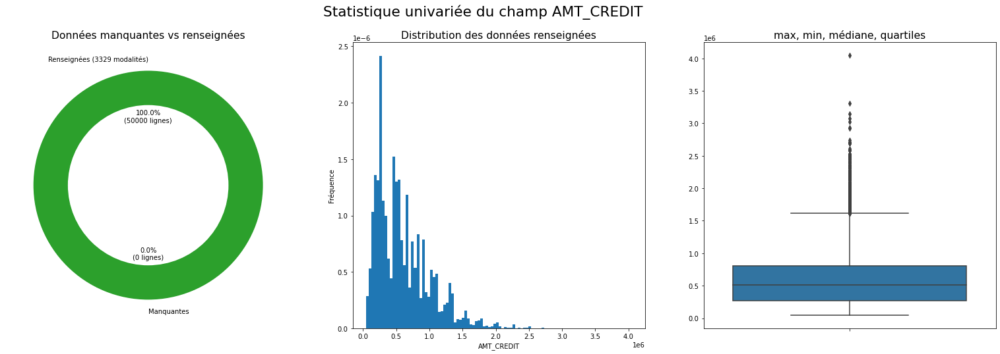

Mesures de position
 - Moyenne: 599505.82
 - Médiane: 513000.0
Mesures de dispertion
 - Ecart type: 403763.79
 - Min: 45000.0
 - Q25: 270000.0
 - Q75: 808650.0
 - Max: 4050000.0
Mesures de forme
 - Skewness (asymétrie): 1.24
 - Kurtosis (applatissement): 1.9


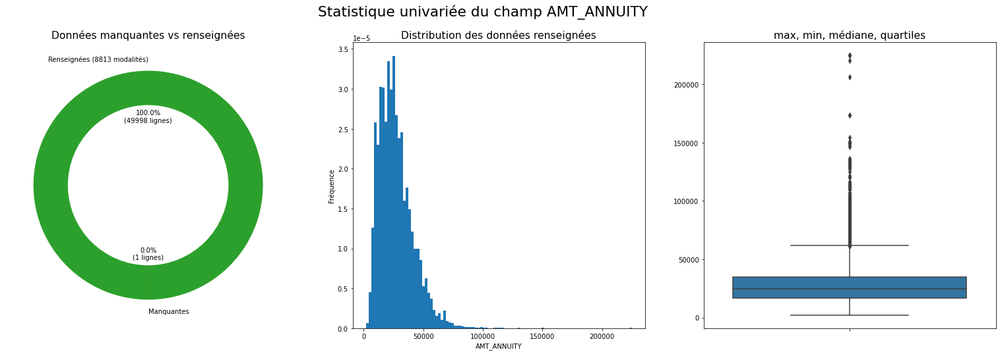

Mesures de position
 - Moyenne: 27101.6
 - Médiane: 24880.5
Mesures de dispertion
 - Ecart type: 14511.56
 - Min: 1993.5
 - Q25: 16537.5
 - Q75: 34636.5
 - Max: 225000.0
Mesures de forme
 - Skewness (asymétrie): 1.58
 - Kurtosis (applatissement): 7.64


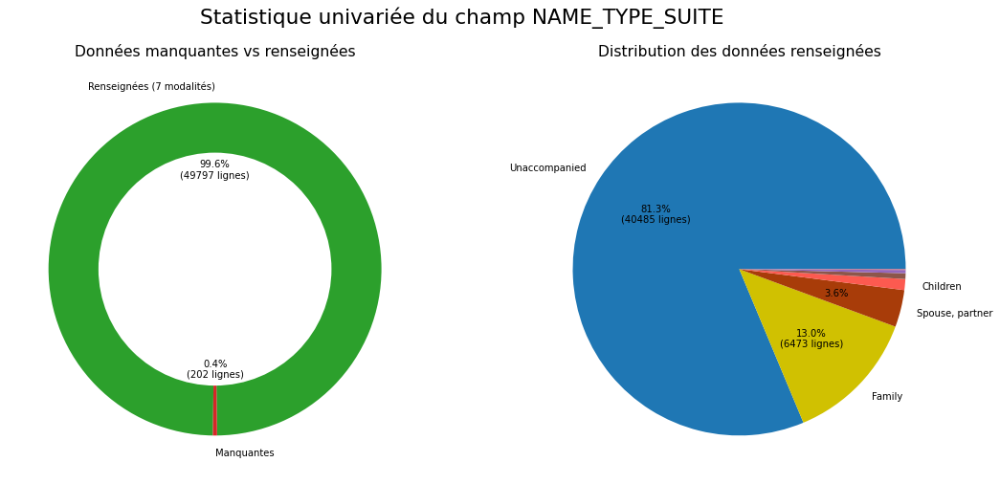

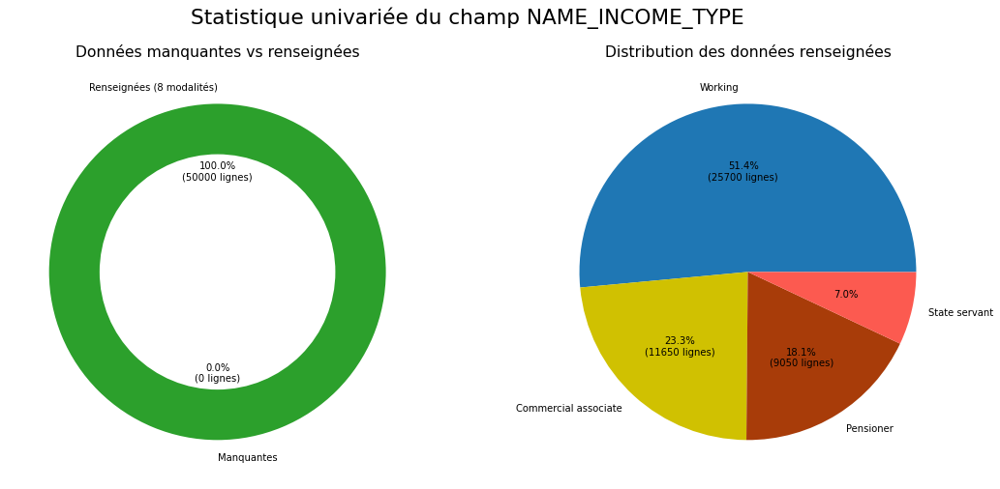

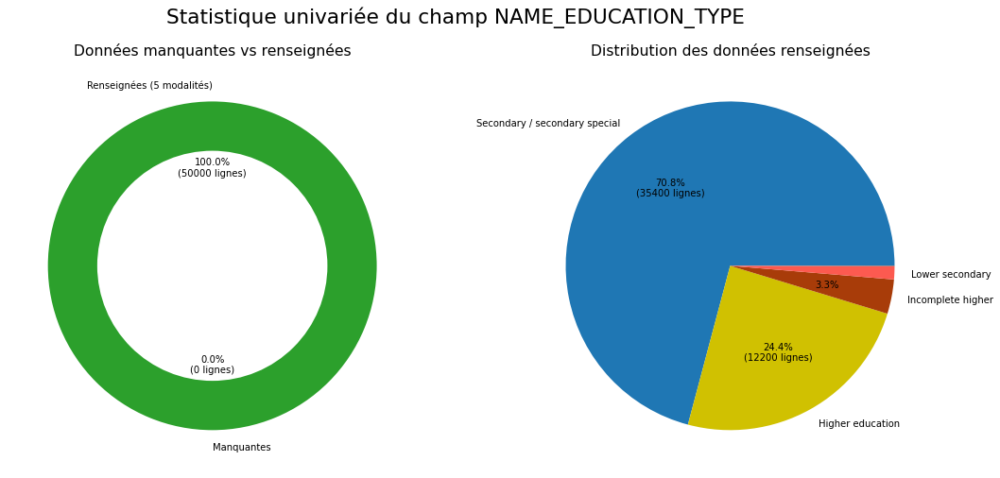

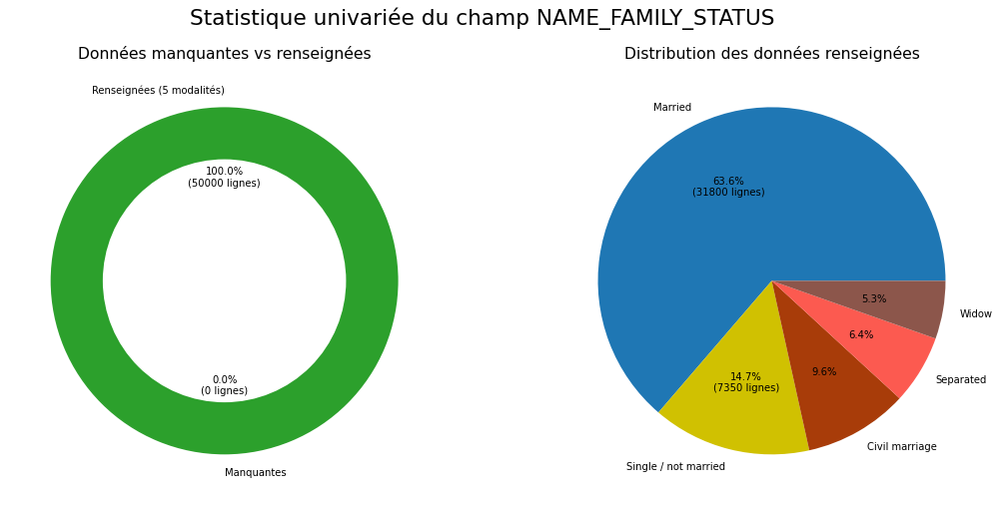

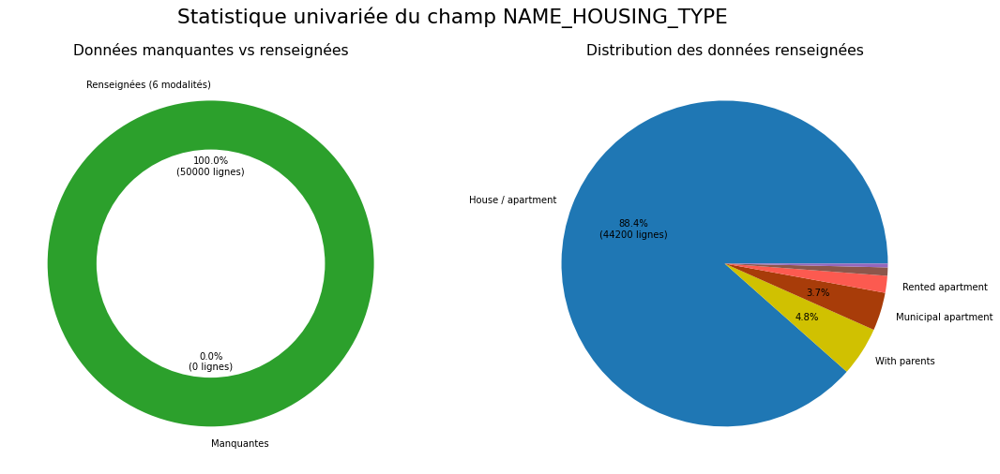

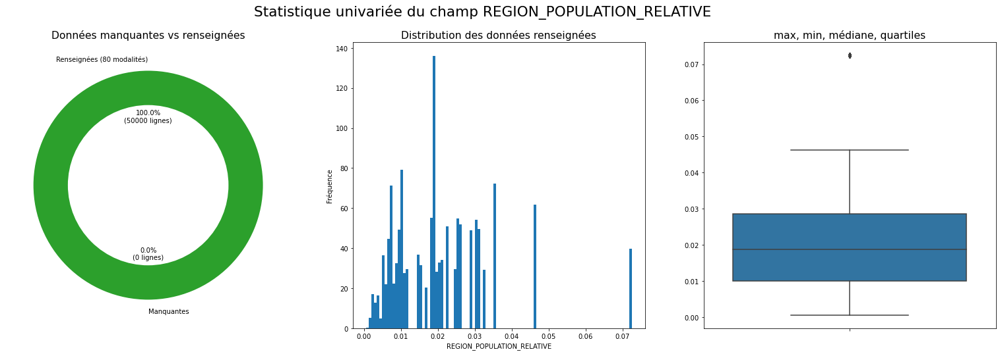

Mesures de position
 - Moyenne: 0.02
 - Médiane: 0.02
Mesures de dispertion
 - Ecart type: 0.01
 - Min: 0.0
 - Q25: 0.01
 - Q75: 0.03
 - Max: 0.07
Mesures de forme
 - Skewness (asymétrie): 1.51
 - Kurtosis (applatissement): 3.28


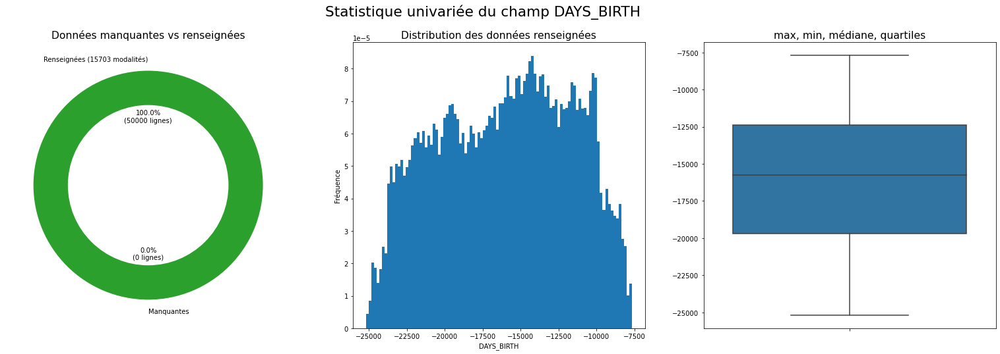

Mesures de position
 - Moyenne: -16050.39
 - Médiane: -15767.0
Mesures de dispertion
 - Ecart type: 4381.57
 - Min: -25192
 - Q25: -19703.0
 - Q75: -12399.0
 - Max: -7680
Mesures de forme
 - Skewness (asymétrie): -0.11
 - Kurtosis (applatissement): -1.06


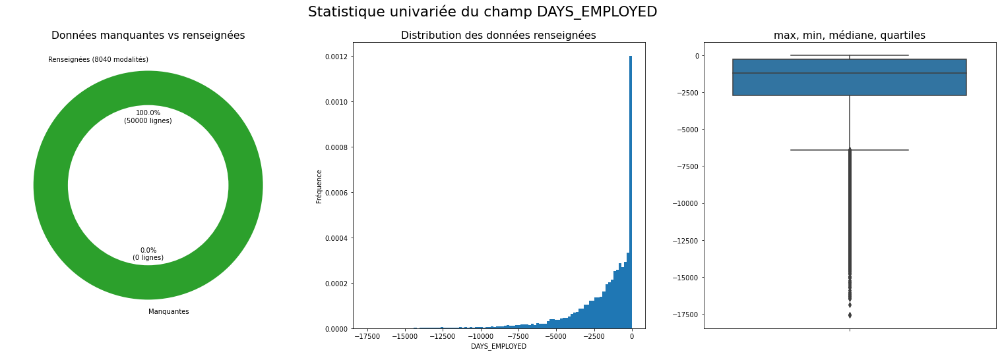

Mesures de position
 - Moyenne: -1942.59
 - Médiane: -1197.5
Mesures de dispertion
 - Ecart type: 2305.06
 - Min: -17583
 - Q25: -2738.0
 - Q75: -282.0
 - Max: 1
Mesures de forme
 - Skewness (asymétrie): -2.06
 - Kurtosis (applatissement): 5.26


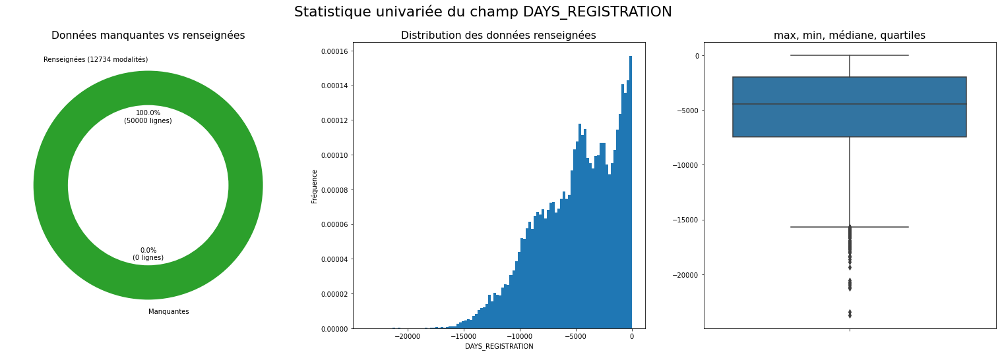

Mesures de position
 - Moyenne: -4978.04
 - Médiane: -4482.0
Mesures de dispertion
 - Ecart type: 3529.48
 - Min: -23738.0
 - Q25: -7480.0
 - Q75: -2011.0
 - Max: 0.0
Mesures de forme
 - Skewness (asymétrie): -0.6
 - Kurtosis (applatissement): -0.29


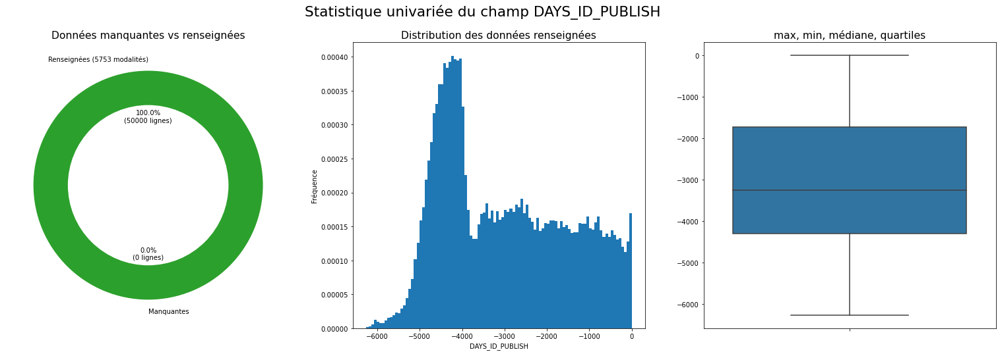

Mesures de position
 - Moyenne: -2997.6
 - Médiane: -3250.0
Mesures de dispertion
 - Ecart type: 1505.73
 - Min: -6265
 - Q25: -4298.0
 - Q75: -1728.0
 - Max: 0
Mesures de forme
 - Skewness (asymétrie): 0.35
 - Kurtosis (applatissement): -1.1


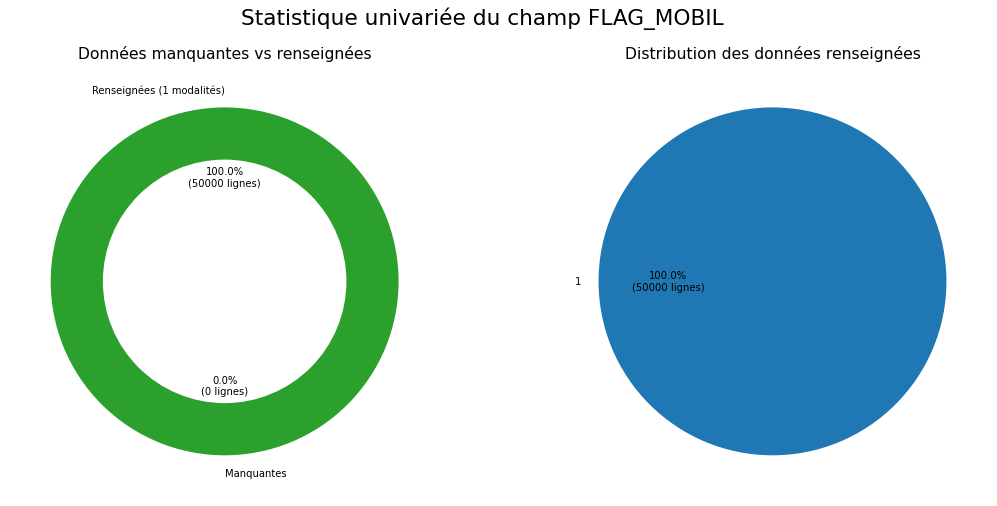

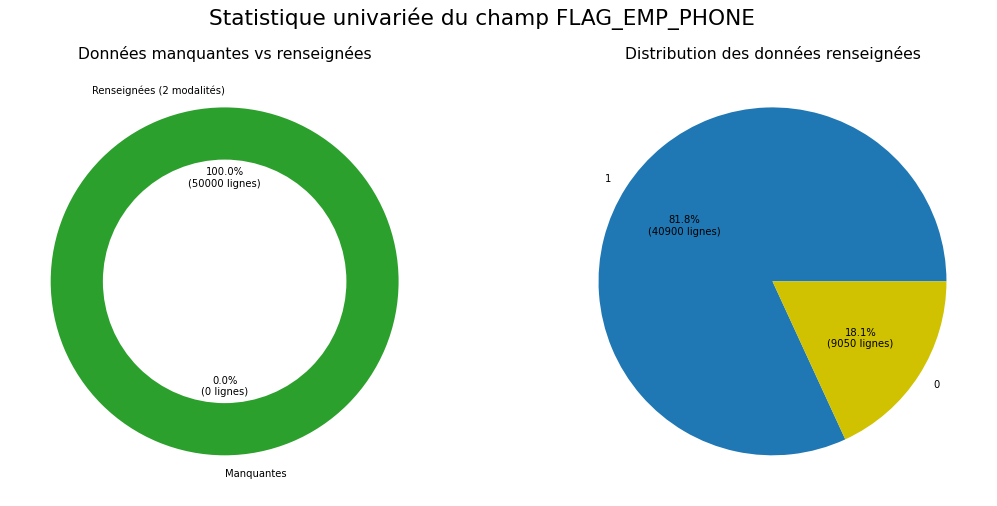

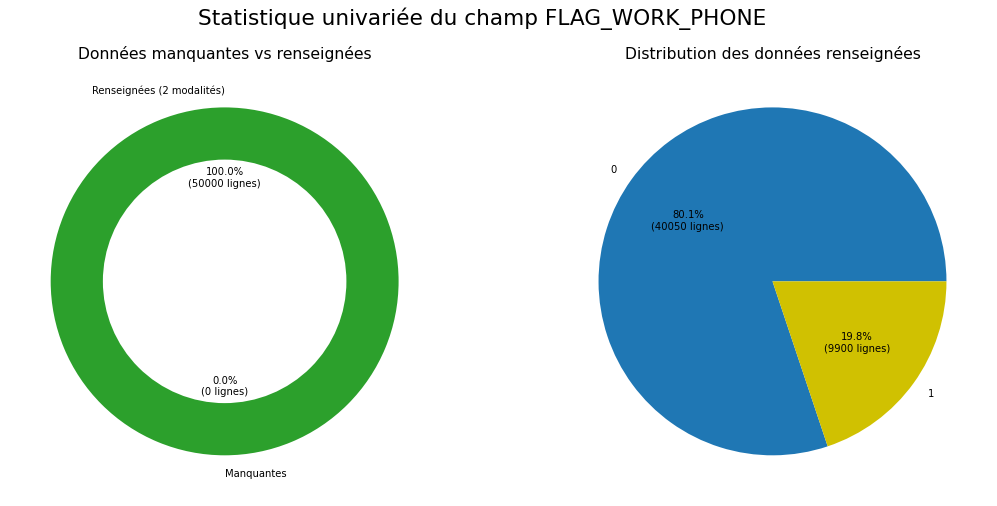

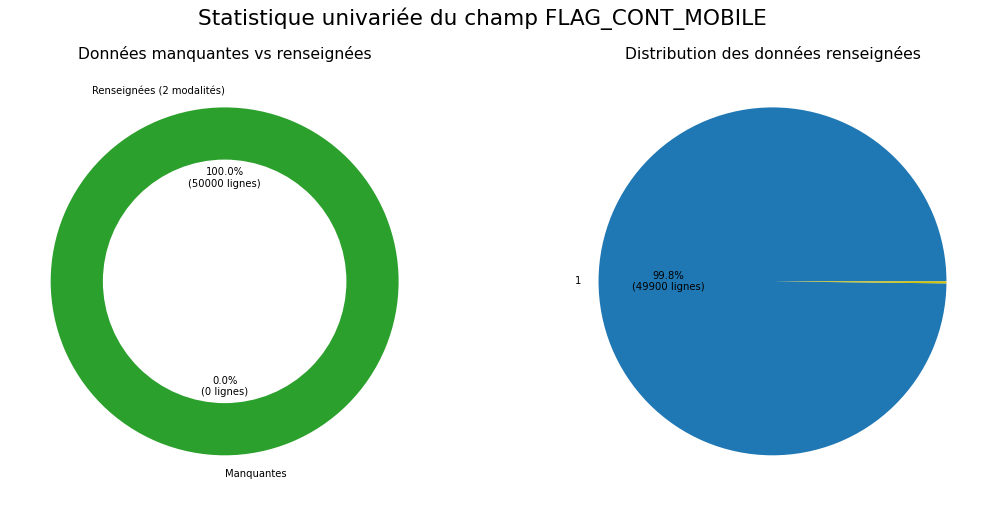

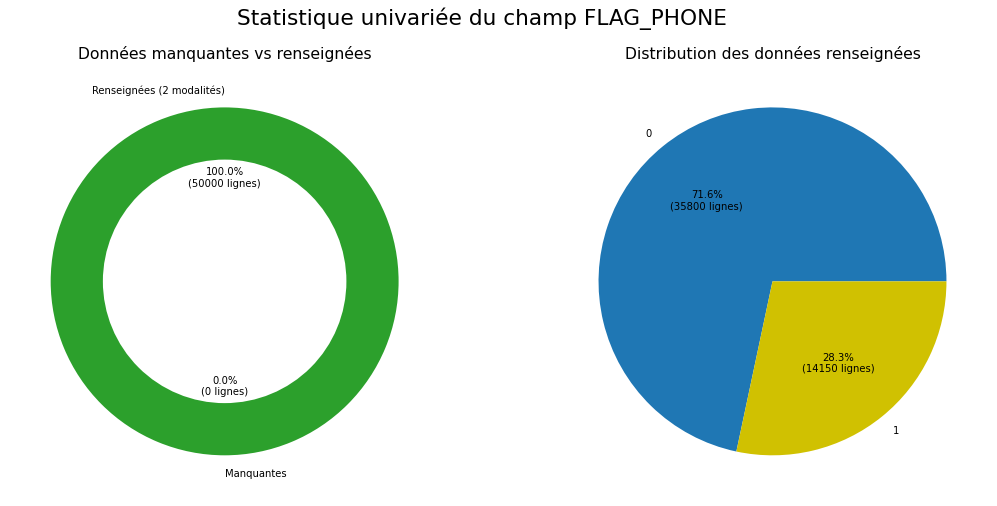

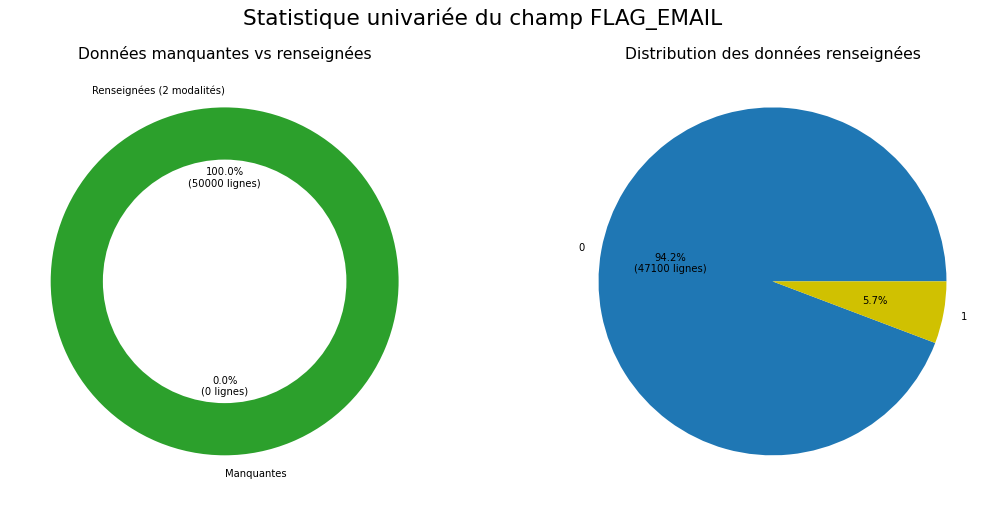

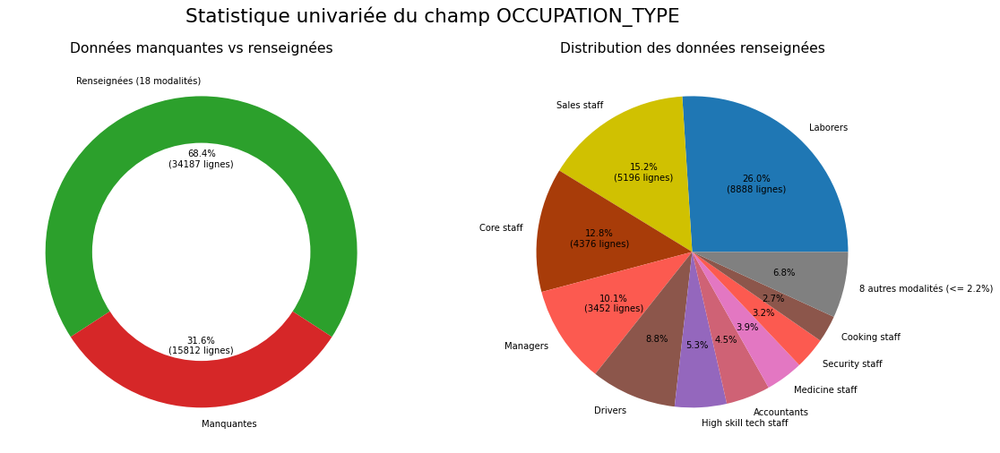

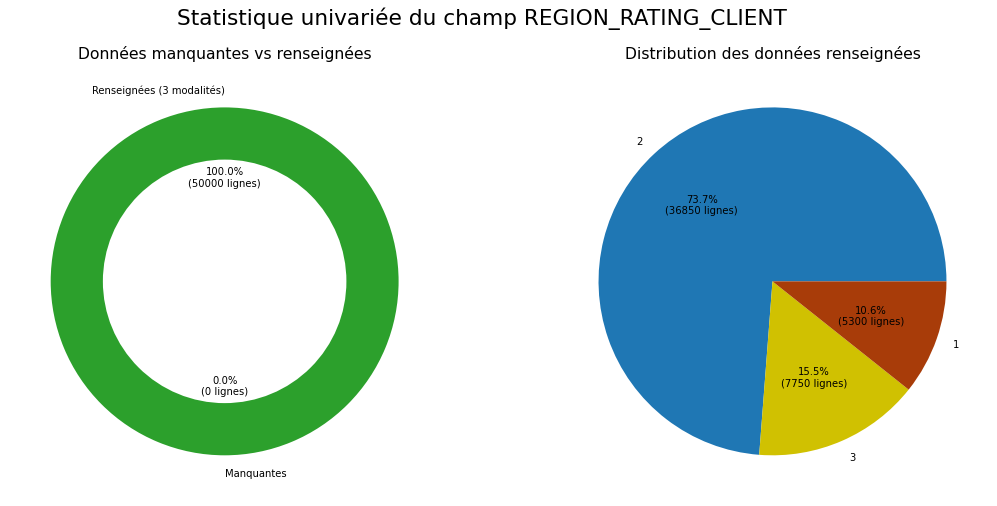

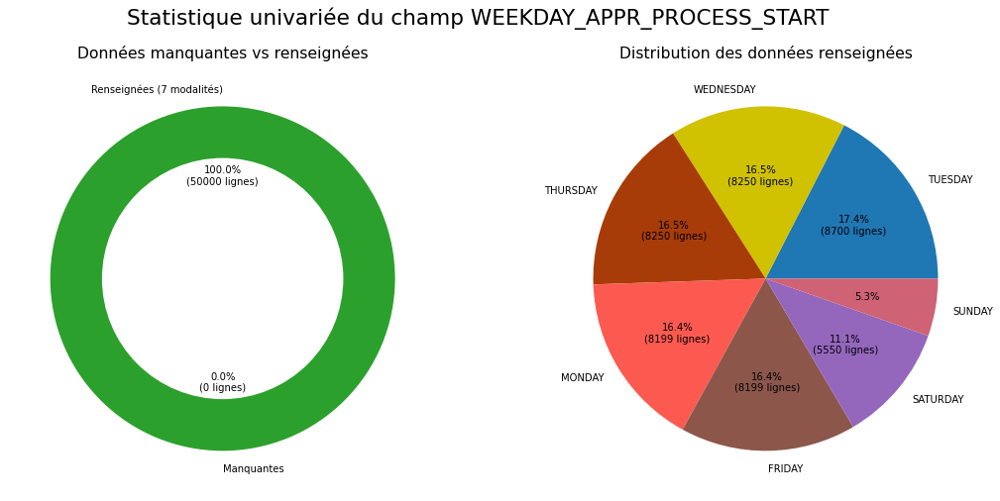

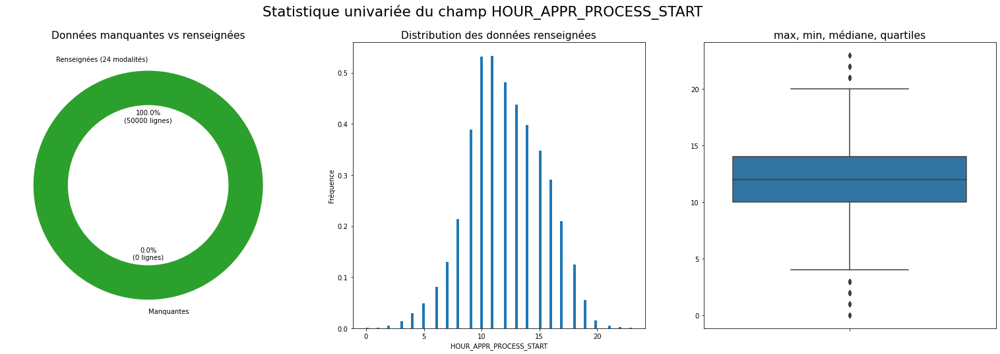

Mesures de position
 - Moyenne: 12.07
 - Médiane: 12.0
Mesures de dispertion
 - Ecart type: 3.25
 - Min: 0
 - Q25: 10.0
 - Q75: 14.0
 - Max: 23
Mesures de forme
 - Skewness (asymétrie): -0.02
 - Kurtosis (applatissement): -0.2


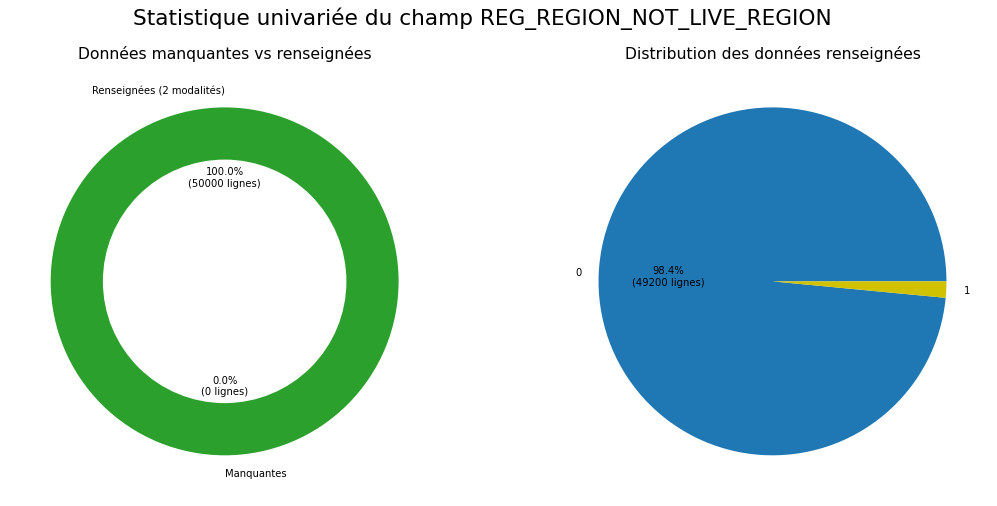

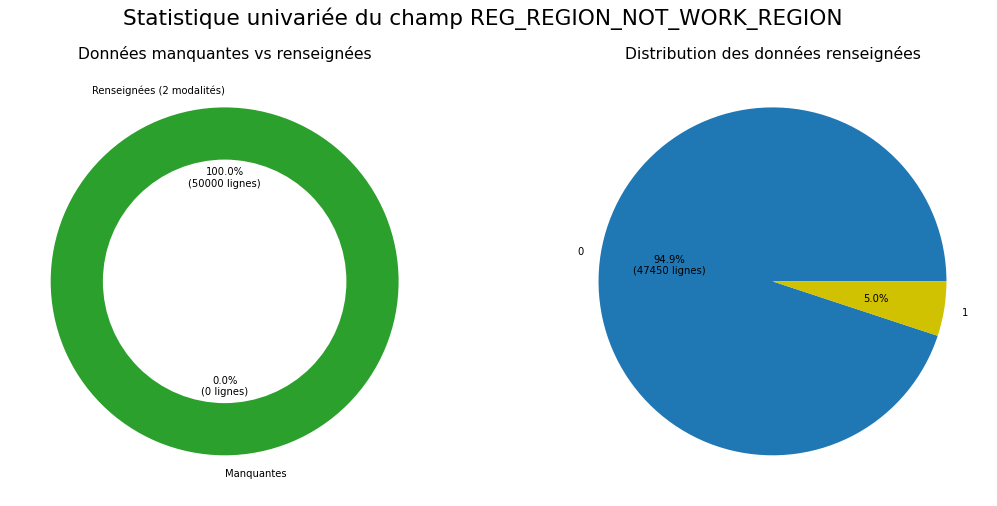

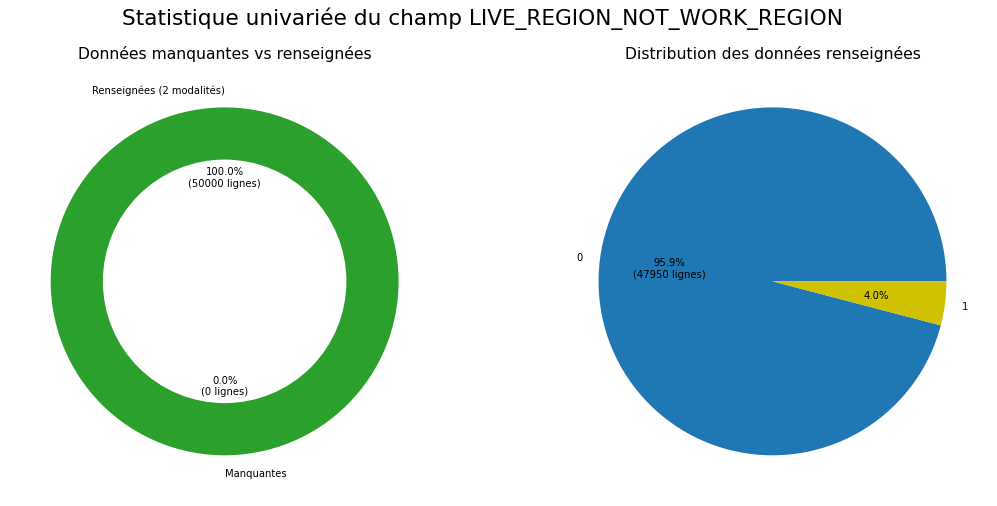

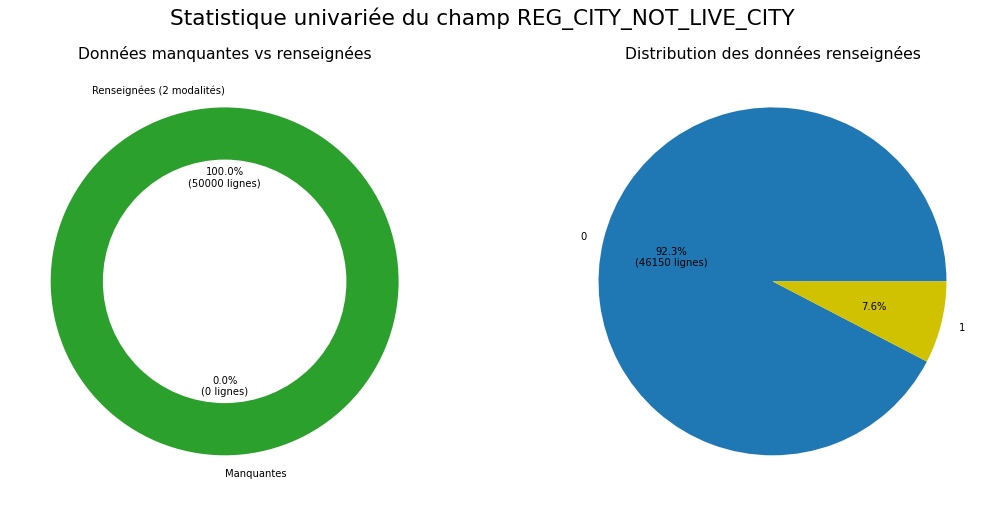

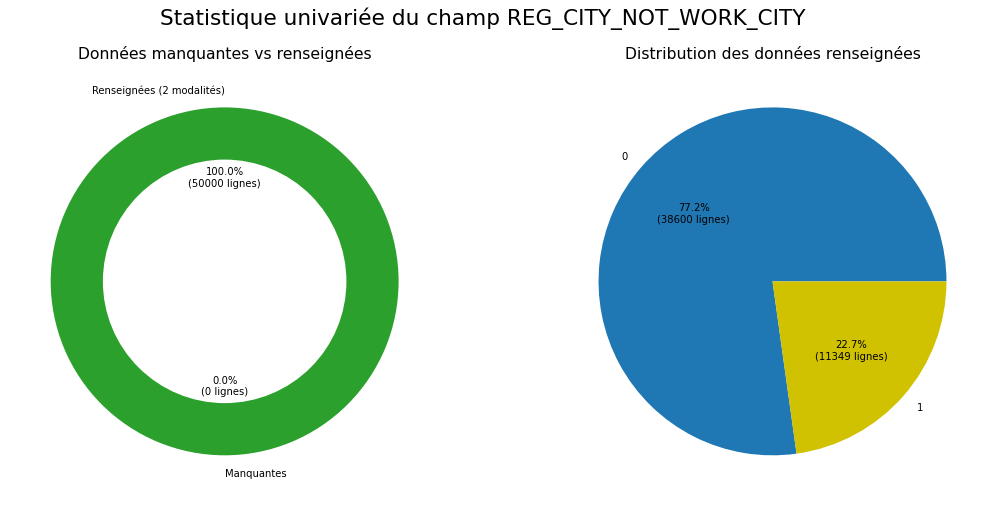

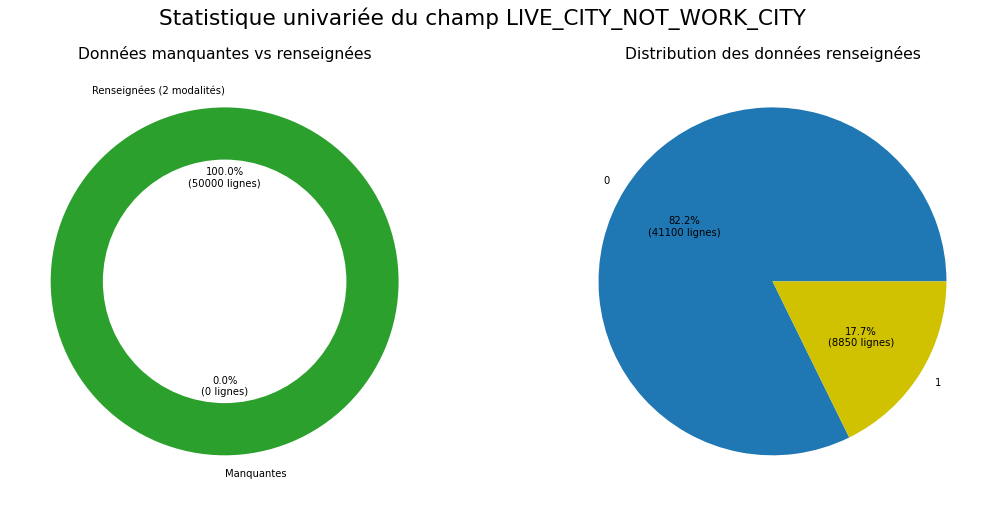

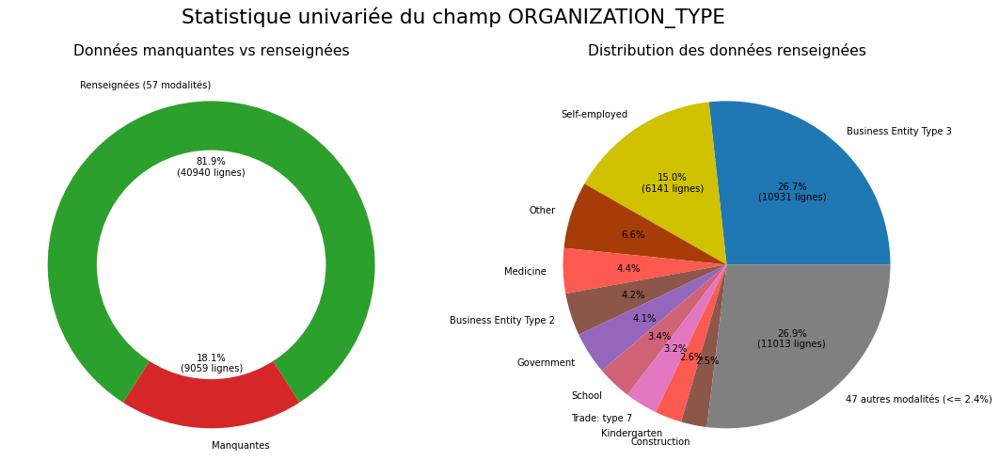

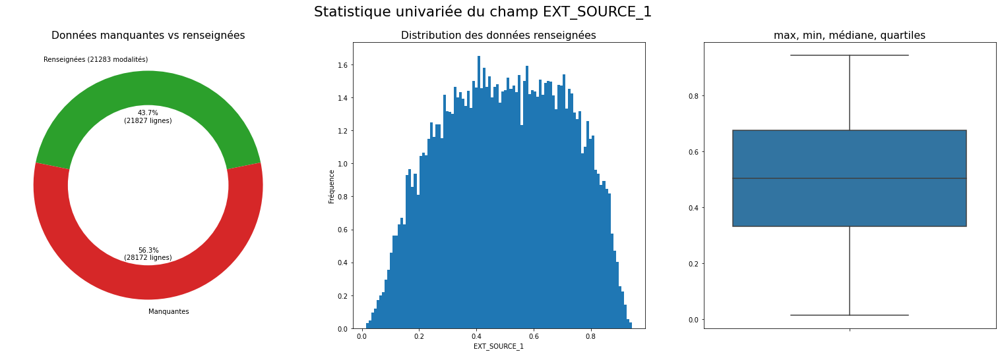

Mesures de position
 - Moyenne: 0.5
 - Médiane: 0.5
Mesures de dispertion
 - Ecart type: 0.21
 - Min: 0.01
 - Q25: 0.33
 - Q75: 0.68
 - Max: 0.94
Mesures de forme
 - Skewness (asymétrie): -0.06
 - Kurtosis (applatissement): -0.98


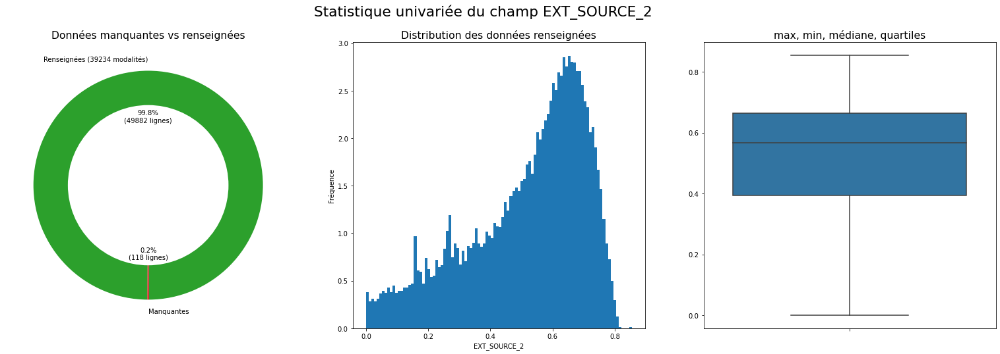

Mesures de position
 - Moyenne: 0.52
 - Médiane: 0.57
Mesures de dispertion
 - Ecart type: 0.19
 - Min: 0.0
 - Q25: 0.39
 - Q75: 0.66
 - Max: 0.85
Mesures de forme
 - Skewness (asymétrie): -0.79
 - Kurtosis (applatissement): -0.27


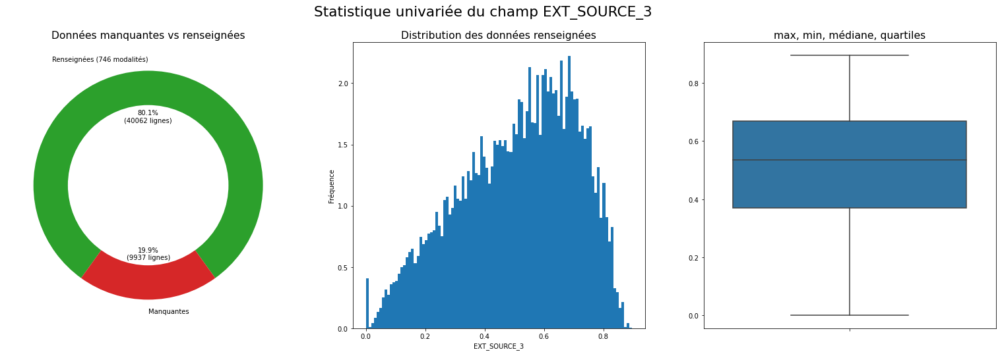

Mesures de position
 - Moyenne: 0.51
 - Médiane: 0.54
Mesures de dispertion
 - Ecart type: 0.2
 - Min: 0.0
 - Q25: 0.37
 - Q75: 0.67
 - Max: 0.9
Mesures de forme
 - Skewness (asymétrie): -0.41
 - Kurtosis (applatissement): -0.67


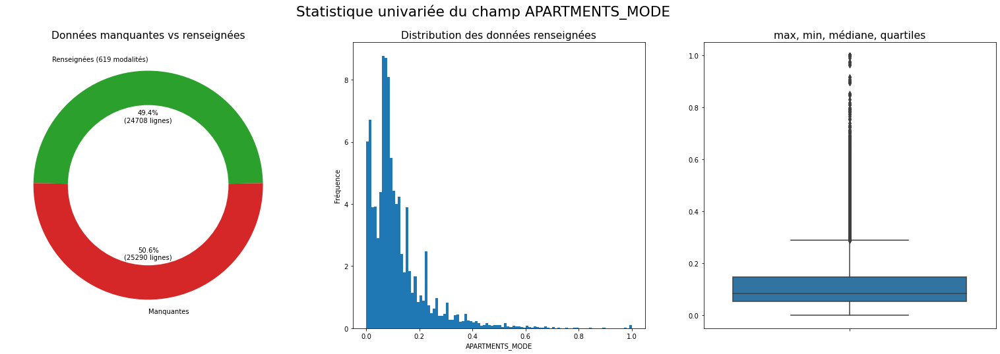

Mesures de position
 - Moyenne: 0.12
 - Médiane: 0.08
Mesures de dispertion
 - Ecart type: 0.11
 - Min: 0.0
 - Q25: 0.05
 - Q75: 0.15
 - Max: 1.0
Mesures de forme
 - Skewness (asymétrie): 2.67
 - Kurtosis (applatissement): 11.37


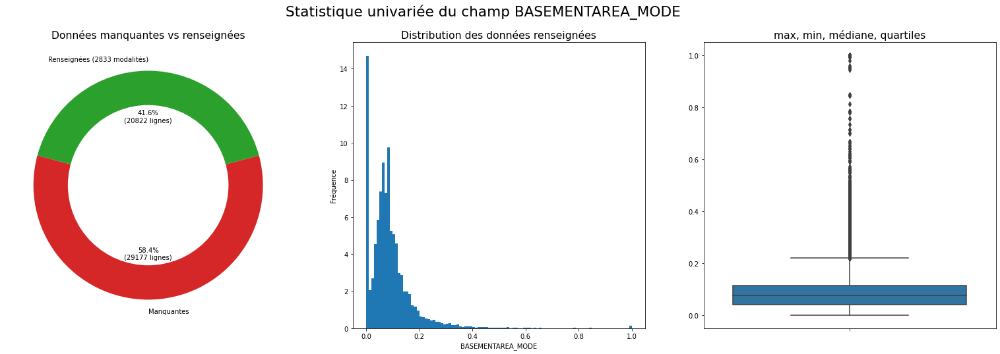

Mesures de position
 - Moyenne: 0.09
 - Médiane: 0.08
Mesures de dispertion
 - Ecart type: 0.09
 - Min: 0.0
 - Q25: 0.04
 - Q75: 0.11
 - Max: 1.0
Mesures de forme
 - Skewness (asymétrie): 3.59
 - Kurtosis (applatissement): 25.36


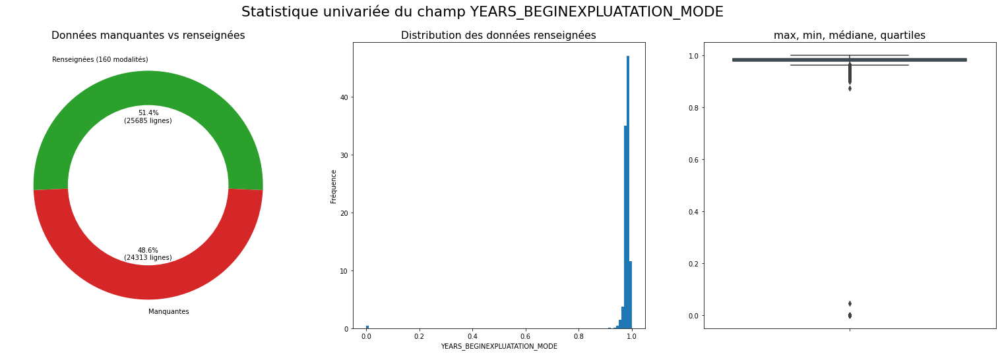

Mesures de position
 - Moyenne: 0.98
 - Médiane: 0.98
Mesures de dispertion
 - Ecart type: 0.06
 - Min: 0.0
 - Q25: 0.98
 - Q75: 0.99
 - Max: 1.0
Mesures de forme
 - Skewness (asymétrie): -15.17
 - Kurtosis (applatissement): 232.66


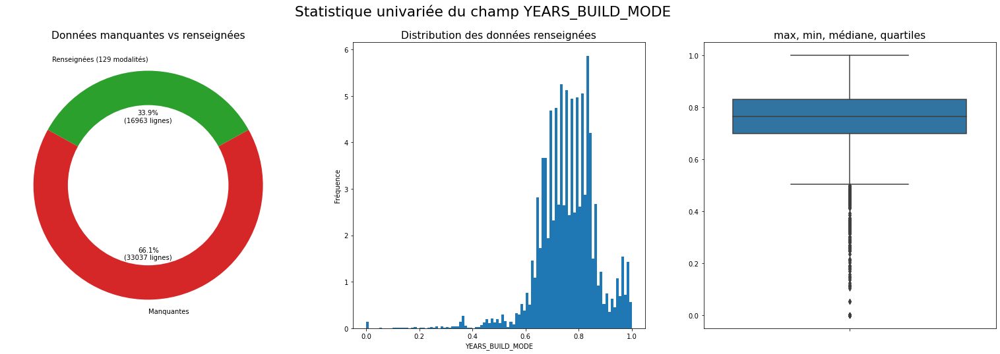

Mesures de position
 - Moyenne: 0.76
 - Médiane: 0.76
Mesures de dispertion
 - Ecart type: 0.11
 - Min: 0.0
 - Q25: 0.7
 - Q75: 0.83
 - Max: 1.0
Mesures de forme
 - Skewness (asymétrie): -1.06
 - Kurtosis (applatissement): 5.24


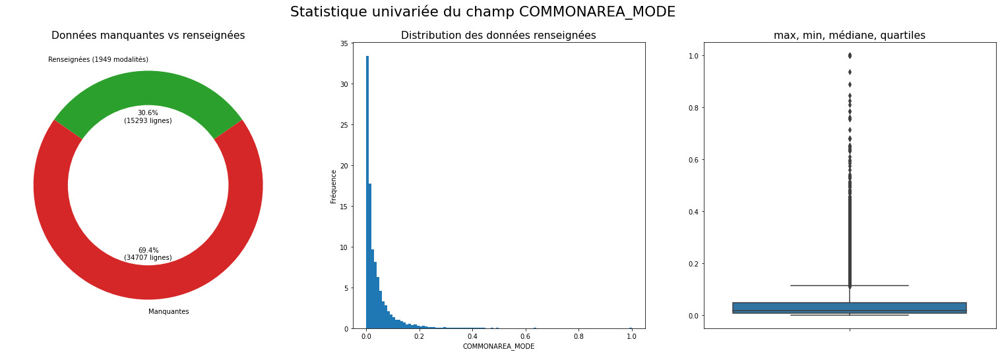

Mesures de position
 - Moyenne: 0.04
 - Médiane: 0.02
Mesures de dispertion
 - Ecart type: 0.07
 - Min: 0.0
 - Q25: 0.01
 - Q75: 0.05
 - Max: 1.0
Mesures de forme
 - Skewness (asymétrie): 5.45
 - Kurtosis (applatissement): 46.99


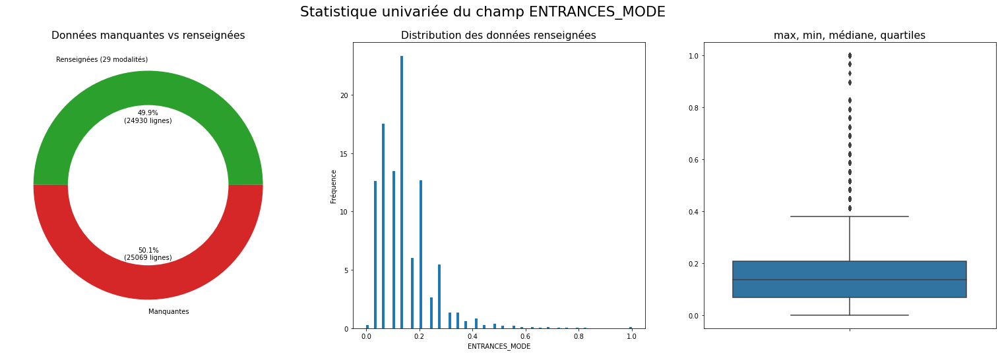

Mesures de position
 - Moyenne: 0.15
 - Médiane: 0.14
Mesures de dispertion
 - Ecart type: 0.1
 - Min: 0.0
 - Q25: 0.07
 - Q75: 0.21
 - Max: 1.0
Mesures de forme
 - Skewness (asymétrie): 2.39
 - Kurtosis (applatissement): 11.39


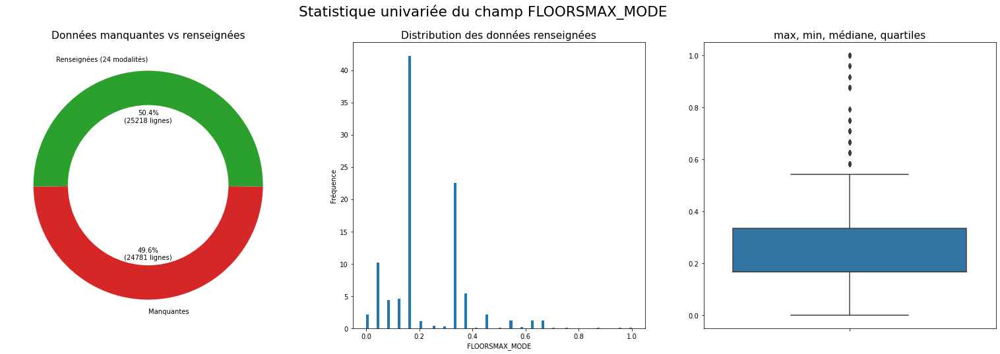

Mesures de position
 - Moyenne: 0.22
 - Médiane: 0.17
Mesures de dispertion
 - Ecart type: 0.14
 - Min: 0.0
 - Q25: 0.17
 - Q75: 0.33
 - Max: 1.0
Mesures de forme
 - Skewness (asymétrie): 1.21
 - Kurtosis (applatissement): 2.41


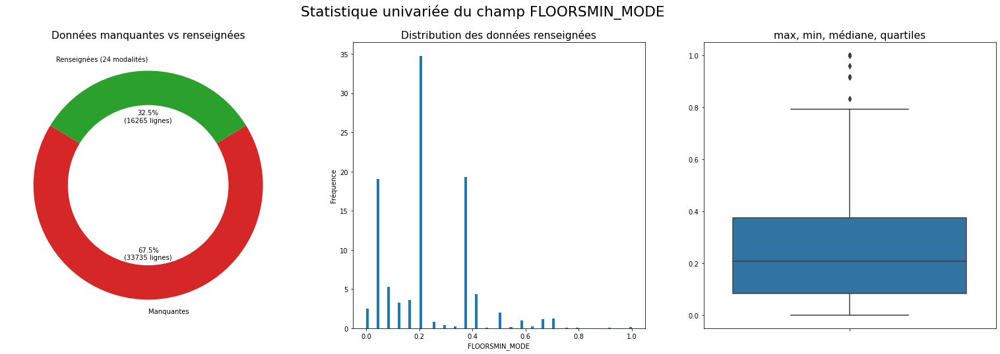

Mesures de position
 - Moyenne: 0.23
 - Médiane: 0.21
Mesures de dispertion
 - Ecart type: 0.16
 - Min: 0.0
 - Q25: 0.08
 - Q75: 0.38
 - Max: 1.0
Mesures de forme
 - Skewness (asymétrie): 0.93
 - Kurtosis (applatissement): 1.23


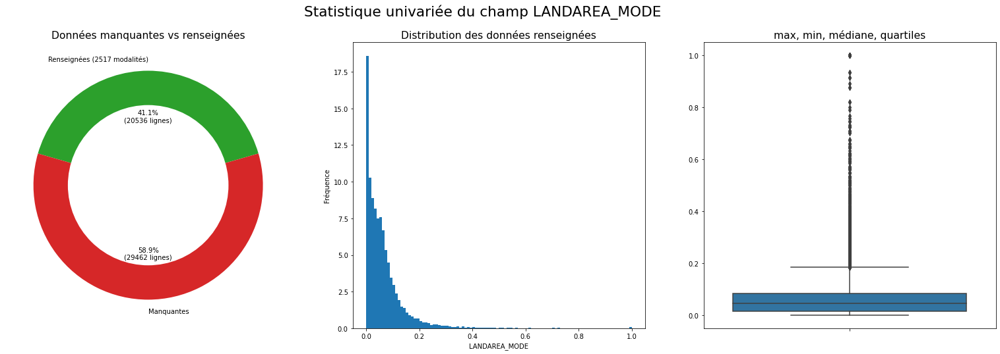

Mesures de position
 - Moyenne: 0.06
 - Médiane: 0.05
Mesures de dispertion
 - Ecart type: 0.08
 - Min: 0.0
 - Q25: 0.02
 - Q75: 0.08
 - Max: 1.0
Mesures de forme
 - Skewness (asymétrie): 4.13
 - Kurtosis (applatissement): 30.62


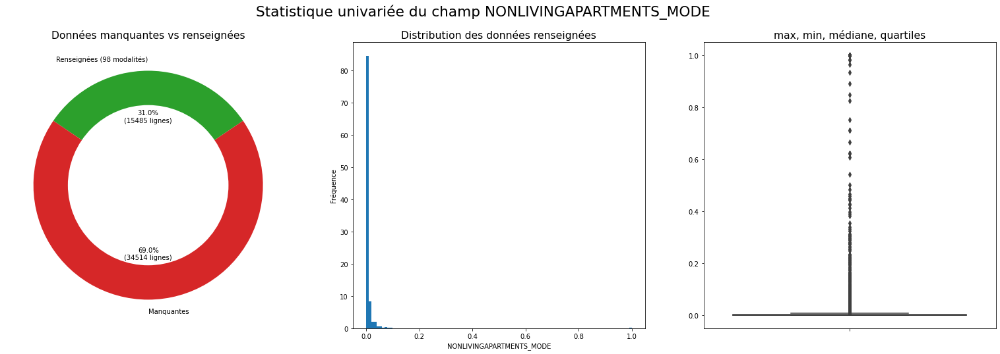

Mesures de position
 - Moyenne: 0.01
 - Médiane: 0.0
Mesures de dispertion
 - Ecart type: 0.05
 - Min: 0.0
 - Q25: 0.0
 - Q75: 0.0
 - Max: 1.0
Mesures de forme
 - Skewness (asymétrie): 15.3
 - Kurtosis (applatissement): 266.12


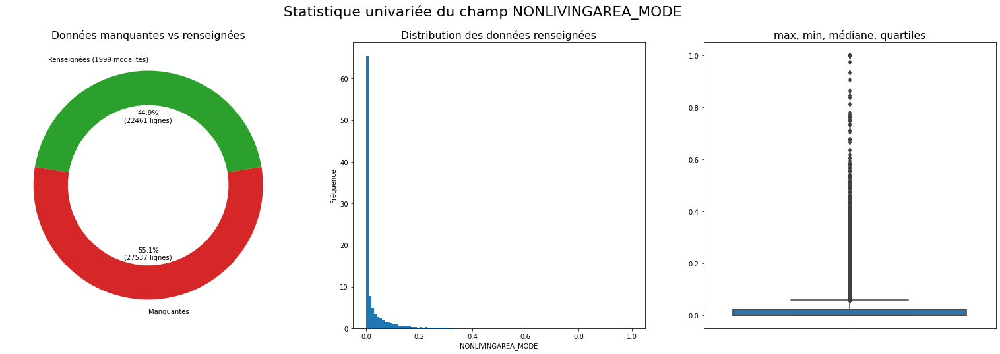

Mesures de position
 - Moyenne: 0.03
 - Médiane: 0.0
Mesures de dispertion
 - Ecart type: 0.07
 - Min: 0.0
 - Q25: 0.0
 - Q75: 0.02
 - Max: 1.0
Mesures de forme
 - Skewness (asymétrie): 6.51
 - Kurtosis (applatissement): 64.27


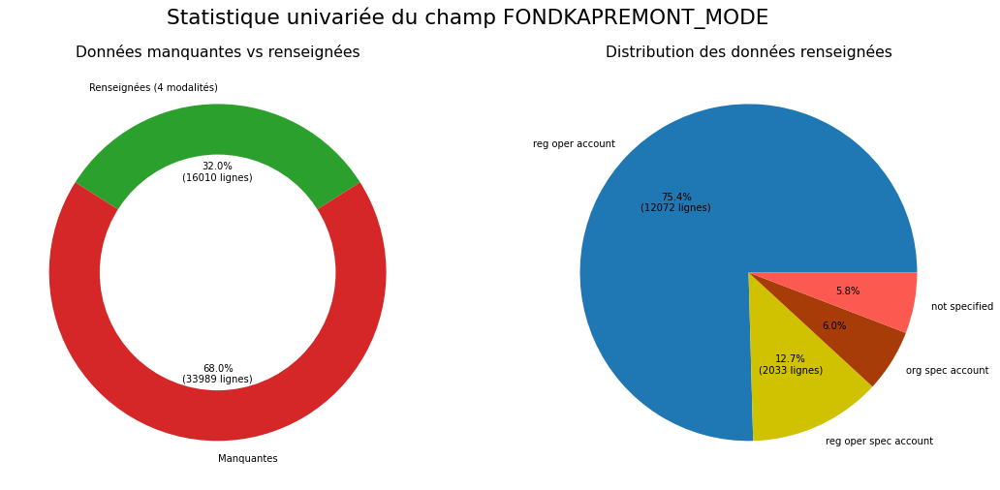

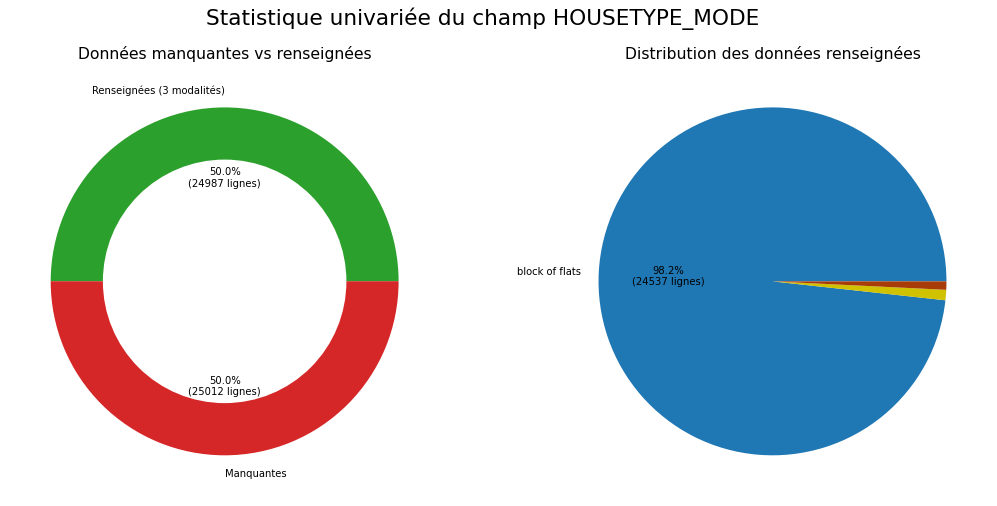

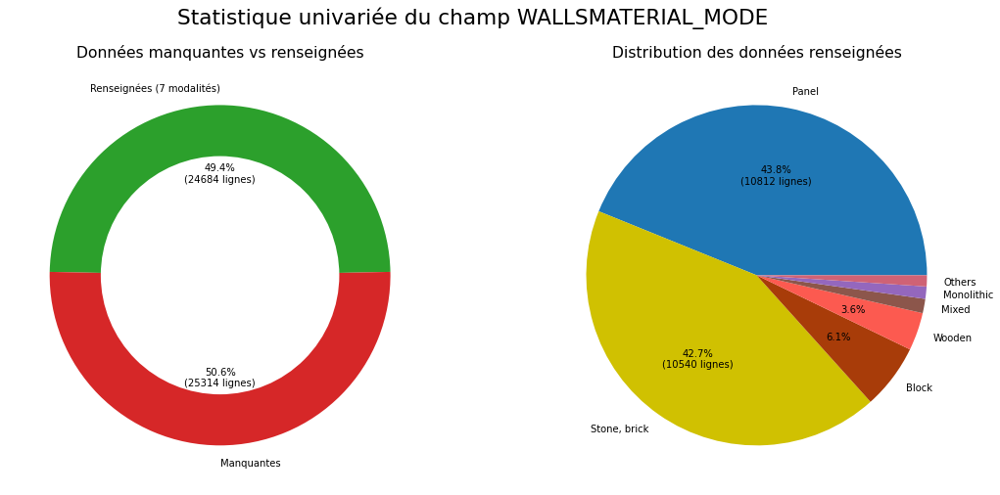

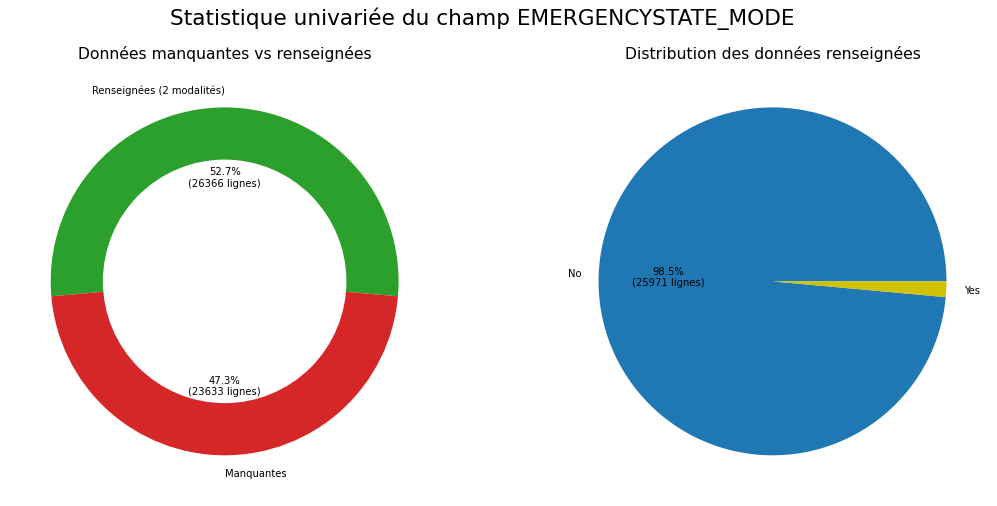

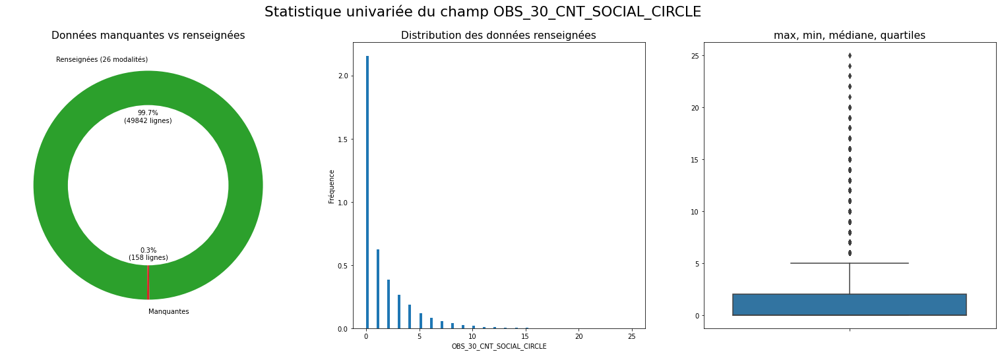

Mesures de position
 - Moyenne: 1.42
 - Médiane: 0.0
Mesures de dispertion
 - Ecart type: 2.31
 - Min: 0.0
 - Q25: 0.0
 - Q75: 2.0
 - Max: 25.0
Mesures de forme
 - Skewness (asymétrie): 2.49
 - Kurtosis (applatissement): 8.43


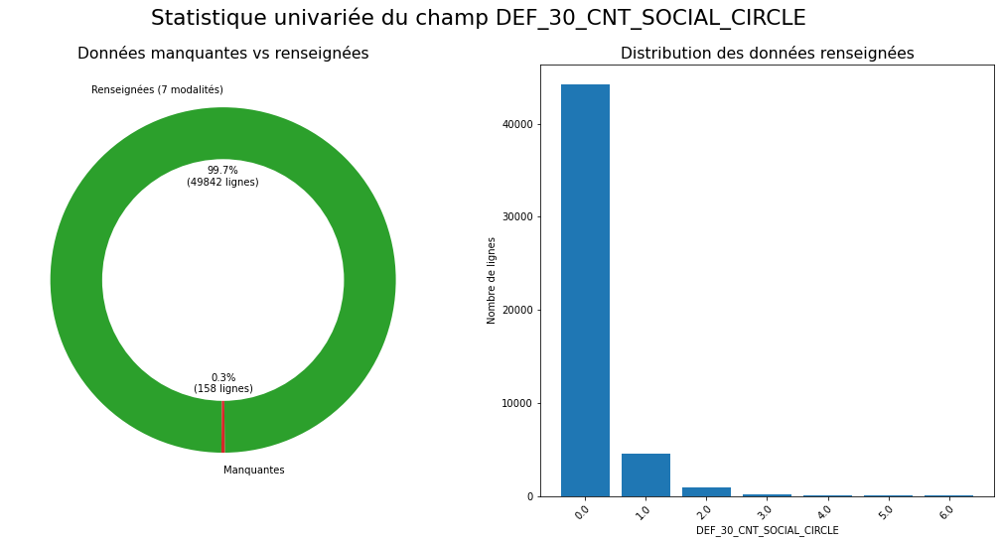

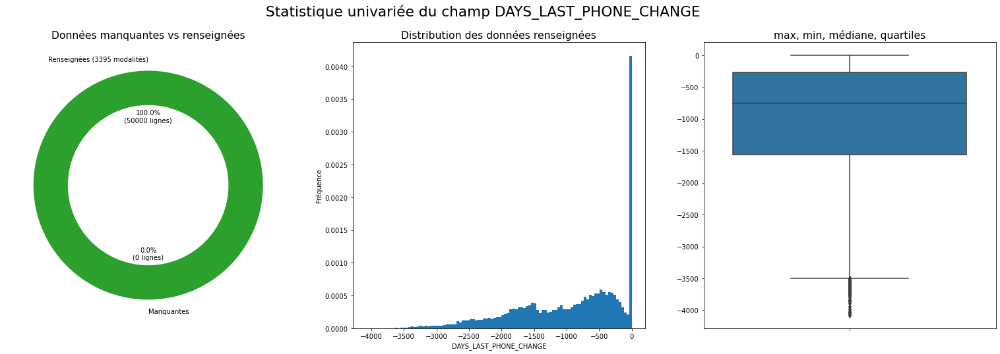

Mesures de position
 - Moyenne: -961.54
 - Médiane: -757.0
Mesures de dispertion
 - Ecart type: 825.24
 - Min: -4079.0
 - Q25: -1564.0
 - Q75: -274.0
 - Max: 0.0
Mesures de forme
 - Skewness (asymétrie): -0.71
 - Kurtosis (applatissement): -0.3


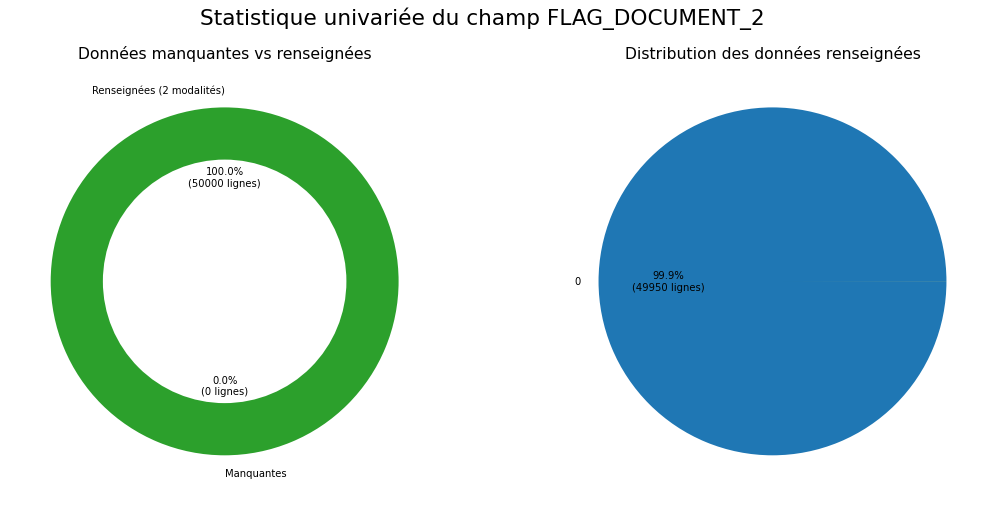

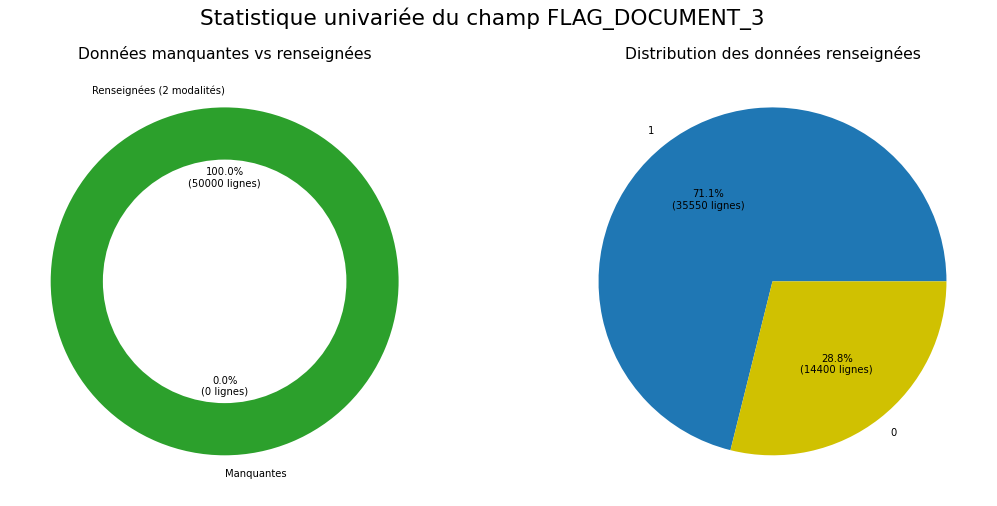

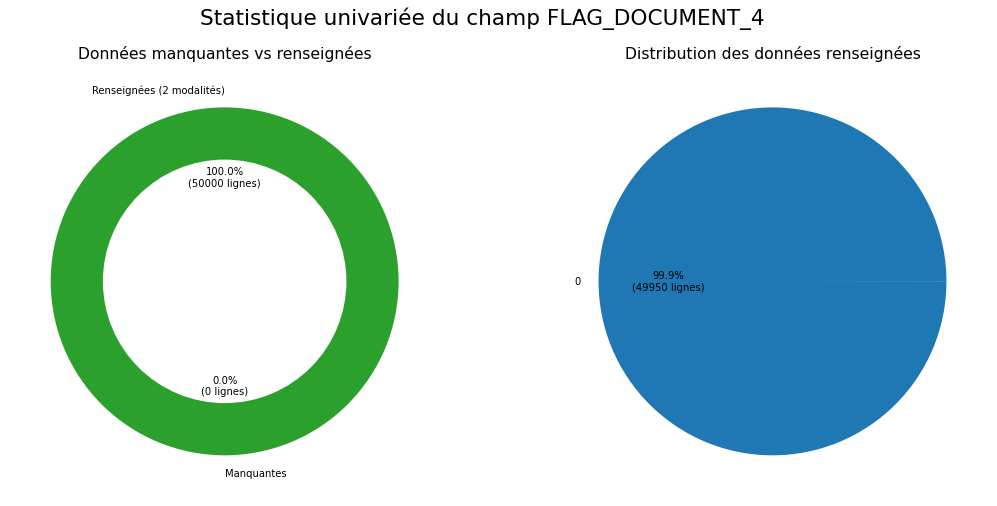

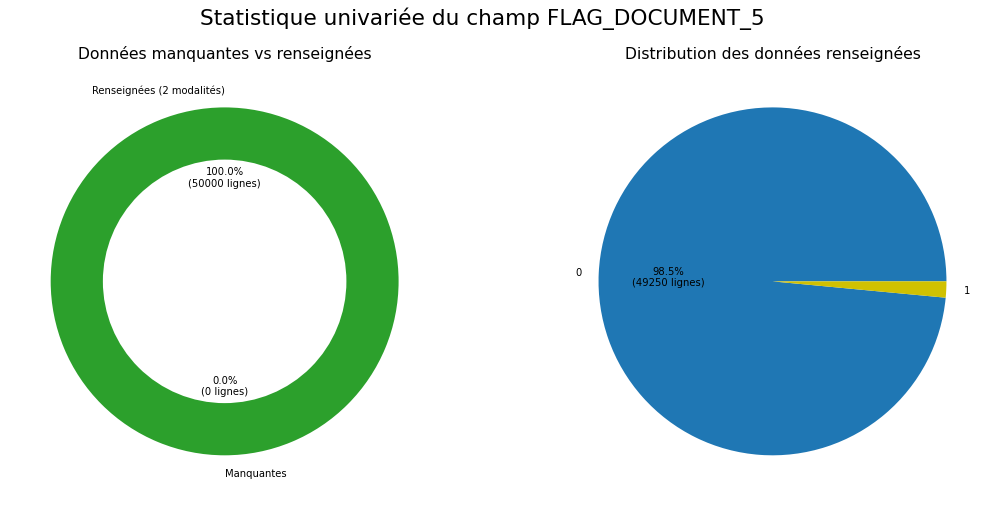

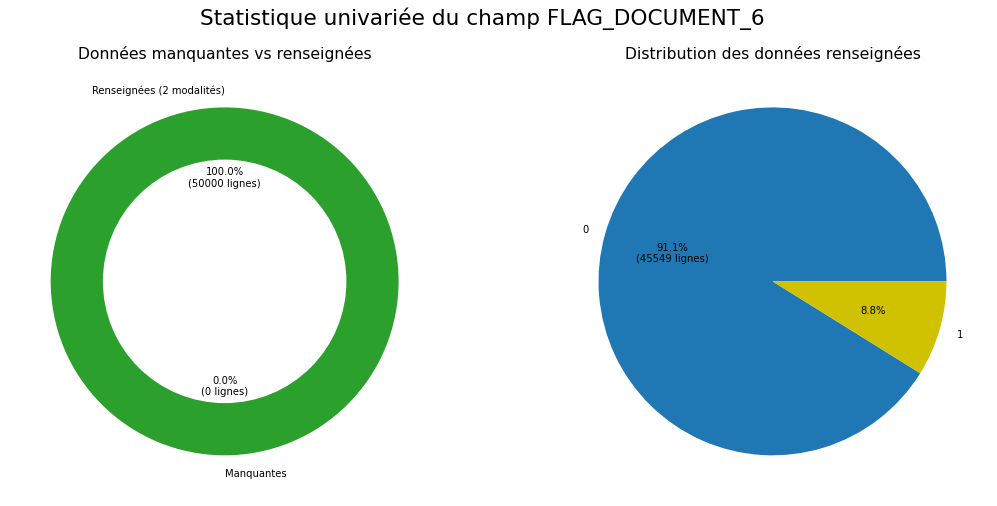

...

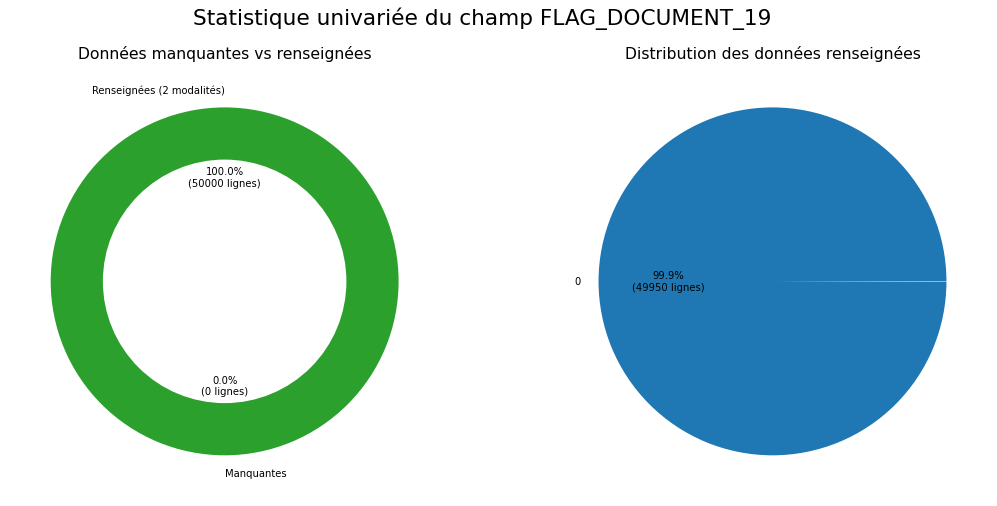

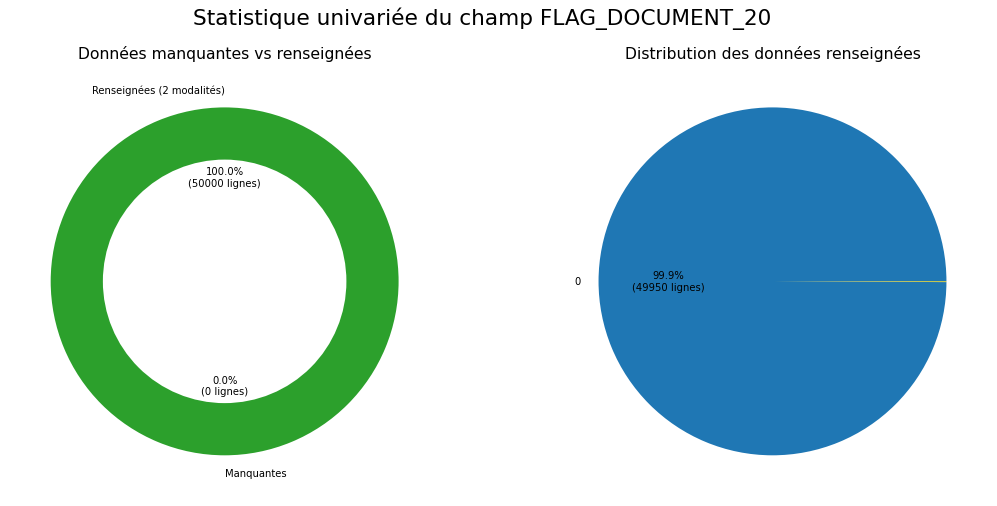

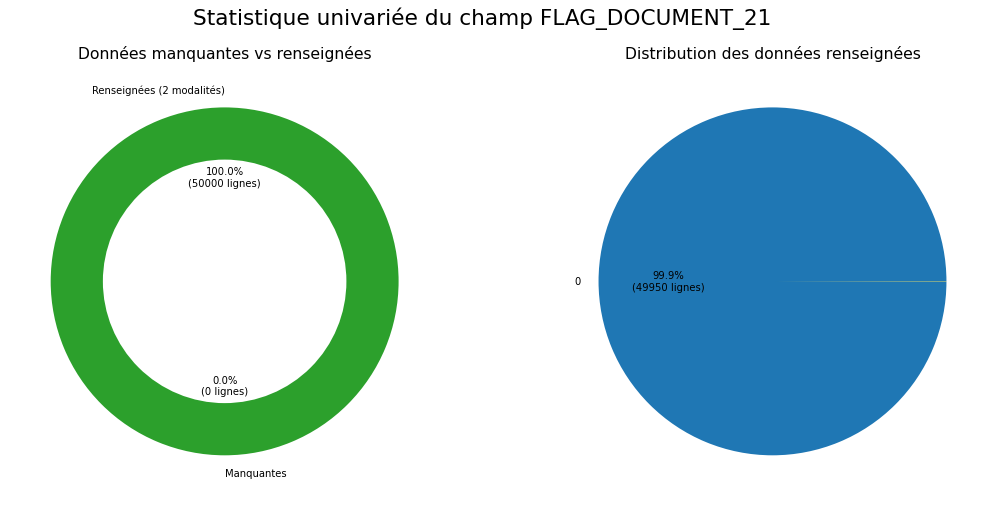

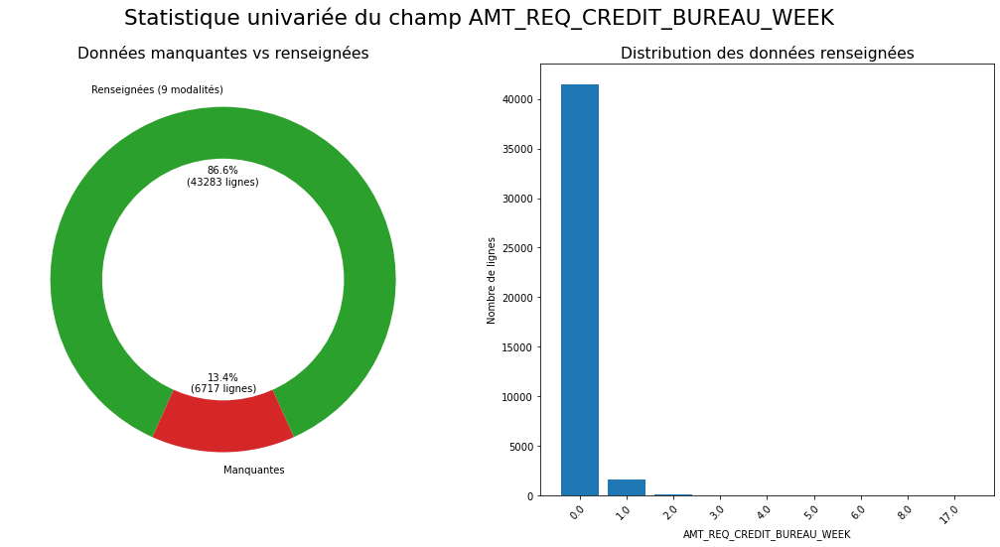

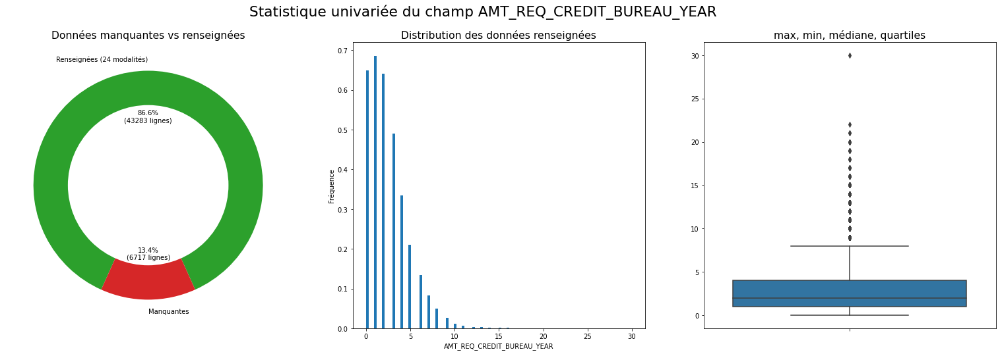

Mesures de position
 - Moyenne: 2.46
 - Médiane: 2.0
Mesures de dispertion
 - Ecart type: 2.23
 - Min: 0.0
 - Q25: 1.0
 - Q75: 4.0
 - Max: 30.0
Mesures de forme
 - Skewness (asymétrie): 1.42
 - Kurtosis (applatissement): 3.86


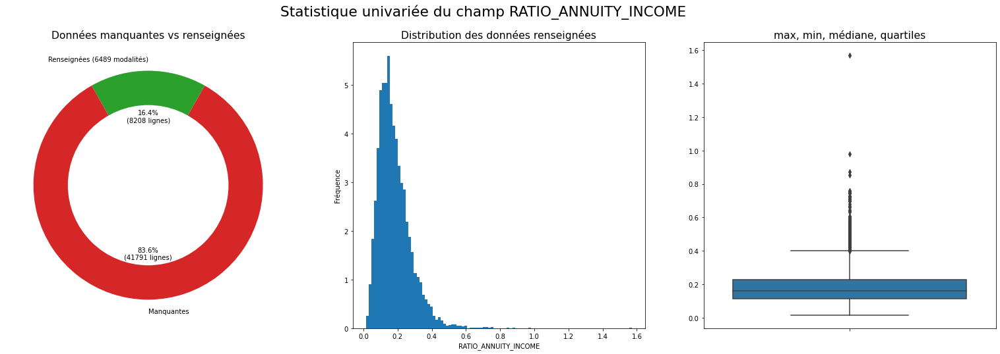

Mesures de position
 - Moyenne: 0.18
 - Médiane: 0.16
Mesures de dispertion
 - Ecart type: 0.1
 - Min: 0.02
 - Q25: 0.11
 - Q75: 0.23
 - Max: 1.57
Mesures de forme
 - Skewness (asymétrie): 1.77
 - Kurtosis (applatissement): 9.42


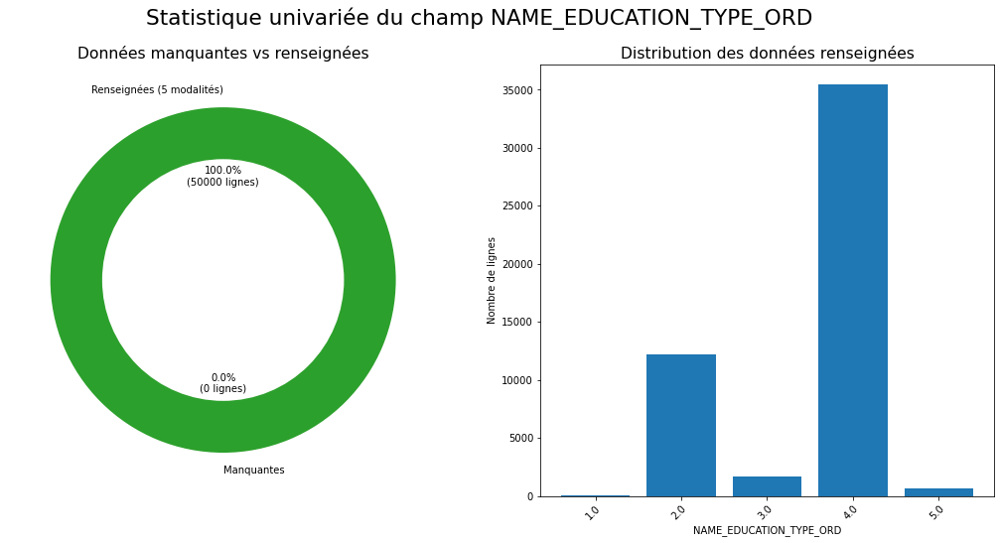

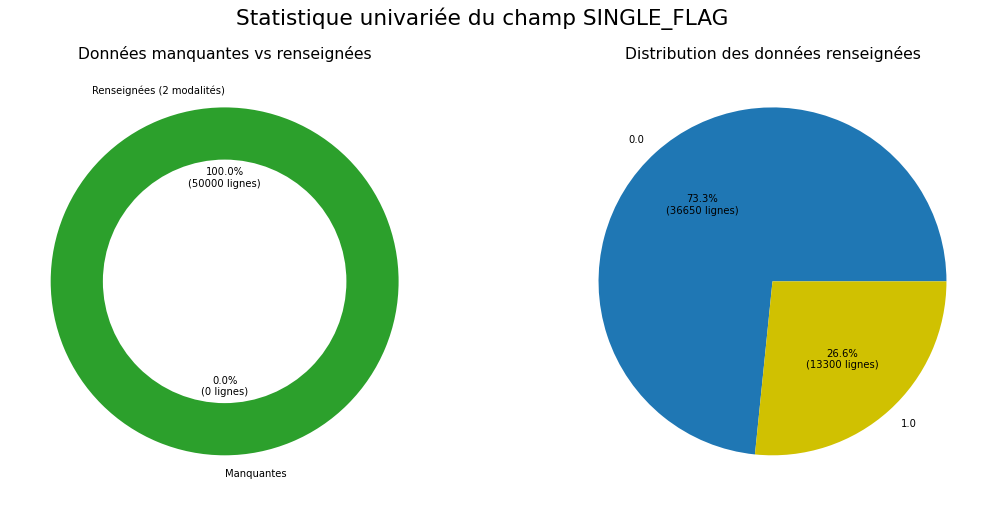

In [57]:
myDf(dfApplication).Stat(typeStat='univ', exclCol=['SK_ID_CURR','TARGET'], statsNan=True)

### Suppression de variables avec trop de valeurs identiques

In [58]:
del dfApplication['HOUSETYPE_MODE']
del dfApplication['EMERGENCYSTATE_MODE']
for col in dfApplication.columns:
    if (col[0:13] == 'FLAG_DOCUMENT') & (col[-1:] not in ['3','6','8']):
        del dfApplication[col]

# Exploration de dfBureau

## Statistiques sur les previous par current application

In [59]:
nbWithPrevious = dfApplication[dfApplication.SK_ID_CURR.isin(dfBureau.SK_ID_CURR)].shape[0]
nbWithoutPrevious = dfApplication[~dfApplication.SK_ID_CURR.isin(dfBureau.SK_ID_CURR)].shape[0]
print("{} loans sans bureau ({}%)".format(nbWithoutPrevious, np.round(100 * nbWithoutPrevious / (nbWithPrevious + nbWithoutPrevious), 1)))

7118 loans sans bureau (14.2%)


Text(0.5, 1.0, 'Stat nb previous application in other financial institution')

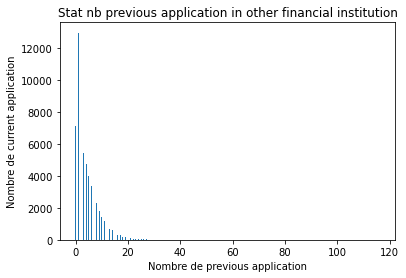

In [60]:
distrib_nb_previous = dfApplication.merge(dfBureau[['SK_ID_CURR']], left_on='SK_ID_CURR', right_on='SK_ID_CURR', how='left')['SK_ID_CURR'].value_counts().value_counts()
distrib_nb_previous[0] = nbWithoutPrevious
tmp = pd.DataFrame({'nb_previous': pd.Series(distrib_nb_previous.index),
                   'nb_application': distrib_nb_previous.reset_index(drop=True)}).sort_values('nb_previous')
plt.bar(pd.Series(distrib_nb_previous.index), distrib_nb_previous.reset_index(drop=True), width=0.3)
plt.xlabel('Nombre de previous application')
plt.ylabel('Nombre de current application')
plt.title("Stat nb previous application in other financial institution")

## Suppression de champs avec trop de valeurs identiques

#### Devise

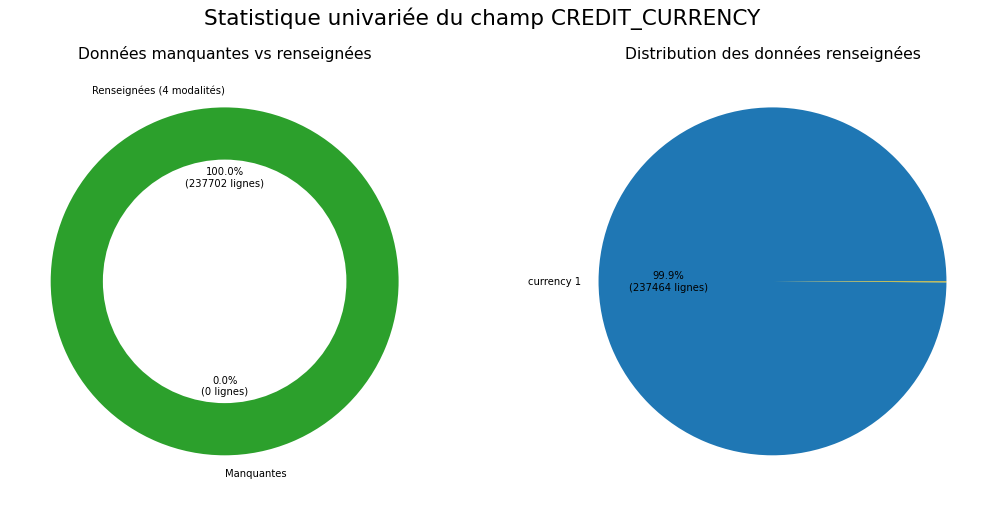

In [61]:
myDf(dfBureau).Stat('CREDIT_CURRENCY', statsNan=True)

On supprime le champ devise tout en conservant les montants

In [62]:
del dfBureau['CREDIT_CURRENCY']

#### Autres champs

In [63]:
nb_zero = dfBureau[dfBureau.CNT_CREDIT_PROLONG==0].shape[0]
nb_not_null = dfBureau[~dfBureau.CNT_CREDIT_PROLONG.isnull()].shape[0]
print("CNT_CREDIT_PROLONG: {} sur {} à zéro ({}%)".format(nb_zero, nb_not_null,np.round(nb_zero/nb_not_null*100),1))

CNT_CREDIT_PROLONG: 236292 sur 237702 à zéro (99.0%)


In [64]:
nb_zero = dfBureau[dfBureau.CREDIT_DAY_OVERDUE==0].shape[0]
nb_not_null = dfBureau[~dfBureau.CREDIT_DAY_OVERDUE.isnull()].shape[0]
print("CREDIT_DAY_OVERDUE: {} sur {} à zéro ({}%)".format(nb_zero, nb_not_null,np.round(nb_zero/nb_not_null*100),1))

CREDIT_DAY_OVERDUE: 237086 sur 237702 à zéro (100.0%)


In [65]:
nb_zero = dfBureau[dfBureau.AMT_CREDIT_SUM_OVERDUE==0].shape[0]
nb_not_null = dfBureau[~dfBureau.AMT_CREDIT_SUM_OVERDUE.isnull()].shape[0]
print("AMT_CREDIT_SUM_OVERDUE: {} sur {} à zéro ({}%)".format(nb_zero, nb_not_null,np.round(nb_zero/nb_not_null*100),1))

AMT_CREDIT_SUM_OVERDUE: 237098 sur 237702 à zéro (100.0%)


In [66]:
nb_zero = dfBureau[dfBureau['AMT_CREDIT_SUM_LIMIT']==0].shape[0]
nb_total = dfBureau[~dfBureau['AMT_CREDIT_SUM_LIMIT'].isnull()].shape[0]
print("{} AMT_CREDIT_SUM_LIMIT à zéro sur {} renseignés ({}%)".format(nb_zero,nb_total,np.round(100*nb_zero/nb_total,1)))

147675 AMT_CREDIT_SUM_LIMIT à zéro sur 158162 renseignés (93.4%)


In [67]:
nb_zero = dfBureau[dfBureau['AMT_CREDIT_MAX_OVERDUE']==0].shape[0]
nb_total = dfBureau[~dfBureau['AMT_CREDIT_MAX_OVERDUE'].isnull()].shape[0]
print("{} AMT_CREDIT_MAX_OVERDUE à zéro sur {} renseignés ({}%)".format(nb_zero,nb_total,np.round(100*nb_zero/nb_total,1)))

66442 AMT_CREDIT_MAX_OVERDUE à zéro sur 83709 renseignés (79.4%)


In [68]:
del dfBureau['CNT_CREDIT_PROLONG']
del dfBureau['CREDIT_DAY_OVERDUE']
del dfBureau['AMT_CREDIT_SUM_OVERDUE']

## Recherche de corrélations

### Corrélation entre AMT_CREDIT_SUM et AMT_ANNUITY

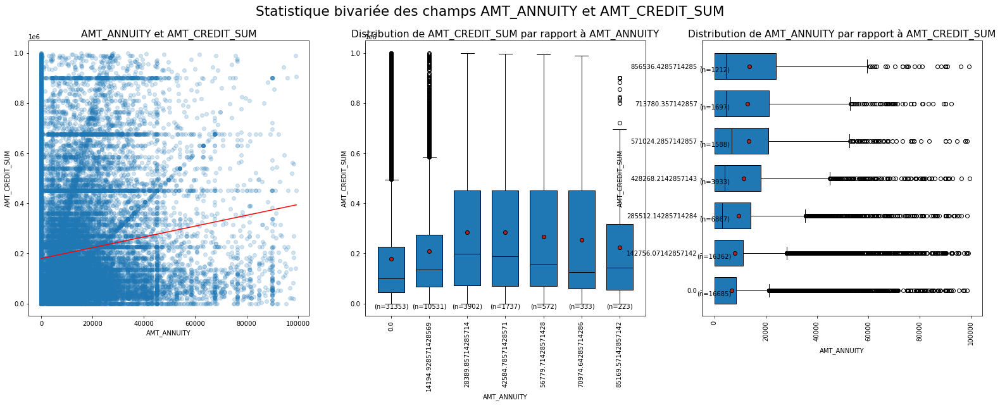

Covariance entre AMT_ANNUITY et AMT_CREDIT_SUM : 437336769.1081772 
Covariance débiaisée entre AMT_ANNUITY et AMT_CREDIT_SUM : 437345751.35815376 
Coefficient de correlation linéaire entre AMT_ANNUITY et AMT_CREDIT_SUM : 0.14352859820869077 
Régression linéaire entre AMT_ANNUITY et AMT_CREDIT_SUM: y = 2.1548841851759075x + 179644.53070172505
Coefficient de détermination entre AMT_ANNUITY et AMT_CREDIT_SUM : 0.02060045850375179 


In [69]:
myDf(dfBureau[(dfBureau.AMT_ANNUITY < 100000) & (dfBureau.AMT_CREDIT_SUM < 1000000)][['AMT_ANNUITY','AMT_CREDIT_SUM']]).Stat(typeStat='biv')

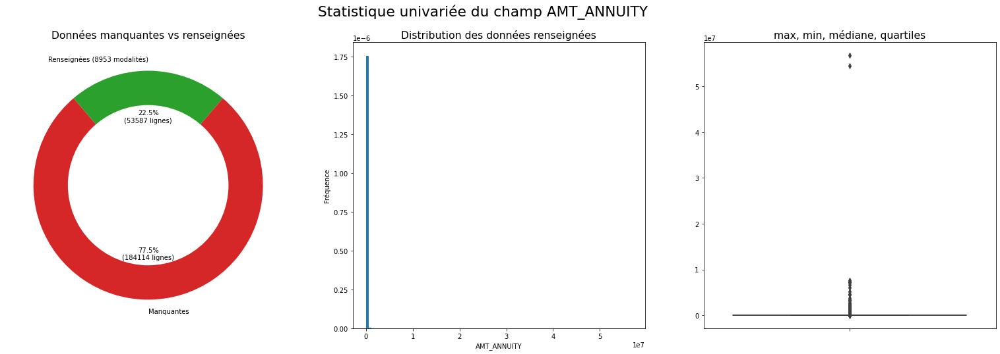

Mesures de position
 - Moyenne: 16959.85
 - Médiane: 0.0
Mesures de dispertion
 - Ecart type: 358880.87
 - Min: 0.0
 - Q25: 0.0
 - Q75: 13513.5
 - Max: 56844981.0
Mesures de forme
 - Skewness (asymétrie): 141.06
 - Kurtosis (applatissement): 21713.14


In [70]:
myDf(dfBureau).Stat('AMT_ANNUITY', statsNan=True)

AMT annuity est trop souvent manquant et ne pourra pas se déduire de AMT_CREDIT_SUM

In [71]:
del dfBureau['AMT_ANNUITY']

### Champs days

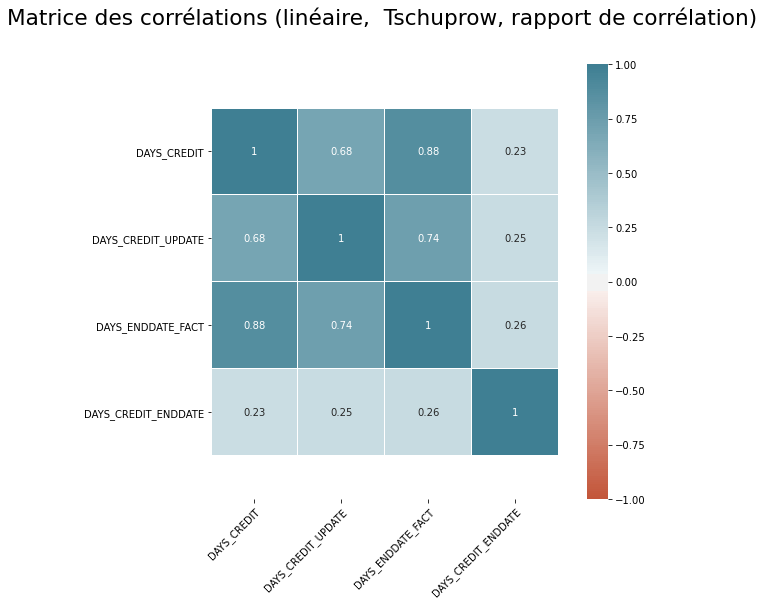

In [72]:
myDf(dfBureau).Stat(['DAYS_CREDIT','DAYS_CREDIT_UPDATE','DAYS_ENDDATE_FACT','DAYS_CREDIT_ENDDATE'], typeStat='biv', bivOnlyCorrTable=True)

In [73]:
print('Nombre de lignes avec le champ vide:')
(dfBureau[['DAYS_CREDIT','DAYS_CREDIT_UPDATE','DAYS_ENDDATE_FACT']].isnull()).sum()

Nombre de lignes avec le champ vide:


DAYS_CREDIT               0
DAYS_CREDIT_UPDATE        0
DAYS_ENDDATE_FACT     88317
dtype: int64

In [74]:
del dfBureau['DAYS_CREDIT_UPDATE']
del dfBureau['DAYS_ENDDATE_FACT']

### Corrélation entre DAYS_CREDIT et DAYS_CREDIT_ENDDATE

#### Surles crédits actifs

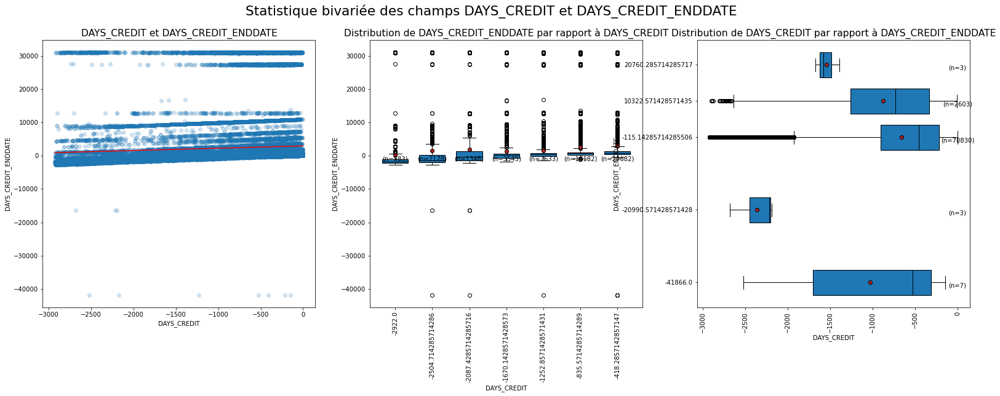

Covariance entre DAYS_CREDIT et DAYS_CREDIT_ENDDATE : 261798.8407915879 
Covariance débiaisée entre DAYS_CREDIT et DAYS_CREDIT_ENDDATE : 261802.20698346413 
Coefficient de correlation linéaire entre DAYS_CREDIT et DAYS_CREDIT_ENDDATE : 0.06113149554115761 
Régression linéaire entre DAYS_CREDIT et DAYS_CREDIT_ENDDATE: y = 0.6932221199967885x + 2975.1023956139743
Coefficient de détermination entre DAYS_CREDIT et DAYS_CREDIT_ENDDATE : 0.003737059747098573 


In [75]:
myDf(dfBureau[dfBureau['CREDIT_ACTIVE'] == 'Active'][['DAYS_CREDIT','DAYS_CREDIT_ENDDATE']]).Stat(typeStat='biv')

#### Sur les crédits clôturés

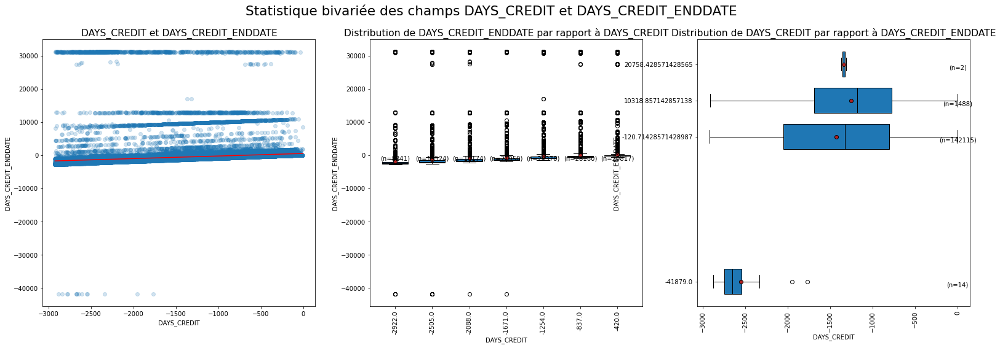

Covariance entre DAYS_CREDIT et DAYS_CREDIT_ENDDATE : 447481.7793397754 
Covariance débiaisée entre DAYS_CREDIT et DAYS_CREDIT_ENDDATE : 447484.8756280868 
Coefficient de correlation linéaire entre DAYS_CREDIT et DAYS_CREDIT_ENDDATE : 0.20054601224777918 
Régression linéaire entre DAYS_CREDIT et DAYS_CREDIT_ENDDATE: y = 0.7669127349432154x + 509.95217295310766
Coefficient de détermination entre DAYS_CREDIT et DAYS_CREDIT_ENDDATE : 0.040218703028486395 


In [76]:
myDf(dfBureau[dfBureau['CREDIT_ACTIVE'] == 'Closed'][['DAYS_CREDIT','DAYS_CREDIT_ENDDATE']]).Stat(typeStat='biv')

#### Suppression des deux champs

DAY_CREDIT_ENDDATE est sensé donner le nombre de jours restant sur le crédit et devrait donc être à zéro sur les crédits cloturés et toujours positif ou négatif sur les crédits actifs, ce qui n'est pas le cas. 

On supprime ce champ inutilisables.

In [77]:
del dfBureau['DAYS_CREDIT_ENDDATE']

## Transformations de variables

On considère que les status Sold et Bad debt correspondent à de crédits actifs 

(comme dans https://www.kaggle.com/shanth84/home-credit-bureau-data-feature-engineering)

In [80]:
dfBureau['CREDIT_ACTIVE'] = dfBureau.apply(lambda x: np.where(x.CREDIT_ACTIVE == 'Closed', 'Closed', 'Active'), axis=1)

## Remontée dans dfApplication de champs montant

In [81]:
tmp = dfBureau[dfBureau.CREDIT_ACTIVE == 'Active'][['SK_ID_CURR','AMT_CREDIT_SUM']].groupby('SK_ID_CURR').agg({'AMT_CREDIT_SUM':'sum'}).reset_index(drop=False).rename(columns={'AMT_CREDIT_SUM':'BURO_AMT_CREDIT_ACTIVE'})
dfApplication = dfApplication.merge(tmp, left_on='SK_ID_CURR', right_on='SK_ID_CURR', how='left')
dfApplication['BURO_AMT_CREDIT_ACTIVE'] = dfApplication['BURO_AMT_CREDIT_ACTIVE'].fillna(0).astype(float)

In [82]:
tmp = dfBureau[dfBureau.CREDIT_ACTIVE == 'Closed'][['SK_ID_CURR','AMT_CREDIT_SUM']].groupby('SK_ID_CURR').agg({'AMT_CREDIT_SUM':'sum'}).reset_index(drop=False).rename(columns={'AMT_CREDIT_SUM':'BURO_AMT_CREDIT_COMPLETED'})
dfApplication = dfApplication.merge(tmp, left_on='SK_ID_CURR', right_on='SK_ID_CURR', how='left')
dfApplication['BURO_AMT_CREDIT_COMPLETED'] = dfApplication['BURO_AMT_CREDIT_COMPLETED'].fillna(0).astype(float)

## Matrice des corrélations des champs restants

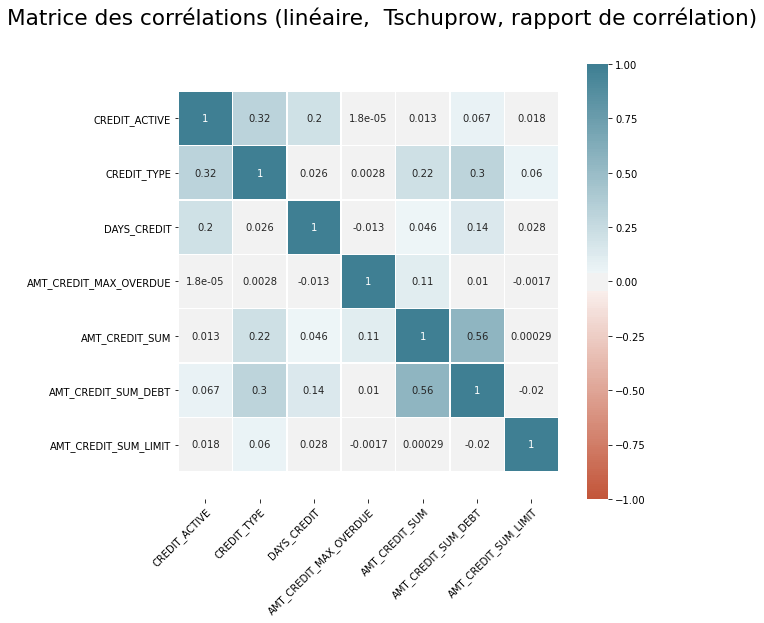

In [83]:
myDf(dfBureau).Stat(exclCol=['SK_ID_CURR','SK_ID_BUREAU'], typeStat='biv', bivOnlyCorrTable=True)

# Exploration de PreviousApplication

   ## Correspondance entre PreviousApplication et les tables de niveau 3

In [84]:
PreviousID = dfPreviousApplication[['SK_ID_PREV','SK_ID_CURR']].drop_duplicates()
PosCashBalID = dfPosCashBalance[['SK_ID_PREV','SK_ID_CURR']].drop_duplicates()
CreditCardBalID = dfCreditCardBalance[['SK_ID_PREV','SK_ID_CURR']].drop_duplicates()
InstalPaymtID = dfInstallmentsPayments[['SK_ID_PREV','SK_ID_CURR']].drop_duplicates()
CreditCardOrPosCashBalID = pd.concat([PosCashBalID,CreditCardBalID])

In [85]:
nbPart = PreviousID.merge(CreditCardBalID).shape[0]
nbAll = PreviousID.shape[0]
printRatio(nbPart, nbAll, text1="previous avec une ligne dans credit card sur")

nbPart = PreviousID.merge(PosCashBalID).shape[0]
nbAll = PreviousID.shape[0]
printRatio(nbPart, nbAll, text1="previous avec une ligne dans pos cash sur")

nbPart = PreviousID.merge(InstalPaymtID).shape[0]
nbAll = PreviousID.shape[0]
printRatio(nbPart, nbAll, text1="previous avec une ligne dans installment payments sur")


nbPart = PosCashBalID.merge(CreditCardBalID).shape[0]
nbAll = PosCashBalID.shape[0]
printRatio(nbPart, nbAll, text1="pos cash avec une ligne dans credit card sur")

nbPart = PosCashBalID.merge(InstalPaymtID).shape[0]
nbAll = PosCashBalID.shape[0]
printRatio(nbPart, nbAll, text1="pos cash avec une ligne dans InstalPaymt sur")

nbPart = CreditCardBalID.merge(InstalPaymtID).shape[0]
nbAll = CreditCardBalID.shape[0]
printRatio(nbPart, nbAll, text1="credit card avec une ligne dans InstalPaymt sur")

nbPart = InstalPaymtID.merge(CreditCardOrPosCashBalID).shape[0]
nbAll = InstalPaymtID.shape[0]
printRatio(nbPart, nbAll, text1="instalPaymnt avec une ligne dans pos cash ou dans credit card sur")

12627 previous avec une ligne dans credit card sur 229096  (5.512%)
124620 previous avec une ligne dans pos cash sur 229096  (54.396%)
132849 previous avec une ligne dans installment payments sur 229096  (57.988%)
0 pos cash avec une ligne dans credit card sur 124620  (0.0%)
124231 pos cash avec une ligne dans InstalPaymt sur 124620  (99.688%)
8567 credit card avec une ligne dans InstalPaymt sur 12627  (67.847%)
132798 instalPaymnt avec une ligne dans pos cash ou dans credit card sur 132849  (99.962%)


### PosCash sans installment payment

In [86]:
PosSansInstalPaymt = myDf(dfPosCashBalance).WhereNotExists(InstalPaymtID, left_on=['SK_ID_PREV','SK_ID_CURR'], right_on=['SK_ID_PREV','SK_ID_CURR'])
dfPreviousApplication.merge(PosSansInstalPaymt[['SK_ID_PREV','SK_ID_CURR']].drop_duplicates())

,SK_ID_PREV,SK_ID_CURR,NAME_CONTRACT_TYPE,AMT_ANNUITY,AMT_APPLICATION,AMT_CREDIT,AMT_DOWN_PAYMENT,AMT_GOODS_PRICE,WEEKDAY_APPR_PROCESS_START,HOUR_APPR_PROCESS_START,FLAG_LAST_APPL_PER_CONTRACT,NFLAG_LAST_APPL_IN_DAY,RATE_DOWN_PAYMENT,RATE_INTEREST_PRIMARY,RATE_INTEREST_PRIVILEGED,NAME_CASH_LOAN_PURPOSE,NAME_CONTRACT_STATUS,DAYS_DECISION,NAME_PAYMENT_TYPE,CODE_REJECT_REASON,NAME_TYPE_SUITE,NAME_CLIENT_TYPE,NAME_GOODS_CATEGORY,NAME_PORTFOLIO,NAME_PRODUCT_TYPE,CHANNEL_TYPE,SELLERPLACE_AREA,NAME_SELLER_INDUSTRY,CNT_PAYMENT,NAME_YIELD_GROUP,PRODUCT_COMBINATION,DAYS_FIRST_DRAWING,DAYS_FIRST_DUE,DAYS_LAST_DUE_1ST_VERSION,DAYS_LAST_DUE,DAYS_TERMINATION,NFLAG_INSURED_ON_APPROVAL
0,1466164,278656,Consumer loans,4153.545,42705.000,45855.000,0.000,42705.000,TUESDAY,14,Y,1,0.000000,NaN,NaN,NaN,Approved,-29,Cash through the bank,NaN,Family,Repeater,Computers,POS,NaN,Country-wide,261,Consumer electronics,12.0,low_action,POS household without interest,365243.0,365243.0,332.0,365243.0,365243.0,0.0
1,1214443,436625,Consumer loans,2003.265,41583.375,41580.000,3.375,41583.375,WEDNESDAY,7,Y,1,0.000088,NaN,NaN,NaN,Approved,-57,Non-cash from your account,NaN,Unaccompanied,Refreshed,Audio/Video,POS,NaN,Regional / Local,280,Consumer electronics,24.0,low_action,POS household without interest,365243.0,365243.0,663.0,365243.0,365243.0,0.0
2,2262310,341102,Consumer loans,2099.565,17685.000,19786.500,0.000,17685.000,TUESDAY,17,Y,1,0.000000,NaN,NaN,NaN,Approved,-132,Cash through the bank,NaN,NaN,Repeater,Mobile,POS,NaN,Country-wide,17,Connectivity,12.0,middle,POS mobile with interest,365243.0,365243.0,336.0,365243.0,365243.0,0.0
3,2094580,286093,Consumer loans,9975.285,72715.500,70627.500,7272.000,72715.500,THURSDAY,9,Y,1,0.101668,NaN,NaN,NaN,Approved,-6,Cash through the bank,NaN,Unaccompanied,Repeater,Consumer Electronics,POS,NaN,Stone,100,Consumer electronics,8.0,low_normal,POS household with interest,365243.0,365243.0,234.0,365243.0,365243.0,1.0
4,2768478,281893,Consumer loans,5286.510,48591.000,48591.000,0.000,48591.000,SUNDAY,16,Y,1,0.000000,NaN,NaN,NaN,Approved,-33,Cash through the bank,NaN,Family,Repeater,Computers,POS,NaN,Country-wide,1600,Consumer electronics,12.0,middle,POS household with interest,365243.0,365243.0,327.0,365243.0,365243.0,0.0
5,2046132,409765,Consumer loans,4224.510,50701.500,40563.000,10138.500,50701.500,THURSDAY,11,Y,1,0.217780,NaN,NaN,NaN,Approved,-32,Cash through the bank,NaN,Unaccompanied,Refreshed,Mobile,POS,NaN,Country-wide,32,Connectivity,12.0,middle,POS mobile with interest,365243.0,365243.0,328.0,365243.0,365243.0,0.0
6,1360956,156806,Consumer loans,7005.960,42705.000,37885.500,8541.000,42705.000,THURSDAY,14,Y,1,0.200358,NaN,NaN,NaN,Approved,-26,Cash through the bank,NaN,Family,Repeater,Consumer Electronics,POS,NaN,Country-wide,1700,Consumer electronics,6.0,low_normal,POS mobile with interest,365243.0,365243.0,154.0,365243.0,365243.0,1.0
7,2288406,446350,Consumer loans,16632.270,128733.525,146436.525,0.000,128733.525,SATURDAY,11,Y,1,0.000000,NaN,NaN,NaN,Approved,-20,Cash through the bank,NaN,NaN,Refreshed,Mobile,POS,NaN,Country-wide,40,Connectivity,10.0,low_normal,POS mobile without interest,365243.0,365243.0,289.0,365243.0,365243.0,0.0
8,2600060,429828,Consumer loans,6357.375,52285.500,52285.500,0.000,52285.500,SATURDAY,18,Y,1,0.000000,NaN,NaN,NaN,Approved,-62,Cash through the bank,NaN,NaN,Repeater,Mobile,POS,NaN,Country-wide,180,Connectivity,12.0,high,POS mobile with interest,365243.0,365243.0,304.0,365243.0,365243.0,0.0
9,2238550,184704,Consumer loans,2921.445,34564.500,27652.500,6912.000,34564.500,TUESDAY,12,Y,1,0.217790,NaN,NaN,NaN,Approved,-50,Cash through the bank,NaN,Family,Repeater,Consumer Electronics,POS,NaN,Regional / Local,145,Consumer electronics,12.0,middle,POS household with interest,365243.0,365243.0,310.0,365243.0,365243.0,0.0


### CreditCard sans installment payment

In [87]:
CreditCardSansInstalPaymt = myDf(dfCreditCardBalance).WhereNotExists(InstalPaymtID, left_on=['SK_ID_PREV','SK_ID_CURR'], right_on=['SK_ID_PREV','SK_ID_CURR'])
dfPreviousApplication.merge(CreditCardSansInstalPaymt[['SK_ID_PREV','SK_ID_CURR']].drop_duplicates())

,SK_ID_PREV,SK_ID_CURR,NAME_CONTRACT_TYPE,AMT_ANNUITY,AMT_APPLICATION,AMT_CREDIT,AMT_DOWN_PAYMENT,AMT_GOODS_PRICE,WEEKDAY_APPR_PROCESS_START,HOUR_APPR_PROCESS_START,FLAG_LAST_APPL_PER_CONTRACT,NFLAG_LAST_APPL_IN_DAY,RATE_DOWN_PAYMENT,RATE_INTEREST_PRIMARY,RATE_INTEREST_PRIVILEGED,NAME_CASH_LOAN_PURPOSE,NAME_CONTRACT_STATUS,DAYS_DECISION,NAME_PAYMENT_TYPE,CODE_REJECT_REASON,NAME_TYPE_SUITE,NAME_CLIENT_TYPE,NAME_GOODS_CATEGORY,NAME_PORTFOLIO,NAME_PRODUCT_TYPE,CHANNEL_TYPE,SELLERPLACE_AREA,NAME_SELLER_INDUSTRY,CNT_PAYMENT,NAME_YIELD_GROUP,PRODUCT_COMBINATION,DAYS_FIRST_DRAWING,DAYS_FIRST_DUE,DAYS_LAST_DUE_1ST_VERSION,DAYS_LAST_DUE,DAYS_TERMINATION,NFLAG_INSURED_ON_APPROVAL
0,1410168,255798,Revolving loans,2250.0,45000.0,45000.0,NaN,45000.0,FRIDAY,13,Y,1,NaN,NaN,NaN,NaN,Approved,-261,NaN,NaN,NaN,Repeater,NaN,Cards,walk-in,Credit and cash offices,-1,NaN,0.0,NaN,Card Street,365243.0,365243.0,365243.0,365243.0,365243.0,0.0
1,1797711,203250,Revolving loans,14625.0,0.0,292500.0,NaN,NaN,THURSDAY,13,Y,1,NaN,NaN,NaN,NaN,Approved,-1230,NaN,NaN,NaN,Repeater,NaN,Cards,x-sell,Credit and cash offices,-1,NaN,0.0,NaN,Card X-Sell,365243.0,365243.0,365243.0,365243.0,365243.0,0.0
2,1535955,187675,Revolving loans,5625.0,112500.0,112500.0,NaN,112500.0,THURSDAY,9,Y,1,NaN,NaN,NaN,NaN,Approved,-84,NaN,NaN,Unaccompanied,Repeater,NaN,Cards,x-sell,Credit and cash offices,-1,NaN,0.0,NaN,Card X-Sell,365243.0,365243.0,365243.0,365243.0,365243.0,0.0
3,1520547,348859,Revolving loans,11250.0,0.0,225000.0,NaN,NaN,FRIDAY,14,Y,1,NaN,NaN,NaN,NaN,Approved,-1270,NaN,NaN,NaN,Repeater,NaN,Cards,x-sell,Credit and cash offices,-1,NaN,0.0,NaN,Card X-Sell,365243.0,365243.0,365243.0,365243.0,365243.0,0.0
4,1744590,192226,Revolving loans,12375.0,0.0,247500.0,NaN,NaN,TUESDAY,16,Y,1,NaN,NaN,NaN,NaN,Approved,-638,NaN,NaN,NaN,Refreshed,NaN,Cards,x-sell,Credit and cash offices,-1,NaN,0.0,NaN,Card X-Sell,365243.0,365243.0,365243.0,365243.0,365243.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
4055,1082592,412442,Revolving loans,9000.0,0.0,180000.0,NaN,NaN,MONDAY,11,Y,1,NaN,NaN,NaN,NaN,Approved,-2728,NaN,NaN,NaN,Repeater,NaN,Cards,x-sell,Contact center,-1,NaN,0.0,NaN,Card Street,365243.0,365243.0,365243.0,365243.0,365243.0,0.0
4056,2653399,395439,Revolving loans,13500.0,270000.0,270000.0,NaN,270000.0,FRIDAY,7,Y,1,NaN,NaN,NaN,NaN,Approved,-400,NaN,NaN,Unaccompanied,Refreshed,NaN,Cards,x-sell,AP+ (Cash loan),4,NaN,0.0,NaN,Card X-Sell,365243.0,365243.0,365243.0,365243.0,-143.0,0.0
4057,2708109,131607,Revolving loans,2250.0,45000.0,45000.0,NaN,45000.0,WEDNESDAY,19,Y,1,NaN,NaN,NaN,NaN,Approved,-302,NaN,NaN,Family,New,NaN,Cards,walk-in,Country-wide,3303,Consumer electronics,0.0,NaN,Card Street,365243.0,365243.0,365243.0,365243.0,365243.0,0.0
4058,2592893,207111,Revolving loans,3375.0,0.0,67500.0,NaN,NaN,THURSDAY,20,Y,1,NaN,NaN,NaN,NaN,Approved,-2707,NaN,NaN,NaN,Repeater,NaN,Cards,x-sell,Contact center,-1,NaN,0.0,NaN,Card Street,365243.0,365243.0,365243.0,365243.0,365243.0,0.0


### Installment payments sans credit card ni pos cash

In [88]:
InstalPaymtSansCreditCardNiPosCash = myDf(InstalPaymtID).WhereNotExists(dfCreditCardBalance, left_on=['SK_ID_PREV','SK_ID_CURR'], right_on=['SK_ID_PREV','SK_ID_CURR'])
InstalPaymtSansCreditCardNiPosCash = myDf(InstalPaymtSansCreditCardNiPosCash).WhereNotExists(dfPosCashBalance, left_on=['SK_ID_PREV','SK_ID_CURR'], right_on=['SK_ID_PREV','SK_ID_CURR'])
dfPreviousApplication.merge(InstalPaymtSansCreditCardNiPosCash[['SK_ID_PREV','SK_ID_CURR']].drop_duplicates())

,SK_ID_PREV,SK_ID_CURR,NAME_CONTRACT_TYPE,AMT_ANNUITY,AMT_APPLICATION,AMT_CREDIT,AMT_DOWN_PAYMENT,AMT_GOODS_PRICE,WEEKDAY_APPR_PROCESS_START,HOUR_APPR_PROCESS_START,FLAG_LAST_APPL_PER_CONTRACT,NFLAG_LAST_APPL_IN_DAY,RATE_DOWN_PAYMENT,RATE_INTEREST_PRIMARY,RATE_INTEREST_PRIVILEGED,NAME_CASH_LOAN_PURPOSE,NAME_CONTRACT_STATUS,DAYS_DECISION,NAME_PAYMENT_TYPE,CODE_REJECT_REASON,NAME_TYPE_SUITE,NAME_CLIENT_TYPE,NAME_GOODS_CATEGORY,NAME_PORTFOLIO,NAME_PRODUCT_TYPE,CHANNEL_TYPE,SELLERPLACE_AREA,NAME_SELLER_INDUSTRY,CNT_PAYMENT,NAME_YIELD_GROUP,PRODUCT_COMBINATION,DAYS_FIRST_DRAWING,DAYS_FIRST_DUE,DAYS_LAST_DUE_1ST_VERSION,DAYS_LAST_DUE,DAYS_TERMINATION,NFLAG_INSURED_ON_APPROVAL
0,2111020,271919,Revolving loans,0.000,0.0,0.0,NaN,NaN,MONDAY,18,Y,1,NaN,NaN,NaN,NaN,Approved,-1633,NaN,NaN,NaN,Repeater,NaN,Cards,x-sell,Stone,331,Consumer electronics,0.0,NaN,Card Street,-1630.0,365243.0,365243.0,365243.0,-1270.0,0.0
1,1723812,203058,Consumer loans,5456.430,89955.0,49405.5,45000.0,89955.0,TUESDAY,16,Y,1,0.519134,NaN,NaN,NaN,Approved,-2065,Cash through the bank,NaN,Family,New,Consumer Electronics,POS,NaN,Country-wide,1885,Consumer electronics,12.0,middle,POS household with interest,365243.0,-2034.0,-1704.0,-1944.0,-1940.0,0.0
2,1548137,170739,Revolving loans,0.000,0.0,0.0,NaN,NaN,SATURDAY,10,Y,1,NaN,NaN,NaN,NaN,Approved,-1546,NaN,NaN,NaN,Repeater,NaN,Cards,x-sell,Country-wide,40,Connectivity,0.0,NaN,Card Street,-1543.0,365243.0,365243.0,365243.0,-1181.0,0.0
3,2290771,230755,Cash loans,4793.175,45000.0,47970.0,0.0,45000.0,THURSDAY,16,Y,1,0.000000,NaN,NaN,NaN,Approved,-1537,Cash through the bank,NaN,Unaccompanied,Repeater,NaN,Cash,x-sell,Credit and cash offices,0,NaN,12.0,middle,Cash X-Sell: middle,365243.0,-1507.0,-1177.0,-1177.0,365243.0,1.0
4,2701777,429247,Revolving loans,0.000,0.0,0.0,NaN,NaN,WEDNESDAY,11,Y,1,NaN,NaN,NaN,NaN,Approved,-1541,NaN,NaN,NaN,Repeater,NaN,Cards,x-sell,Country-wide,55,Connectivity,0.0,NaN,Card Street,-1539.0,365243.0,365243.0,365243.0,365243.0,0.0
5,2324473,440282,Revolving loans,0.000,0.0,0.0,NaN,NaN,SATURDAY,7,Y,1,NaN,NaN,NaN,NaN,Approved,-1986,NaN,NaN,NaN,Repeater,NaN,Cards,x-sell,Country-wide,1500,Consumer electronics,0.0,NaN,Card Street,-1983.0,365243.0,365243.0,365243.0,365243.0,0.0
6,1769805,202826,Revolving loans,2250.000,45000.0,45000.0,NaN,45000.0,THURSDAY,17,Y,1,NaN,NaN,NaN,NaN,Approved,-20,NaN,NaN,Family,Repeater,NaN,Cards,walk-in,Credit and cash offices,-1,NaN,0.0,NaN,Card Street,-15.0,365243.0,365243.0,365243.0,365243.0,0.0
7,1849085,408065,Cash loans,33389.100,1035000.0,1035000.0,NaN,1035000.0,TUESDAY,13,Y,1,NaN,NaN,NaN,NaN,Approved,-9,Cash through the bank,NaN,Unaccompanied,Repeater,NaN,Cash,x-sell,Credit and cash offices,-1,NaN,60.0,low_normal,Cash X-Sell: low,365243.0,-8.0,1791.0,-8.0,-4.0,0.0
8,1305100,345793,Cash loans,31686.750,1147500.0,1147500.0,NaN,1147500.0,THURSDAY,14,Y,1,NaN,NaN,NaN,NaN,Approved,-29,Cash through the bank,NaN,Unaccompanied,Repeater,NaN,Cash,x-sell,AP+ (Cash loan),6,NaN,60.0,low_normal,Cash X-Sell: low,365243.0,-25.0,1771.0,-25.0,-19.0,1.0
9,2102333,409664,Revolving loans,0.000,0.0,0.0,NaN,NaN,FRIDAY,9,Y,1,NaN,NaN,NaN,NaN,Approved,-1488,NaN,NaN,NaN,Repeater,NaN,Cards,x-sell,Country-wide,27,Connectivity,0.0,NaN,Card Street,-1464.0,365243.0,365243.0,365243.0,-940.0,0.0


### Les Credit Card balance correspondent aux Revolving loans

In [89]:
dfPosCashBalance['PREV_TYPE'] = 'Pos cash'
dfCreditCardBalance['PREV_TYPE'] = 'Credit card'
dfPreviousType = pd.concat([dfPosCashBalance[['SK_ID_CURR','SK_ID_PREV','PREV_TYPE']],dfCreditCardBalance[['SK_ID_CURR','SK_ID_PREV','PREV_TYPE']]])
dfPreviousAplication = dfPreviousApplication.merge(dfPreviousType, left_on=['SK_ID_CURR','SK_ID_PREV'], right_on=['SK_ID_CURR','SK_ID_PREV'], how='left')

In [90]:
dfPreviousAplication[dfPreviousAplication.PREV_TYPE == 'Pos cash'].NAME_CONTRACT_TYPE.unique()

array(['Cash loans', 'Consumer loans'], dtype=object)

In [91]:
dfPreviousAplication[dfPreviousAplication.PREV_TYPE == 'Credit card'].NAME_CONTRACT_TYPE.unique()

array(['Revolving loans'], dtype=object)

In [92]:
del dfPosCashBalance['PREV_TYPE']
del dfCreditCardBalance['PREV_TYPE']
del dfPreviousAplication['PREV_TYPE']

## Suppression de lignes non pertinentes

In [93]:
dfPreviousApplication.NAME_CONTRACT_STATUS.value_counts()

Approved        143418
Canceled         42033
Refused          39937
Unused offer      3708
Name: NAME_CONTRACT_STATUS, dtype: int64

In [94]:
dfPreviousApplication = dfPreviousApplication[(dfPreviousApplication.FLAG_LAST_APPL_PER_CONTRACT == 'Y') & (dfPreviousApplication.NFLAG_LAST_APPL_IN_DAY == 1)]
dfPreviousApplication = dfPreviousApplication[dfPreviousApplication.NAME_CONTRACT_STATUS.isin(['Approved','Refused'])]

## Statut des previous application

### Statut initial du crédit

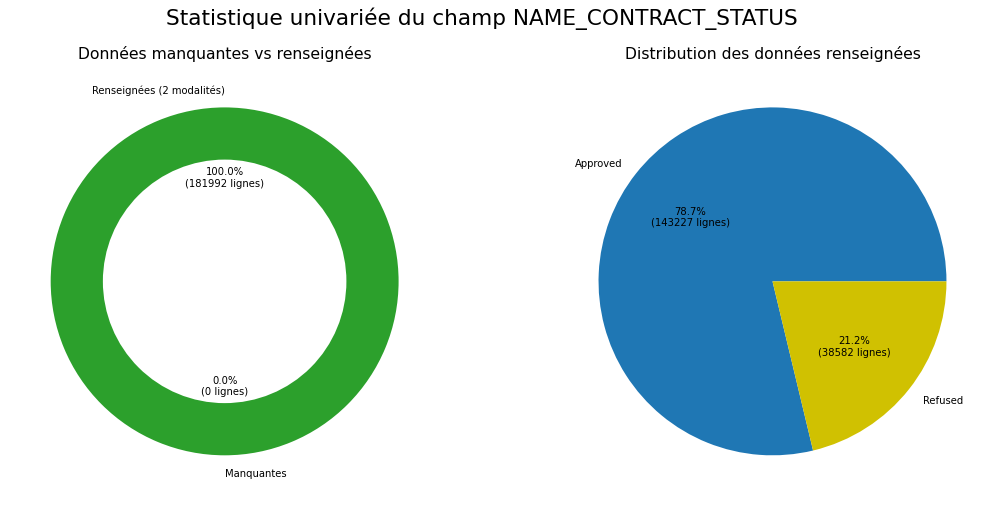

In [95]:
myDf(dfPreviousApplication).Stat(['NAME_CONTRACT_STATUS'], statsNan=True)

### Statut courant du previous application

#### dfPosCashBalance et dfCreditCardBalance contiennent le dernier status de PreviousApplication, on le remonte dans PreviousApplication

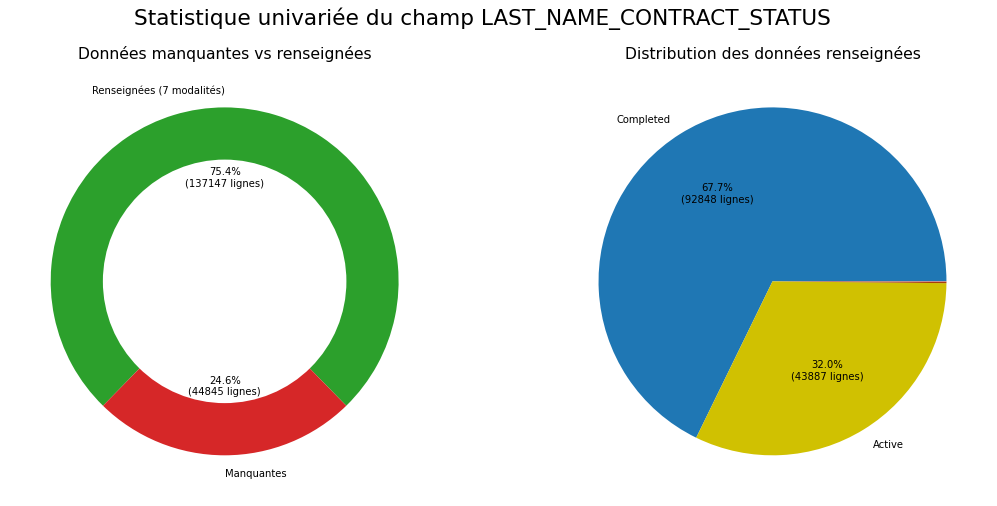

In [96]:
dfPreviousApplicationStatus = pd.concat([dfPosCashBalance[['SK_ID_CURR','SK_ID_PREV','MONTHS_BALANCE','NAME_CONTRACT_STATUS']],dfCreditCardBalance[['SK_ID_CURR','SK_ID_PREV','MONTHS_BALANCE','NAME_CONTRACT_STATUS']]])
tmp = dfPreviousApplicationStatus.groupby(['SK_ID_CURR','SK_ID_PREV']).agg({'MONTHS_BALANCE':'max'}).reset_index(drop=False)
dfPreviousApplicationStatus = dfPreviousApplicationStatus.merge(tmp, left_on=['SK_ID_CURR','SK_ID_PREV','MONTHS_BALANCE'], right_on=['SK_ID_CURR','SK_ID_PREV','MONTHS_BALANCE'])
del dfPreviousApplicationStatus['MONTHS_BALANCE']
dfPreviousApplicationStatus = dfPreviousApplicationStatus.rename(columns={'NAME_CONTRACT_STATUS': 'LAST_NAME_CONTRACT_STATUS'})
dfPreviousApplication = dfPreviousApplication.merge(dfPreviousApplicationStatus, left_on=['SK_ID_CURR','SK_ID_PREV'], right_on=['SK_ID_CURR','SK_ID_PREV'], how='left')
myDf(dfPreviousApplication).Stat('LAST_NAME_CONTRACT_STATUS', statsNan=True)

In [97]:
dfPreviousApplication.LAST_NAME_CONTRACT_STATUS.value_counts()

Completed                92951
Active                   43969
Signed                     166
Returned to the store       47
Approved                     8
Demand                       5
Amortized debt               1
Name: LAST_NAME_CONTRACT_STATUS, dtype: int64

#### LastContractStatus n'est renseigné que sur les Approved

/home/pierre/Documents/Projet_7/Git/credit_scoring/myTools.py:1477: RuntimeWarning: invalid value encountered in double_scalars
  tschuprow = math.sqrt(phi2 / math.sqrt((r-1)*(c-1)))
/home/pierre/Documents/Projet_7/Git/credit_scoring/myTools.py:1478: RuntimeWarning: invalid value encountered in double_scalars
  cramer = math.sqrt(phi2/(min(r,c)-1))
/home/pierre/anaconda3/lib/python3.8/site-packages/seaborn/matrix.py:203: RuntimeWarning: All-NaN slice encountered
  vmin = np.nanmin(calc_data)
/home/pierre/anaconda3/lib/python3.8/site-packages/seaborn/matrix.py:208: RuntimeWarning: All-NaN slice encountered
  vmax = np.nanmax(calc_data)


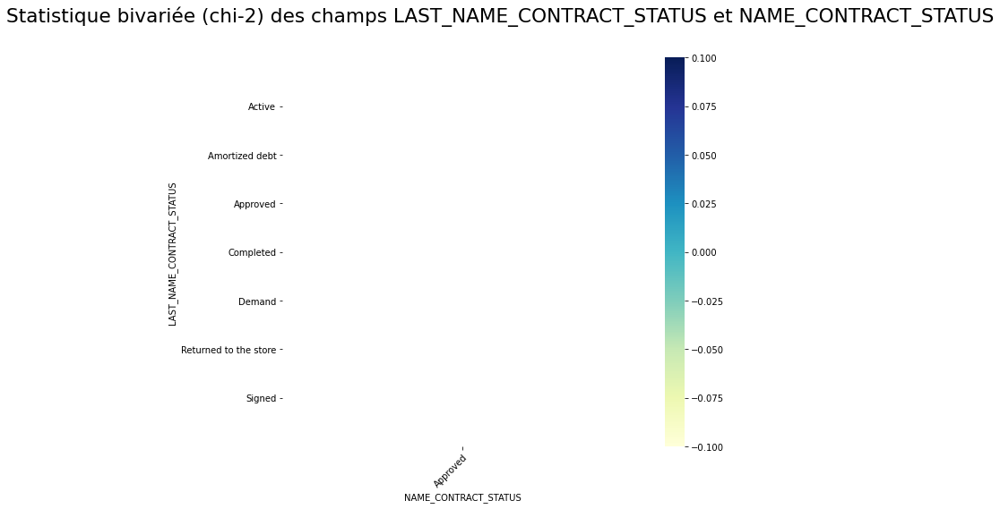

chi-2 entre LAST_NAME_CONTRACT_STATUS et NAME_CONTRACT_STATUS : 0.0 
phi-2 entre LAST_NAME_CONTRACT_STATUS et NAME_CONTRACT_STATUS : 0.0 
coefficient T de Tschuprow entre LAST_NAME_CONTRACT_STATUS et NAME_CONTRACT_STATUS : nan 
coefficient C de Cramer entre LAST_NAME_CONTRACT_STATUS et NAME_CONTRACT_STATUS : nan 


In [98]:
myDf(dfPreviousApplication).Stat(['NAME_CONTRACT_STATUS','LAST_NAME_CONTRACT_STATUS'], typeStat='biv')

#### LastContractStatus non renseigné 6171 PreviousApplication Approved

In [99]:
dfPreviousApplication[(dfPreviousApplication.NAME_CONTRACT_STATUS == 'Approved') & (dfPreviousApplication.LAST_NAME_CONTRACT_STATUS.isnull())].shape

(6168, 38)

#### Création d'une seule variable CONTRACT_STATUS: Active / Completed / Refused

In [100]:
dfPreviousApplication['CONTRACT_STATUS'] = dfPreviousApplication.apply(lambda x: np.where(x.NAME_CONTRACT_STATUS=='Refused','Refused',np.where(x.LAST_NAME_CONTRACT_STATUS=='Completed','Completed','Active')), axis=1)
del dfPreviousApplication['NAME_CONTRACT_STATUS']
del dfPreviousApplication['LAST_NAME_CONTRACT_STATUS']

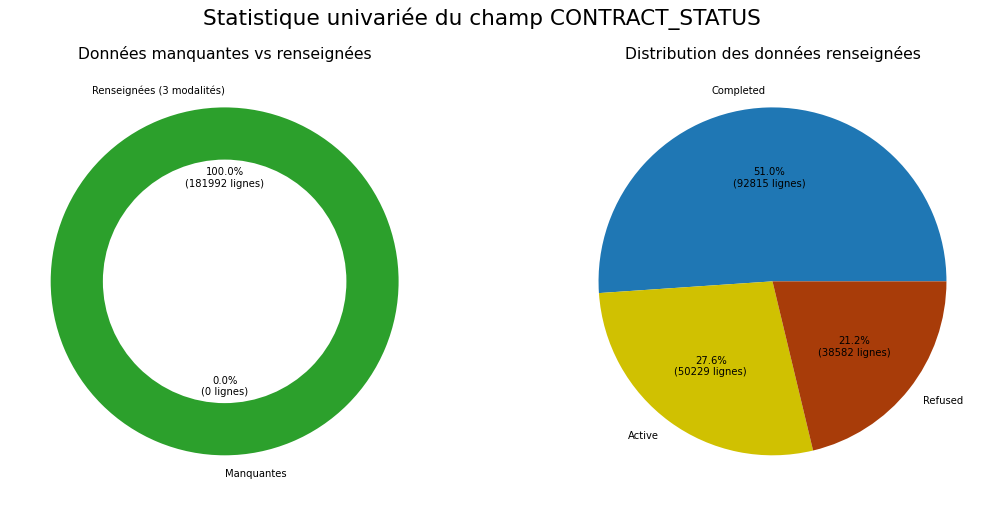

In [101]:
myDf(dfPreviousApplication).Stat('CONTRACT_STATUS', statsNan=True)

### Remontée dans dfApplication du nombre de statuts previous

In [102]:
dfPreviousRefused = dfPreviousApplication[dfPreviousApplication.CONTRACT_STATUS == 'Refused']
dfNbPreviousRefused = pd.DataFrame(dfPreviousRefused.groupby('SK_ID_CURR').size(), columns=['PREV_NB_REFUSED']).reset_index(drop=False)
dfPreviousActive = dfPreviousApplication[dfPreviousApplication.CONTRACT_STATUS == 'Active']
dfNbPreviousActive = pd.DataFrame(dfPreviousActive.groupby('SK_ID_CURR').size(), columns=['PREV_NB_ACTIVE']).reset_index(drop=False)
dfPreviousCompleted = dfPreviousApplication[dfPreviousApplication.CONTRACT_STATUS == 'Completed']
dfNbPreviousCompleted = pd.DataFrame(dfPreviousCompleted.groupby('SK_ID_CURR').size(), columns=['PREV_NB_COMPLETED']).reset_index(drop=False)
dfApplication = dfApplication.merge(dfNbPreviousRefused, right_on='SK_ID_CURR', left_on='SK_ID_CURR', how='left')
dfApplication = dfApplication.merge(dfNbPreviousActive, right_on='SK_ID_CURR', left_on='SK_ID_CURR', how='left')
dfApplication = dfApplication.merge(dfNbPreviousCompleted, right_on='SK_ID_CURR', left_on='SK_ID_CURR', how='left')

In [103]:
dfApplication['PREV_NB_REFUSED'] = dfApplication['PREV_NB_REFUSED'].fillna(0).astype('uint32')
dfApplication['PREV_NB_ACTIVE'] = dfApplication['PREV_NB_ACTIVE'].fillna(0).astype('uint32')
dfApplication['PREV_NB_COMPLETED'] = dfApplication['PREV_NB_COMPLETED'].fillna(0).astype('uint32')

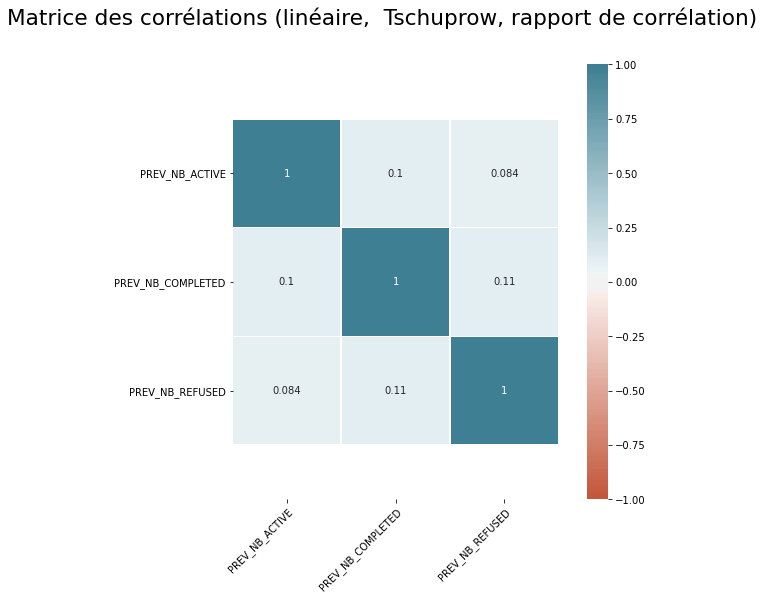

In [104]:
myDf(dfApplication).Stat(['PREV_NB_ACTIVE','PREV_NB_COMPLETED','PREV_NB_REFUSED'], typeStat='biv', bivOnlyCorrTable=True)

#### Corrélation avec TARGET

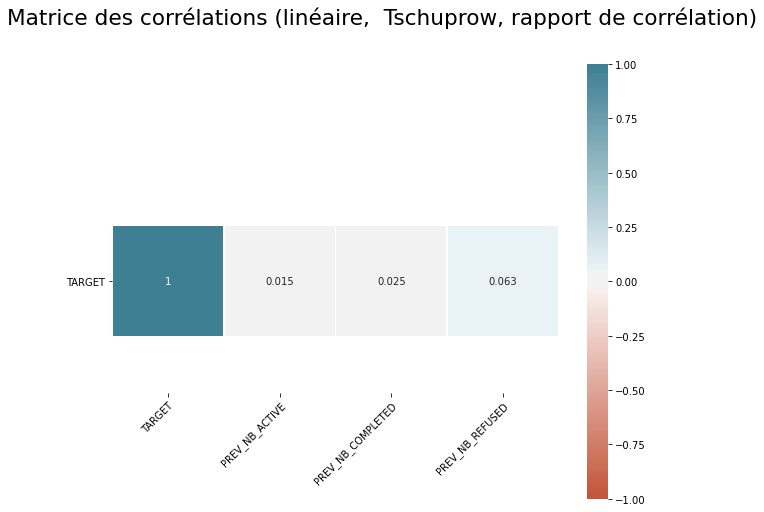

In [105]:
myDf(dfApplication[['PREV_NB_ACTIVE','PREV_NB_COMPLETED','PREV_NB_REFUSED','TARGET']]).Stat(bivInclCol='TARGET',typeStat='biv',bivOnlyCorrTable=True)

### Remontée dans dfApplication des raisons de rejet de previous application

In [106]:
dfPreviousApplicationRefused = dfPreviousApplication[dfPreviousApplication.CONTRACT_STATUS == 'Refused']
dfPreviousApplication = dfPreviousApplication[dfPreviousApplication.CONTRACT_STATUS != 'Refused']
del dfPreviousApplication['CODE_REJECT_REASON']

In [107]:
dfPreviousApplicationRefused.CODE_REJECT_REASON.unique()

array(['HC', 'SCO', 'SCOFR', 'LIMIT', 'VERIF', nan, 'SYSTEM'],
      dtype=object)

In [110]:
 dfPreviousApplicationRefused = myDf(dfPreviousApplicationRefused).GroupBy(['SK_ID_CURR','CODE_REJECT_REASON'])

In [111]:
for code in ['HC', 'SCO', 'SCOFR', 'LIMIT', 'VERIF', 'SYSTEM']:
    tmp = dfPreviousApplicationRefused[dfPreviousApplicationRefused.CODE_REJECT_REASON == code].copy()
    tmp = tmp[['SK_ID_CURR','count']]
    tmp = tmp.rename(columns={'count':'PREV_NB_REFUSED_'+code})
    dfApplication = dfApplication.merge(tmp, left_on='SK_ID_CURR', right_on='SK_ID_CURR', how='left')

In [112]:
dfApplication['PREV_NB_REFUSED_HC'] = dfApplication['PREV_NB_REFUSED_HC'].fillna(0).astype('uint32')
dfApplication['PREV_NB_REFUSED_SCO'] = dfApplication['PREV_NB_REFUSED_SCO'].fillna(0).astype('uint32')
dfApplication['PREV_NB_REFUSED_SCOFR'] = dfApplication['PREV_NB_REFUSED_SCOFR'].fillna(0).astype('uint32')
dfApplication['PREV_NB_REFUSED_LIMIT'] = dfApplication['PREV_NB_REFUSED_LIMIT'].fillna(0).astype('uint32')
dfApplication['PREV_NB_REFUSED_VERIF'] = dfApplication['PREV_NB_REFUSED_VERIF'].fillna(0).astype('uint32')
dfApplication['PREV_NB_REFUSED_SYSTEM'] = dfApplication['PREV_NB_REFUSED_SYSTEM'].fillna(0).astype('uint32')

## Statistiques par current application

In [90]:
nbWithPrevious = dfApplication[dfApplication.SK_ID_CURR.isin(dfPreviousApplication.SK_ID_CURR)].shape[0]
nbWithoutPrevious = dfApplication[~dfApplication.SK_ID_CURR.isin(dfPreviousApplication.SK_ID_CURR)].shape[0]
print("{} loans sans previous ({}%)".format(nbWithoutPrevious, np.round(100 * nbWithoutPrevious / (nbWithPrevious + nbWithoutPrevious), 1)))

2909 loans sans previous (5.8%)


Text(0.5, 1.0, 'Stat nb previous application at credit bureau')

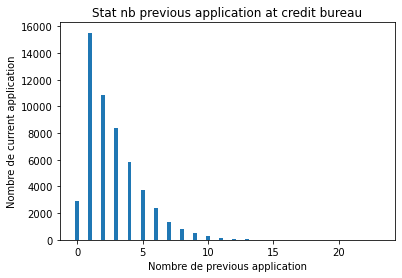

In [91]:
distrib_nb_previous = dfApplication.merge(dfPreviousApplication[['SK_ID_CURR']], left_on='SK_ID_CURR', right_on='SK_ID_CURR', how='left')['SK_ID_CURR'].value_counts().value_counts()
distrib_nb_previous[0] = nbWithoutPrevious
tmp = pd.DataFrame({'nb_previous': pd.Series(distrib_nb_previous.index),
                   'nb_application': distrib_nb_previous.reset_index(drop=True)}).sort_values('nb_previous')
plt.bar(pd.Series(distrib_nb_previous.index), distrib_nb_previous.reset_index(drop=True), width=0.3)
plt.xlabel('Nombre de previous application')
plt.ylabel('Nombre de current application')
plt.title("Stat nb previous application at credit bureau")

## Suppression de variables non pertinentes

### Fonctionnellement inintéressantes

In [92]:
del dfPreviousApplication['FLAG_LAST_APPL_PER_CONTRACT'] # Flag if it was last application for the previous contract. Sometimes by mistake of client or our clerk there could be more applications for one single contract
del dfPreviousApplication['NFLAG_LAST_APPL_IN_DAY'] # Flag if the application was the last application per day of the client. Sometimes clients apply for more applications a day. Rarely it could also be error in our system that one application is in the database twice

del dfPreviousApplication['NAME_TYPE_SUITE'] # Who accompanied client when applying for the previous application
del dfPreviousApplication['WEEKDAY_APPR_PROCESS_START'] #On which day of the week did the client apply for the loan
del dfPreviousApplication['HOUR_APPR_PROCESS_START'] #Approximately at what hour did the client apply for the loan
del dfPreviousApplication['NAME_CLIENT_TYPE'] #Was the client old or new client when applying for the previous application
del dfPreviousApplication['SELLERPLACE_AREA'] #Selling area of seller place of the previous application

### Trop de valeurs manquantes

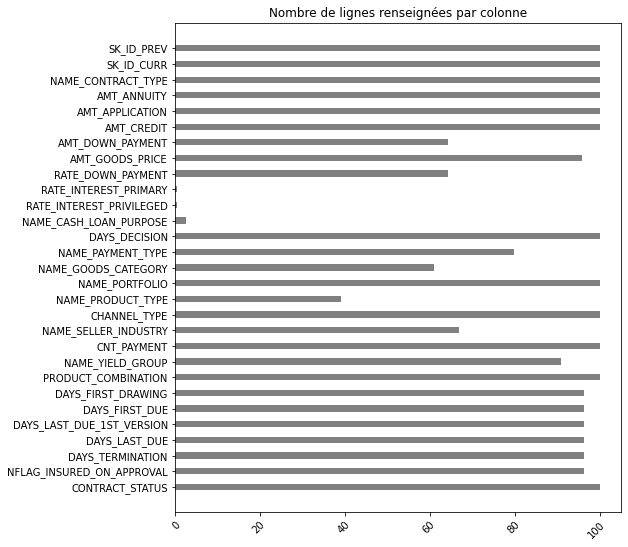

In [93]:
myDf(dfPreviousApplication).ColCountLinesChart(typeChart='barh', displayColName=True)

In [94]:
del dfPreviousApplication['RATE_INTEREST_PRIMARY']
del dfPreviousApplication['RATE_INTEREST_PRIVILEGED']
del dfPreviousApplication['NAME_CASH_LOAN_PURPOSE']

### Trop de valeurs identiques

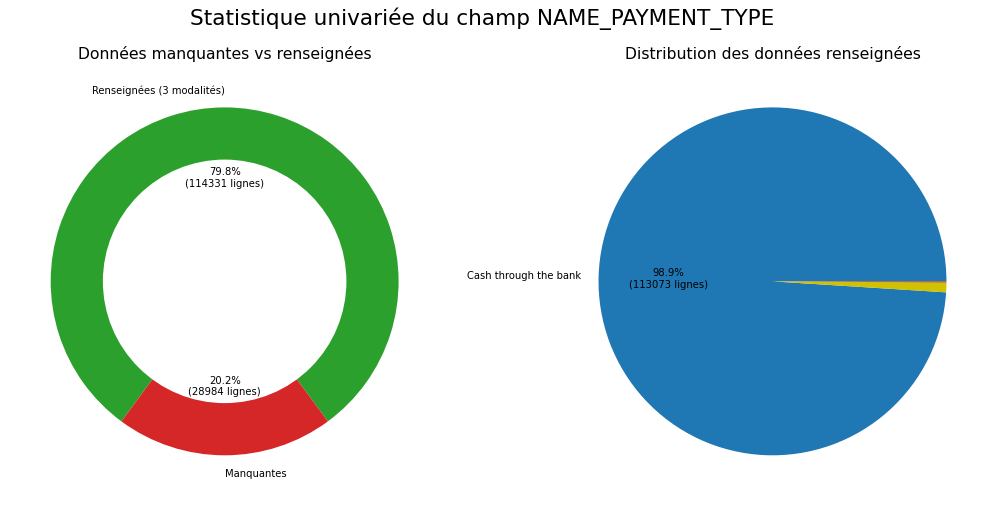

In [95]:
myDf(dfPreviousApplication).Stat(['NAME_PAYMENT_TYPE'],typeStat='univ', statsNan=True)

In [96]:
del dfPreviousApplication['NAME_PAYMENT_TYPE']

## Recherche de corrélations

### Champs days

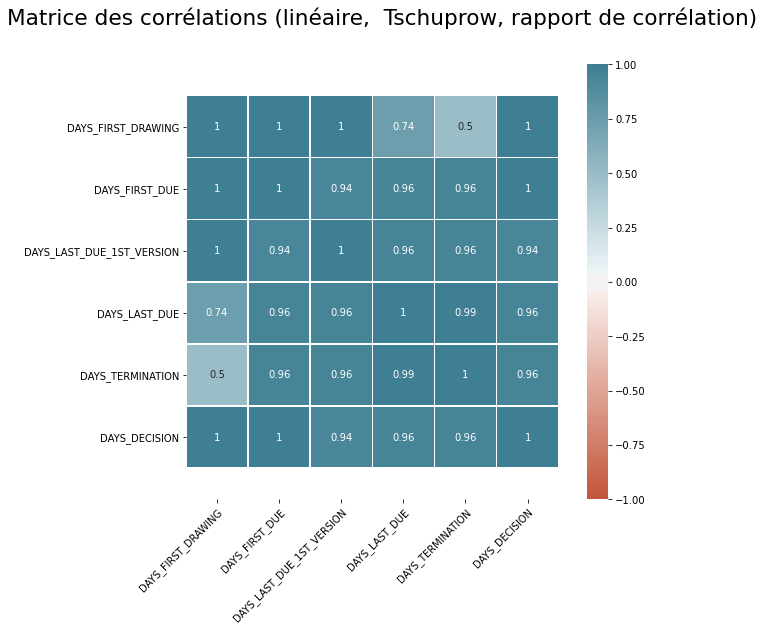

In [97]:
myDf(dfPreviousApplication.replace(365243,np.nan)).Stat(['DAYS_FIRST_DRAWING','DAYS_FIRST_DUE','DAYS_LAST_DUE_1ST_VERSION','DAYS_LAST_DUE','DAYS_TERMINATION','DAYS_DECISION'], bivOnlyCorrTable=True, typeStat='biv')

In [98]:
print('Nombre de lignes avec le champ vide:')
print((dfPreviousApplication[['DAYS_FIRST_DRAWING','DAYS_FIRST_DUE','DAYS_LAST_DUE_1ST_VERSION','DAYS_LAST_DUE','DAYS_TERMINATION','DAYS_DECISION']].isnull()).sum())

Nombre de lignes avec le champ vide:
DAYS_FIRST_DRAWING           5376
DAYS_FIRST_DUE               5376
DAYS_LAST_DUE_1ST_VERSION    5376
DAYS_LAST_DUE                5376
DAYS_TERMINATION             5376
DAYS_DECISION                   0
dtype: int64


In [99]:
del dfPreviousApplication['DAYS_FIRST_DRAWING']
del dfPreviousApplication['DAYS_FIRST_DUE']
del dfPreviousApplication['DAYS_LAST_DUE_1ST_VERSION']
del dfPreviousApplication['DAYS_LAST_DUE']
del dfPreviousApplication['DAYS_TERMINATION']

### Montants

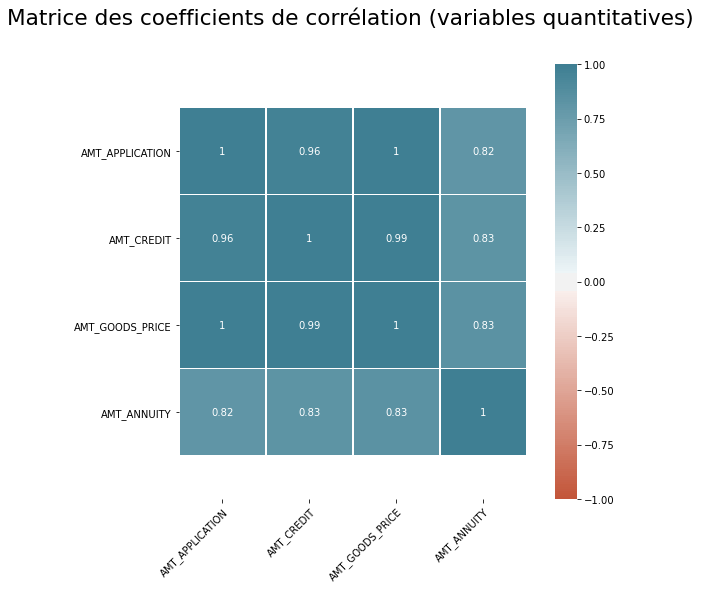

In [100]:
myDf(dfPreviousApplication).Stat(['AMT_APPLICATION','AMT_CREDIT','AMT_GOODS_PRICE','AMT_ANNUITY'], typeStat='biv', bivThresholdCorr=2) 

In [101]:
print('Nombre de lignes avec le champ vide:')
print((dfPreviousApplication[['AMT_APPLICATION','AMT_CREDIT','AMT_GOODS_PRICE','AMT_ANNUITY']].isnull()).sum())

Nombre de lignes avec le champ vide:
AMT_APPLICATION       0
AMT_CREDIT            1
AMT_GOODS_PRICE    5950
AMT_ANNUITY           0
dtype: int64


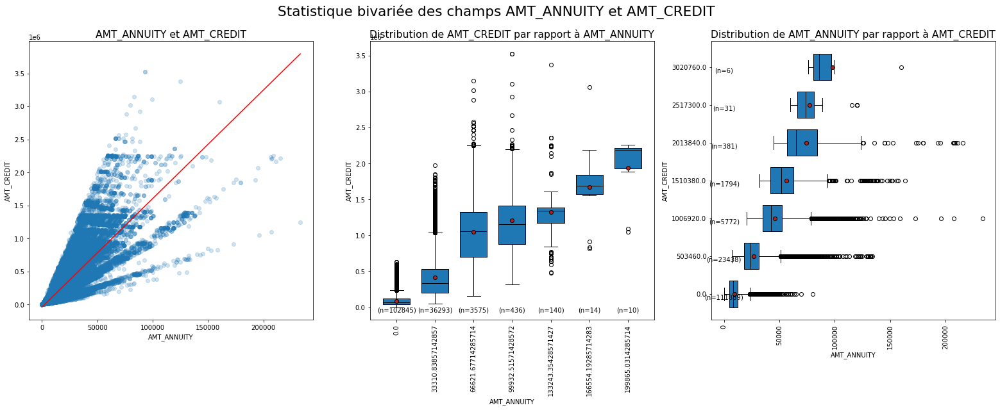

Covariance entre AMT_ANNUITY et AMT_CREDIT : 3142056267.893169 
Covariance débiaisée entre AMT_ANNUITY et AMT_CREDIT : 3142078192.326178 
Coefficient de correlation linéaire entre AMT_ANNUITY et AMT_CREDIT : 0.8287989499614549 
Régression linéaire entre AMT_ANNUITY et AMT_CREDIT: y = 16.44219029339343x + -39467.71409959785
Coefficient de détermination entre AMT_ANNUITY et AMT_CREDIT : 0.6869076994572102 


In [102]:
myDf(dfPreviousApplication).Stat(['AMT_CREDIT','AMT_ANNUITY'], typeStat='biv')

In [103]:
del dfPreviousApplication['AMT_APPLICATION']
del dfPreviousApplication['AMT_GOODS_PRICE']

### Contract type portfolio name

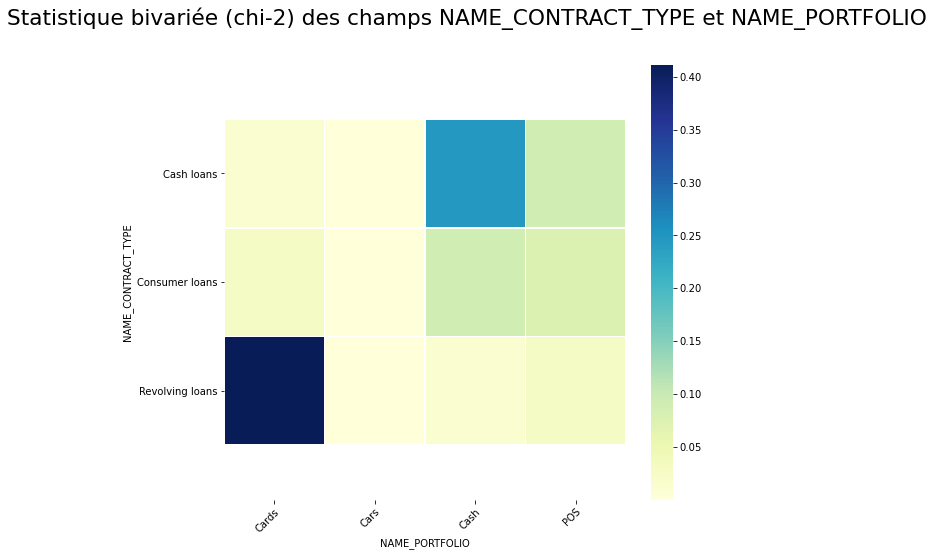

chi-2 entre NAME_CONTRACT_TYPE et NAME_PORTFOLIO : 286630.0 
phi-2 entre NAME_CONTRACT_TYPE et NAME_PORTFOLIO : 2.0 
coefficient T de Tschuprow entre NAME_CONTRACT_TYPE et NAME_PORTFOLIO : 0.9036020036098449 
coefficient C de Cramer entre NAME_CONTRACT_TYPE et NAME_PORTFOLIO : 1.0 


In [104]:
myDf(dfPreviousApplication).Stat(['NAME_CONTRACT_TYPE','NAME_PORTFOLIO'], typeStat='biv')

In [105]:
print('Nombre de lignes avec le champ vide:')
(dfPreviousApplication[['NAME_CONTRACT_TYPE','NAME_PORTFOLIO']].isnull()).sum()

Nombre de lignes avec le champ vide:


NAME_CONTRACT_TYPE    0
NAME_PORTFOLIO        0
dtype: int64

In [106]:
del dfPreviousApplication['NAME_PORTFOLIO']

### Matrice des corrélations des variables restantes

/home/pierre/Documents/Projet_7/Git/credit_scoring/myTools.py:1477: RuntimeWarning: invalid value encountered in double_scalars
  tschuprow = math.sqrt(phi2 / math.sqrt((r-1)*(c-1)))
/home/pierre/Documents/Projet_7/Git/credit_scoring/myTools.py:1478: RuntimeWarning: invalid value encountered in double_scalars
  cramer = math.sqrt(phi2/(min(r,c)-1))


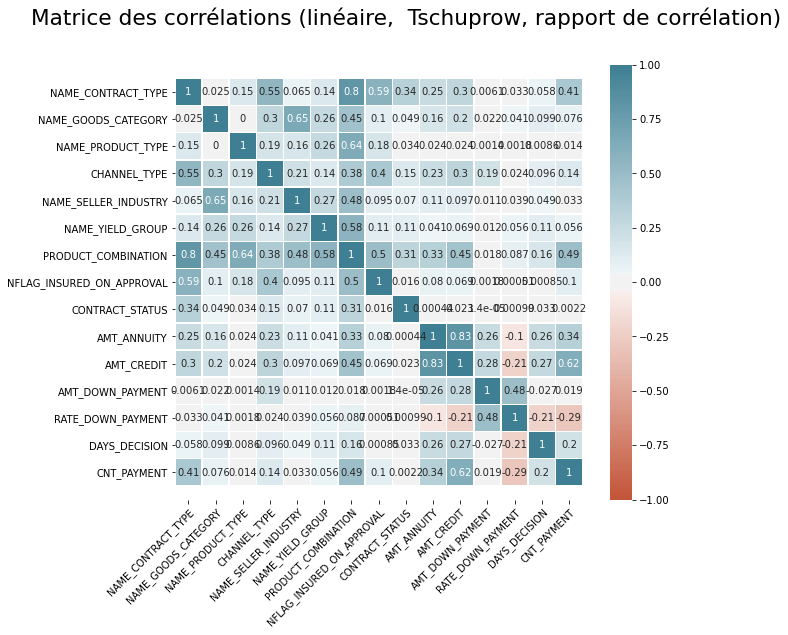

In [107]:
myDf(dfPreviousApplication).Stat(exclCol=['SK_ID_CURR','SK_ID_PREV'], typeStat='biv', bivOnlyCorrTable=True)

### Remontée dans dfApplication d'informations sur les montants de crédit

#### Remontée dans dfApplication du montant total de crédits déjà remboursés

In [108]:
dfPrevAmtCompleted = dfPreviousApplication[dfPreviousApplication.CONTRACT_STATUS == 'Completed'][['SK_ID_CURR','AMT_CREDIT']].groupby('SK_ID_CURR').agg({'AMT_CREDIT':'sum'}).reset_index(drop=False).rename(columns={'AMT_CREDIT':'PREV_AMT_COMPLETED'})
dfApplication = dfApplication.merge(dfPrevAmtCompleted, left_on='SK_ID_CURR', right_on='SK_ID_CURR', how='left')
dfApplication['PREV_AMT_COMPLETED'] = dfApplication['PREV_AMT_COMPLETED'].fillna(0).astype('float')

#### Remontée dans dfApplication du montant total de crédits revolvings actifs

In [109]:
dfPrevAmtRevolving = dfPreviousApplication[(dfPreviousApplication.CONTRACT_STATUS == 'Active') & (dfPreviousApplication.NAME_CONTRACT_TYPE == 'Revolving loans')][['SK_ID_CURR','AMT_CREDIT']].groupby('SK_ID_CURR').agg({'AMT_CREDIT':'sum'}).reset_index(drop=False).rename(columns={'AMT_CREDIT':'PREV_AMT_REVOLVING'})
dfApplication = dfApplication.merge(dfPrevAmtRevolving, left_on='SK_ID_CURR', right_on='SK_ID_CURR', how='left')
dfApplication['PREV_AMT_REVOLVING'] = dfApplication['PREV_AMT_REVOLVING'].fillna(0).astype('float')

#### Remontée dans dfApplication du montant total de crédits non-revolvings actifs

In [110]:
dfPrevAmtCreditActive = dfPreviousApplication[(dfPreviousApplication.CONTRACT_STATUS == 'Active') & (dfPreviousApplication.NAME_CONTRACT_TYPE != 'Revolving loans')][['SK_ID_CURR','AMT_CREDIT']].groupby('SK_ID_CURR').agg({'AMT_CREDIT':'sum'}).reset_index(drop=False).rename(columns={'AMT_CREDIT':'PREV_AMT_CREDIT_ACTIVE'})
dfApplication = dfApplication.merge(dfPrevAmtCreditActive, left_on='SK_ID_CURR', right_on='SK_ID_CURR', how='left')
dfApplication['PREV_AMT_CREDIT_ACTIVE'] = dfApplication['PREV_AMT_CREDIT_ACTIVE'].fillna(0).astype('float')

#### Remontée dans dfApplication d'un ratio moyen de remboursement des crédits actifs non revolvings

##### Remontée dans dfPrevious du nombre de payments effectués

In [111]:
dfPaymentsDone = pd.DataFrame(dfInstallmentsPayments[['SK_ID_PREV','SK_ID_CURR']].groupby(['SK_ID_PREV','SK_ID_CURR']).size(), columns=['CNT_PAYMENT_DONE']).reset_index(drop=False)
dfPreviousApplication = dfPreviousApplication.merge(dfPaymentsDone, left_on=['SK_ID_PREV','SK_ID_CURR'], right_on=['SK_ID_PREV','SK_ID_CURR'], how='left')
dfPreviousApplication['CNT_PAYMENT_DONE'] = dfPreviousApplication['CNT_PAYMENT_DONE'].fillna(0).astype('float')

##### Calcul d'un ratio avec le nombre de payment initialement prévus

In [113]:
dfPreviousApplication['RATIO_CNT_PAYMENT'] = dfPreviousApplication.apply(lambda x: 
                                                                         
np.where(x.CONTRACT_STATUS=='Completed', 1, np.where(x.CNT_PAYMENT==0, 0, x.CNT_PAYMENT_DONE/(x.CNT_PAYMENT+0.1)))

         , axis=1)

##### Application du ratio à AMT_CREDIT

In [117]:
dfPreviousApplication['AMT_CREDIT_RATIO'] = dfPreviousApplication.apply(lambda x: x.RATIO_CNT_PAYMENT * x.AMT_CREDIT, axis=1)

In [118]:
tmp = dfPreviousApplication[(dfPreviousApplication.CONTRACT_STATUS == 'Active') & (dfPreviousApplication.NAME_CONTRACT_TYPE != 'Revolving loans')]
tmp = tmp[['SK_ID_CURR','AMT_CREDIT_RATIO']].groupby('SK_ID_CURR').agg({'AMT_CREDIT_RATIO':'sum'}).reset_index(drop=False).rename(columns={'AMT_CREDIT_RATIO':'SUM_AMT_CREDIT_RATIO'})
dfPrevAmtCreditActive = dfPrevAmtCreditActive.merge(tmp, left_on='SK_ID_CURR', right_on='SK_ID_CURR', how='left')

In [119]:
dfPrevAmtCreditActive['PREV_AMT_CREDIT_ACTIVE_REIMBURSED_INDIC'] = dfPrevAmtCreditActive.apply(lambda x: x.SUM_AMT_CREDIT_RATIO / x.PREV_AMT_CREDIT_ACTIVE , axis=1)

In [120]:
dfPrevAmtCreditActive = dfPrevAmtCreditActive[['SK_ID_CURR','PREV_AMT_CREDIT_ACTIVE_REIMBURSED_INDIC']]
dfApplication = dfApplication.merge(dfPrevAmtCreditActive, left_on='SK_ID_CURR', right_on='SK_ID_CURR', how='left')
dfApplication['PREV_AMT_CREDIT_ACTIVE_REIMBURSED_INDIC'] = dfApplication['PREV_AMT_CREDIT_ACTIVE_REIMBURSED_INDIC'].fillna(0).astype('float')

#### Remontée du montant total de AMT_ANNUITY sur les crédits actifs

In [121]:
dfPrevAmtAnnuity = dfPreviousApplication[dfPreviousApplication.CONTRACT_STATUS == 'Active'][['SK_ID_CURR','AMT_ANNUITY']]
dfPrevAmtAnnuity = dfPrevAmtAnnuity.groupby('SK_ID_CURR').agg({'AMT_ANNUITY':'sum'}).reset_index(drop=False).rename(columns={'AMT_ANNUITY':'PREV_ANNUITY_ACTIVE'})
dfApplication = dfApplication.merge(dfPrevAmtAnnuity, left_on='SK_ID_CURR', right_on='SK_ID_CURR', how='left')
dfApplication['AMT_ANNUITY'] = dfApplication['AMT_ANNUITY'].fillna(0).astype('float')

#### Suppression de dfPreviousApplication des champs remontés dans dfApplication

In [122]:
cols = ['AMT_CREDIT', 'CNT_PAYMENT', 'CNT_PAYMENT_DONE', 'RATIO_CNT_PAYMENT', 'AMT_CREDIT_RATIO','AMT_ANNUITY']
for col in cols:
    del dfPreviousApplication[col]

In [123]:
dfPreviousApplication

,SK_ID_PREV,SK_ID_CURR,NAME_CONTRACT_TYPE,AMT_DOWN_PAYMENT,RATE_DOWN_PAYMENT,DAYS_DECISION,NAME_GOODS_CATEGORY,NAME_PRODUCT_TYPE,CHANNEL_TYPE,NAME_SELLER_INDUSTRY,NAME_YIELD_GROUP,PRODUCT_COMBINATION,NFLAG_INSURED_ON_APPROVAL,CONTRACT_STATUS
0,2819243,176158,Cash loans,NaN,NaN,-512,NaN,x-sell,Credit and cash offices,NaN,middle,Cash X-Sell: middle,1.0,Completed
1,1745648,176158,Cash loans,NaN,NaN,-734,NaN,x-sell,Credit and cash offices,NaN,middle,Cash X-Sell: middle,1.0,Completed
2,1117451,176158,Cash loans,NaN,NaN,-1176,NaN,x-sell,Credit and cash offices,NaN,middle,Cash X-Sell: middle,1.0,Completed
3,2412774,176158,Cash loans,NaN,NaN,-537,NaN,x-sell,Credit and cash offices,NaN,middle,Cash X-Sell: middle,1.0,Completed
4,2428526,176158,Cash loans,NaN,NaN,-1421,NaN,walk-in,Credit and cash offices,NaN,high,Cash Street: high,0.0,Completed
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
143310,2116003,375393,Consumer loans,0.0,0.000000,-416,Photo / Cinema Equipment,NaN,Country-wide,Consumer electronics,low_action,POS household without interest,0.0,Completed
143311,1383014,297425,Consumer loans,2250.0,0.094277,-275,Mobile,NaN,Country-wide,Connectivity,high,POS mobile with interest,0.0,Active
143312,1081535,236604,Consumer loans,0.0,0.000000,-916,Construction Materials,NaN,Stone,Construction,middle,POS industry with interest,NaN,Active
143313,1420189,236604,Consumer loans,0.0,0.000000,-916,Construction Materials,NaN,Stone,Construction,middle,POS industry with interest,0.0,Completed


### Feature engineering sur NAME_YIELD_GROUP et NAME_PRODUCT_TYPE

In [125]:
dfPreviousApplication.at[dfPreviousApplication[dfPreviousApplication.NAME_YIELD_GROUP == 'high'].index, "NAME_YIELD_GROUP_ORD"] = 3
dfPreviousApplication.at[dfPreviousApplication[dfPreviousApplication.NAME_YIELD_GROUP == 'middle'].index, "NAME_YIELD_GROUP_ORD"] = 2
dfPreviousApplication.at[dfPreviousApplication[dfPreviousApplication.NAME_YIELD_GROUP == 'low_normal'].index, "NAME_YIELD_GROUP_ORD"] = 1
dfPreviousApplication.at[dfPreviousApplication[dfPreviousApplication.NAME_YIELD_GROUP == 'low_action'].index, "NAME_YIELD_GROUP_ORD"] = 1
dfPreviousApplication['NAME_YIELD_GROUP_ORD'] = dfPreviousApplication['NAME_YIELD_GROUP_ORD'].astype(float) 

In [126]:
dfXSell = dfPreviousApplication[dfPreviousApplication.NAME_PRODUCT_TYPE == 'x-sell'][['SK_ID_CURR']].drop_duplicates()
dfXSell['X_SELL'] = 1
dfPreviousApplication = dfPreviousApplication.merge(dfXSell, left_on='SK_ID_CURR', right_on='SK_ID_CURR', how='left')
dfPreviousApplication['X_SELL'] = dfPreviousApplication.apply(lambda x: np.where(x.X_SELL==1,1,0), axis=1)
dfPreviousApplication.X_SELL = dfPreviousApplication.X_SELL.astype(float)

## Statistique univariée

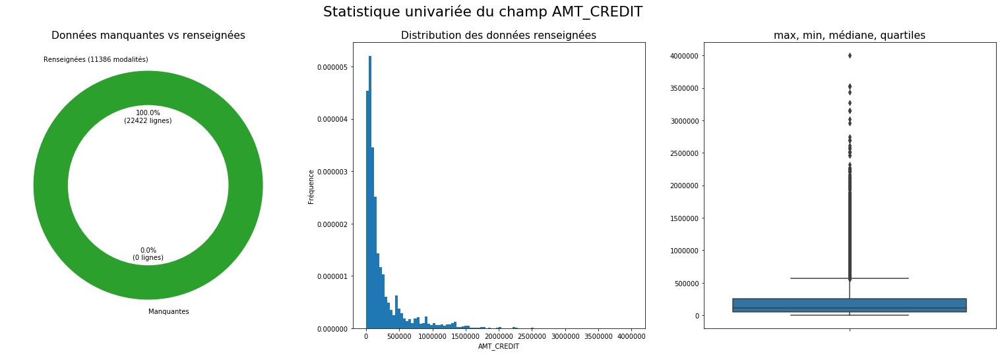

Mesures de position
 - Moyenne: 233241.17
 - Médiane: 110819.25
Mesures de dispertion
 - Ecart type: 329219.72
 - Min: 0.0
 - Q25: 48003.75
 - Q75: 254700.0
 - Max: 4005000.0
Mesures de forme
 - Skewness (asymétrie): 3.07
 - Kurtosis (applatissement): 12.73


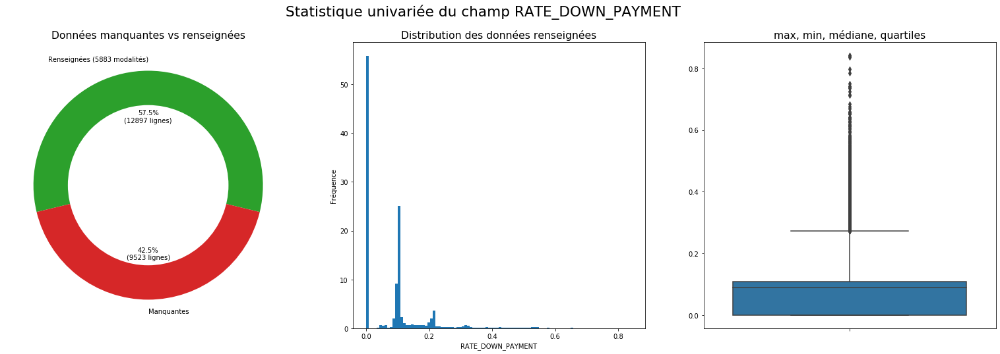

Mesures de position
 - Moyenne: 0.08
 - Médiane: 0.09
Mesures de dispertion
 - Ecart type: 0.11
 - Min: 0.0
 - Q25: 0.0
 - Q75: 0.11
 - Max: 0.84
Mesures de forme
 - Skewness (asymétrie): 2.1
 - Kurtosis (applatissement): 6.12


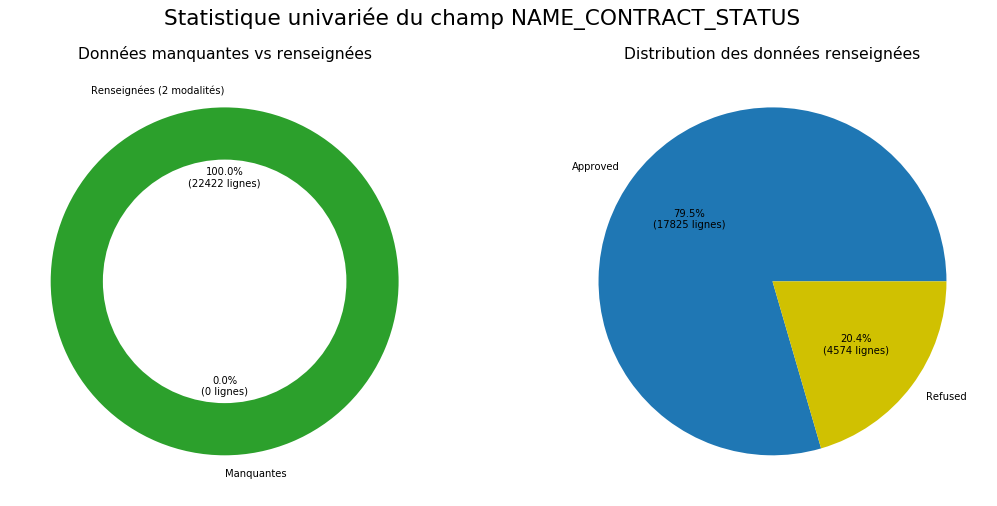

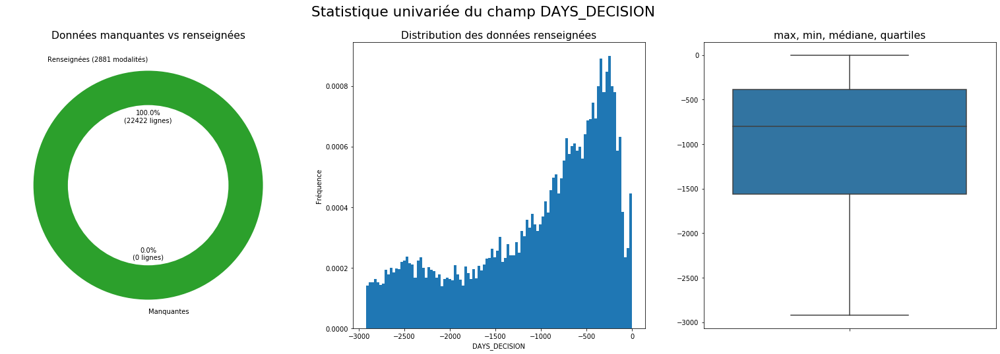

Mesures de position
 - Moyenne: -1044.12
 - Médiane: -800.0
Mesures de dispertion
 - Ecart type: 793.15
 - Min: -2922
 - Q25: -1564.0
 - Q75: -391.0
 - Max: -2
Mesures de forme
 - Skewness (asymétrie): -0.77
 - Kurtosis (applatissement): -0.58


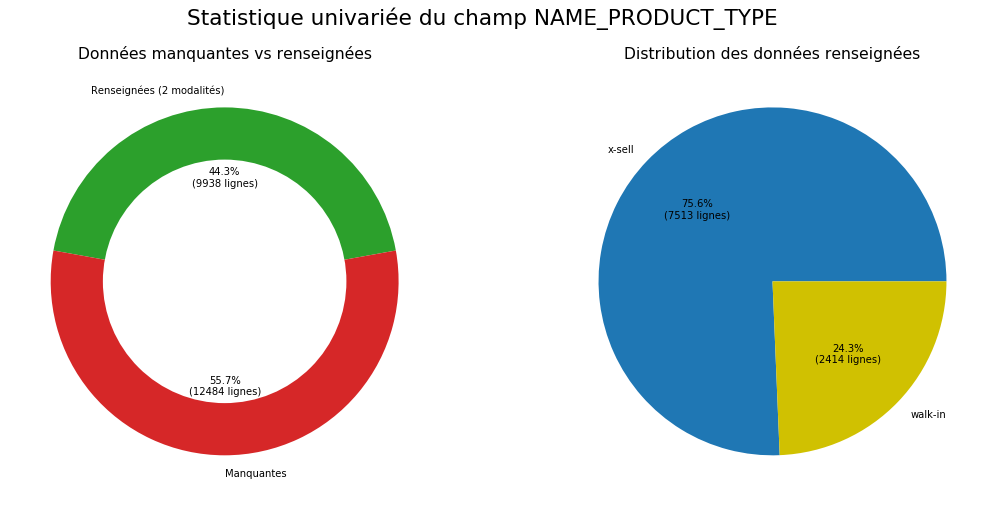

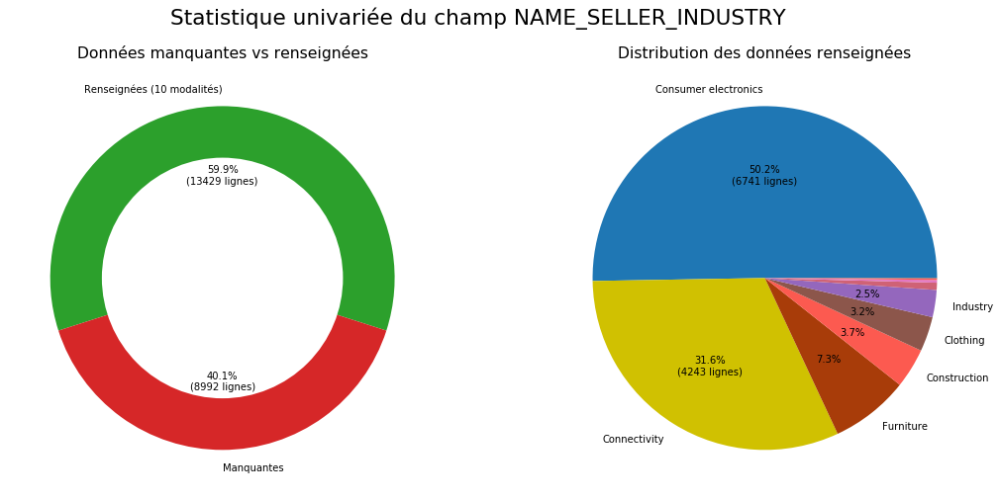

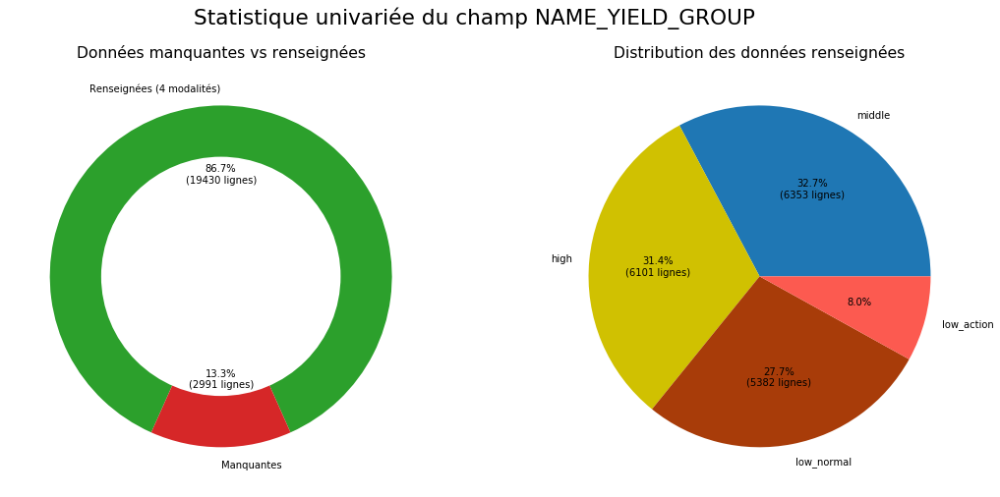

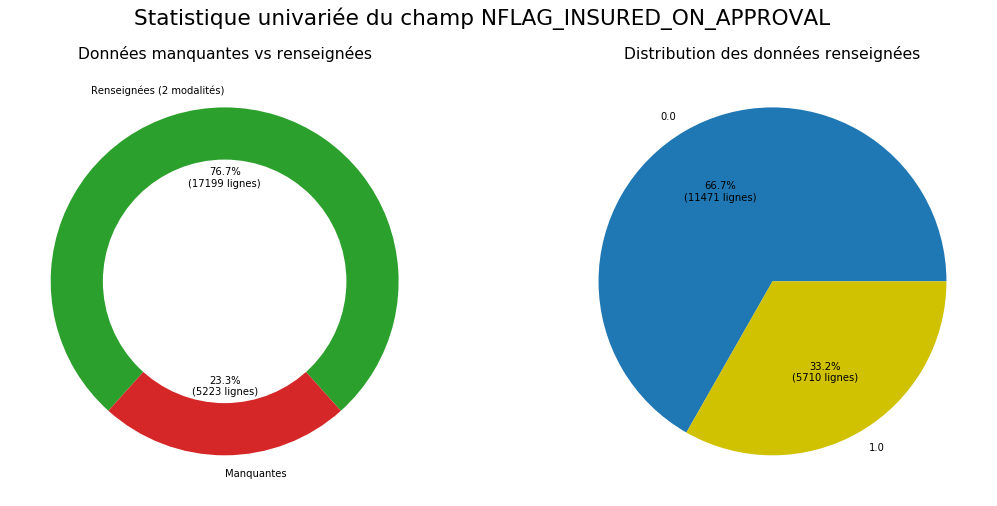

In [1405]:
myDf(dfPreviousApplication).Stat(typeStat='univ', statsNan=True, exclCol=['SK_ID_PREV','SK_ID_CURR'])

## Feature engineering sur des variables communes à Bureau et PreviousApplication

### Days credit et Days decision

Création d'une variable indiquant le nombre de jours entre deux crédits

In [173]:
df1 = dfBureau[['SK_ID_CURR','SK_ID_BUREAU','DAYS_CREDIT']]
df1.columns = ['SK_ID_CURR','SK_ID_PREV','DAYS_DECISION']
df2 = dfPreviousApplication[['SK_ID_CURR','SK_ID_PREV','DAYS_DECISION']]
dfDays = pd.concat([df1,df2])

In [174]:
dfDays.isnull().any()

SK_ID_CURR       False
SK_ID_PREV       False
DAYS_DECISION    False
dtype: bool

In [175]:
#https://www.kaggle.com/shanth84/home-credit-bureau-data-feature-engineering
grp = dfDays[['SK_ID_CURR', 'SK_ID_PREV', 'DAYS_DECISION']].groupby(by = ['SK_ID_CURR'])
grp1 = grp.apply(lambda x: x.sort_values(['DAYS_DECISION'], ascending = False)).reset_index(drop = True)#rename(index = str, columns = {'DAYS_CREDIT': 'DAYS_CREDIT_DIFF'})
grp1['DAYS_DECISION1'] = grp1['DAYS_DECISION']*-1
grp1['DAYS_DIFF'] = grp1.groupby(by = ['SK_ID_CURR'])['DAYS_DECISION1'].diff()
grp1['DAYS_DIFF'] = grp1['DAYS_DIFF'].fillna(0).astype('uint32')
del grp1['DAYS_DECISION1'], grp1['DAYS_DECISION'], grp1['SK_ID_CURR']
dfDays = dfDays.merge(grp1, left_on='SK_ID_PREV', right_on='SK_ID_PREV')
del dfDays['DAYS_DECISION']
del dfDays['SK_ID_PREV']
dfDays = dfDays.groupby('SK_ID_CURR').mean().reset_index(drop=False)
dfDays['DAYS_DIFF'] = dfDays['DAYS_DIFF'].astype(float)
dfDays = dfDays.rename(columns={'DAYS_DIFF':'PREV_DAYS_DIFF'})

In [ ]:
dfApplication = dfApplication.merge(dfDays, left_on='SK_ID_CURR', right_on='SK_ID_CURR', how='left')

In [ ]:
del dfPreviousApplication['DAYS_DECISION']

# Exploration de installment payments

## Suppression de variables inintéressantes

In [128]:
del dfInstallmentsPayments['NUM_INSTALMENT_VERSION'] #Version of installment calendar (0 is for credit card) of previous credit. Change of installment version from month to month signifies that some parameter of payment calendar has changed
del dfInstallmentsPayments['NUM_INSTALMENT_NUMBER'] #On which installment we observe payment

## Fearture engineering sur Installment Payment

In [148]:
dfInstallmentsPayments = dfInstallmentsPayments[dfInstallmentsPayments.AMT_INSTALMENT != 0]

### Nombre d'installment par client

In [149]:
dfInstallmentsPaymentsCount = pd.DataFrame(dfInstallmentsPayments.groupby('SK_ID_CURR').size(), columns=['NB_INSTALLMENT']).reset_index(drop=False)
dfInstallmentsPaymentsCount.head(3)

,SK_ID_CURR,NB_INSTALLMENT
0,100026,8
1,100034,10
2,100045,64


### Différence  moyenne entre les montants et dates effectifs et prévues (positifs et négatifs)

Calcul du nombre d'installment par client

In [ ]:
dfInstallmentsPaymentsCount = pd.DataFrame(dfInstallmentsPayments.groupby('SK_ID_CURR').size(), columns=['NB_INSTALLMENT']).reset_index(drop=False)

Calcul des différences positives et négatives brutes

In [150]:
a=time.time()
dfInstallmentsPayments['DIFF_DAYS_INSTALLMENT_PAYMENT'] = dfInstallmentsPayments.apply(lambda x: x.DAYS_INSTALMENT - x.DAYS_ENTRY_PAYMENT, axis=1)
b=time.time()
print(b-a)
dfInstallmentsPayments['DIFF_AMT_INSTALLMENT_PAYMENT'] = dfInstallmentsPayments.apply(lambda x: (x.AMT_INSTALMENT - x.AMT_PAYMENT)/x.AMT_INSTALMENT, axis=1)
c=time.time()
print(c-b)
dfInstallmentsPayments['DIFF_DAYS_INSTALLMENT_PAYMENT_POS'] = dfInstallmentsPayments.apply(lambda x: np.where(x.DIFF_DAYS_INSTALLMENT_PAYMENT>0,x.DIFF_DAYS_INSTALLMENT_PAYMENT,0), axis=1)
d=time.time()
print(d-c)
dfInstallmentsPayments['DIFF_DAYS_INSTALLMENT_PAYMENT_NEG'] = dfInstallmentsPayments.apply(lambda x: np.where(x.DIFF_DAYS_INSTALLMENT_PAYMENT<0,x.DIFF_DAYS_INSTALLMENT_PAYMENT,0), axis=1)
e=time.time()
print(e-d)
dfInstallmentsPayments['DIFF_AMT_INSTALLMENT_PAYMENT_POS'] = dfInstallmentsPayments.apply(lambda x: np.where(x.DIFF_AMT_INSTALLMENT_PAYMENT>0,x.DIFF_AMT_INSTALLMENT_PAYMENT,0), axis=1)
f=time.time()
print(f-e)
dfInstallmentsPayments['DIFF_AMT_INSTALLMENT_PAYMENT_NEG'] = dfInstallmentsPayments.apply(lambda x: np.where(x.DIFF_AMT_INSTALLMENT_PAYMENT<0,x.DIFF_AMT_INSTALLMENT_PAYMENT,0), axis=1)
g=time.time()
print(g-f)


<ipython-input-150-b40bf6d9e189>:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dfInstallmentsPayments['DIFF_DAYS_INSTALLMENT_PAYMENT'] = dfInstallmentsPayments.apply(lambda x: x.DAYS_INSTALMENT - x.DAYS_ENTRY_PAYMENT, axis=1)


34.560500144958496


<ipython-input-150-b40bf6d9e189>:5: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dfInstallmentsPayments['DIFF_AMT_INSTALLMENT_PAYMENT'] = dfInstallmentsPayments.apply(lambda x: (x.AMT_INSTALMENT - x.AMT_PAYMENT)/x.AMT_INSTALMENT, axis=1)


50.1648051738739


<ipython-input-150-b40bf6d9e189>:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dfInstallmentsPayments['DIFF_DAYS_INSTALLMENT_PAYMENT_POS'] = dfInstallmentsPayments.apply(lambda x: np.where(x.DIFF_DAYS_INSTALLMENT_PAYMENT>0,x.DIFF_DAYS_INSTALLMENT_PAYMENT,0), axis=1)


45.468833684921265


<ipython-input-150-b40bf6d9e189>:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dfInstallmentsPayments['DIFF_DAYS_INSTALLMENT_PAYMENT_NEG'] = dfInstallmentsPayments.apply(lambda x: np.where(x.DIFF_DAYS_INSTALLMENT_PAYMENT<0,x.DIFF_DAYS_INSTALLMENT_PAYMENT,0), axis=1)


45.1816611289978


<ipython-input-150-b40bf6d9e189>:14: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dfInstallmentsPayments['DIFF_AMT_INSTALLMENT_PAYMENT_POS'] = dfInstallmentsPayments.apply(lambda x: np.where(x.DIFF_AMT_INSTALLMENT_PAYMENT>0,x.DIFF_AMT_INSTALLMENT_PAYMENT,0), axis=1)


45.24213123321533
46.6742479801178


<ipython-input-150-b40bf6d9e189>:17: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dfInstallmentsPayments['DIFF_AMT_INSTALLMENT_PAYMENT_NEG'] = dfInstallmentsPayments.apply(lambda x: np.where(x.DIFF_AMT_INSTALLMENT_PAYMENT<0,x.DIFF_AMT_INSTALLMENT_PAYMENT,0), axis=1)


On applique un facteur temporel afin de diminuer l'impact des installments anciens

In [151]:
a=time.time()
dfInstallmentsPayments['INSTALPAYMT_DIFF_DAYS_INSTALLMENT_PAYMENT_POS'] = dfInstallmentsPayments.apply(lambda x: x.DIFF_DAYS_INSTALLMENT_PAYMENT_POS / np.sqrt(1-x.DAYS_ENTRY_PAYMENT), axis=1)
b=time.time()
print(b-a)
dfInstallmentsPayments['INSTALPAYMT_DIFF_DAYS_INSTALLMENT_PAYMENT_NEG'] = dfInstallmentsPayments.apply(lambda x: x.DIFF_DAYS_INSTALLMENT_PAYMENT_NEG / np.sqrt(1-x.DAYS_ENTRY_PAYMENT), axis=1)
c=time.time()
print(c-b)
dfInstallmentsPayments['INSTALPAYMT_DIFF_AMT_INSTALLMENT_PAYMENT_POS'] = dfInstallmentsPayments.apply(lambda x: x.DIFF_AMT_INSTALLMENT_PAYMENT_POS / np.sqrt(1-x.DAYS_ENTRY_PAYMENT), axis=1)
d=time.time()
print(d-c)
dfInstallmentsPayments['INSTALPAYMT_DIFF_AMT_INSTALLMENT_PAYMENT_NEG'] = dfInstallmentsPayments.apply(lambda x: x.DIFF_AMT_INSTALLMENT_PAYMENT_NEG / np.sqrt(1-x.DAYS_ENTRY_PAYMENT), axis=1)
e=time.time()
print(e-d)

<ipython-input-151-da5e63449b26>:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dfInstallmentsPayments['DIFF_DAYS_INSTALLMENT_PAYMENT_POS'] = dfInstallmentsPayments.apply(lambda x: x.DIFF_DAYS_INSTALLMENT_PAYMENT_POS / np.sqrt(1-x.DAYS_ENTRY_PAYMENT), axis=1)


42.99021315574646


<ipython-input-151-da5e63449b26>:5: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dfInstallmentsPayments['DIFF_DAYS_INSTALLMENT_PAYMENT_NEG'] = dfInstallmentsPayments.apply(lambda x: x.DIFF_DAYS_INSTALLMENT_PAYMENT_NEG / np.sqrt(1-x.DAYS_ENTRY_PAYMENT), axis=1)


42.64770746231079


<ipython-input-151-da5e63449b26>:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dfInstallmentsPayments['DIFF_AMT_INSTALLMENT_PAYMENT_POS'] = dfInstallmentsPayments.apply(lambda x: x.DIFF_AMT_INSTALLMENT_PAYMENT_POS / np.sqrt(1-x.DAYS_ENTRY_PAYMENT), axis=1)


42.46240258216858
41.51761722564697


<ipython-input-151-da5e63449b26>:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dfInstallmentsPayments['DIFF_AMT_INSTALLMENT_PAYMENT_NEG'] = dfInstallmentsPayments.apply(lambda x: x.DIFF_AMT_INSTALLMENT_PAYMENT_NEG / np.sqrt(1-x.DAYS_ENTRY_PAYMENT), axis=1)


In [152]:
del dfInstallmentsPayments['SK_ID_PREV']
del dfInstallmentsPayments['DAYS_INSTALMENT']
del dfInstallmentsPayments['DAYS_ENTRY_PAYMENT']
del dfInstallmentsPayments['AMT_INSTALMENT']
del dfInstallmentsPayments['AMT_PAYMENT']
del dfInstallmentsPayments['DIFF_DAYS_INSTALLMENT_PAYMENT']
del dfInstallmentsPayments['DIFF_AMT_INSTALLMENT_PAYMENT']

On somme par client

In [153]:
dfInstallmentsPayments = dfInstallmentsPayments.groupby('SK_ID_CURR').sum().reset_index(drop=False)

On divise par le nombre d'installments

In [ ]:
dfInstallmentsPayments = dfInstallmentsPayments.merge(dfInstallmentsPaymentsCount, right_on='SK_ID_CURR', left_on='SK_ID_CURR')
dfInstallmentsPayments['INSTALPAYMT_DIFF_DAYS_INSTALLMENT_PAYMENT_POS'] = dfInstallmentsPayments.apply(lambda x: x.DIFF_DAYS_INSTALLMENT_PAYMENT_POS / x.NB_INSTALLMENT, axis=1)
dfInstallmentsPayments['INSTALPAYMT_DIFF_DAYS_INSTALLMENT_PAYMENT_NEG'] = dfInstallmentsPayments.apply(lambda x: x.DIFF_DAYS_INSTALLMENT_PAYMENT_NEG / x.NB_INSTALLMENT, axis=1)
dfInstallmentsPayments['INSTALPAYMT_DIFF_AMT_INSTALLMENT_PAYMENT_POS'] = dfInstallmentsPayments.apply(lambda x: x.DIFF_AMT_INSTALLMENT_PAYMENT_POS / x.NB_INSTALLMENT, axis=1)
dfInstallmentsPayments['INSTALPAYMT_DIFF_AMT_INSTALLMENT_PAYMENT_NEG'] = dfInstallmentsPayments.apply(lambda x: x.DIFF_AMT_INSTALLMENT_PAYMENT_NEG / x.NB_INSTALLMENT, axis=1)
del dfInstallmentsPayments['NB_INSTALLMENT']

### Remontée des DIFF dans dfApplication

In [ ]:
dfApplication = dfApplication.merge(dfInstallmentsPayments, left_on='SK_ID_CURR', right_on='SK_ID_CURR', how='left')

# Exploration de PosCashBalance

In [132]:
dfPosCashBalance

,SK_ID_PREV,SK_ID_CURR,MONTHS_BALANCE,CNT_INSTALMENT,CNT_INSTALMENT_FUTURE,NAME_CONTRACT_STATUS,SK_DPD,SK_DPD_DEF
0,1784872,397406,-32,12.0,9.0,Active,0,0
1,1784872,397406,-25,12.0,2.0,Active,0,0
2,1784872,397406,-26,12.0,3.0,Active,0,0
3,1784872,397406,-33,12.0,10.0,Active,0,0
4,1784872,397406,-23,12.0,0.0,Completed,0,0
...,...,...,...,...,...,...,...,...
1334349,2474422,103770,-1,NaN,NaN,Signed,0,0
1334350,1513607,171417,-1,18.0,18.0,Active,0,0
1334351,1696467,447980,-1,12.0,12.0,Active,0,0
1334352,1230655,420982,-1,12.0,12.0,Active,0,0


## Remontée des DPD dans dfApplication

In [145]:
dfPosCashCount = pd.DataFrame(dfPosCashBalance.groupby('SK_ID_CURR').size(), columns=['NB_POSCASH']).reset_index(drop=False)
dfPosCashBalance = dfPosCashBalance.merge(dfPosCashCount, right_on='SK_ID_CURR', left_on='SK_ID_CURR').reset_index(drop=True)
nb_poscash = dfPosCashBalance.NB_POSCASH.values

pos_cash_dpd = dfPosCashBalance['SK_DPD'].values
pos_cash_dpd_def = dfPosCashBalance['SK_DPD_DEF'].values
pos_cash_month_bal = dfPosCashBalance['MONTHS_BALANCE'].values
pos_cash_dpd = pos_cash_dpd / np.sqrt(1-pos_cash_month_bal) / nb_poscash
pos_cash_dpd_def = pos_cash_dpd_def / np.sqrt(1-pos_cash_month_bal) / nb_poscash
dfPosCashBalance['POSCASH_SK_DPD'] = pd.Series(pos_cash_dpd)
dfPosCashBalance['POSCASH_SK_DPD_DEF'] = pd.Series(pos_cash_dpd_def)

dfPosCashDPD = dfPosCashBalance[['SK_ID_CURR','POSCASH_SK_DPD','POSCASH_SK_DPD_DEF']]
dfPosCashDPD = dfPosCashDPD.groupby('SK_ID_CURR').sum().reset_index(drop=False)

dfApplication = dfApplication.merge(dfPosCashDPD, left_on='SK_ID_CURR', right_on='SK_ID_CURR', how='left')

dfApplication['POSCASH_SK_DPD'] = dfApplication['POSCASH_SK_DPD'].fillna(0).astype('int64')
dfApplication['POSCASH_SK_DPD_DEF'] = dfApplication['POSCASH_SK_DPD_DEF'].fillna(0).astype('int64')

# Exploration de CreditCardBalance

In [133]:
dfCreditCardBalance.head()

,SK_ID_PREV,SK_ID_CURR,MONTHS_BALANCE,AMT_BALANCE,AMT_CREDIT_LIMIT_ACTUAL,AMT_DRAWINGS_ATM_CURRENT,AMT_DRAWINGS_CURRENT,AMT_DRAWINGS_OTHER_CURRENT,AMT_DRAWINGS_POS_CURRENT,AMT_INST_MIN_REGULARITY,AMT_PAYMENT_CURRENT,AMT_PAYMENT_TOTAL_CURRENT,AMT_RECEIVABLE_PRINCIPAL,AMT_RECIVABLE,AMT_TOTAL_RECEIVABLE,CNT_DRAWINGS_ATM_CURRENT,CNT_DRAWINGS_CURRENT,CNT_DRAWINGS_OTHER_CURRENT,CNT_DRAWINGS_POS_CURRENT,CNT_INSTALMENT_MATURE_CUM,NAME_CONTRACT_STATUS,SK_DPD,SK_DPD_DEF
0,2740914,340339,-1,131669.145,225000,10800.0,10800.000,0.0,0.000,6000.480,6322.500,6322.50,121430.700,127891.935,127891.935,2.0,2,0.0,0.0,6.0,Active,0,0
1,2740914,340339,-5,104475.105,112500,7650.0,15545.835,0.0,7895.835,5304.150,17897.715,11477.61,99224.640,99823.050,99823.050,3.0,28,0.0,25.0,2.0,Active,0,0
2,2740914,340339,-10,0.000,45000,0.0,0.000,0.0,0.000,0.000,NaN,0.00,0.000,0.000,0.000,0.0,0,0.0,0.0,0.0,Active,0,0
3,2740914,340339,-6,109700.505,112500,24300.0,39749.805,0.0,15449.805,2874.195,4523.580,4523.58,96953.805,100445.490,100445.490,5.0,24,0.0,19.0,1.0,Active,0,0
4,2740914,340339,-2,119748.600,112500,0.0,1125.000,0.0,1125.000,6022.125,6075.000,6075.00,112499.640,118886.850,118886.850,0.0,6,0.0,6.0,5.0,Active,0,0


## Remontée des DPD dans dfApplication

In [134]:
dfCreditCardCount = pd.DataFrame(dfCreditCardBalance.groupby('SK_ID_CURR').size(), columns=['NB_CREDCARD']).reset_index(drop=False)
dfCreditCardBalance = dfCreditCardBalance.merge(dfCreditCardCount, right_on='SK_ID_CURR', left_on='SK_ID_CURR').reset_index(drop=True)
nb_credcard = dfCreditCardBalance.NB_CREDCARD.values

cred_card_dpd = dfCreditCardBalance['SK_DPD'].values
cred_card_dpd_def = dfCreditCardBalance['SK_DPD_DEF'].values
cred_card_month_bal = dfCreditCardBalance['MONTHS_BALANCE'].values
cred_card_dpd = cred_card_dpd / np.sqrt(1-cred_card_month_bal) / nb_credcard
cred_card_dpd_def = cred_card_dpd_def / np.sqrt(1-cred_card_month_bal) / nb_credcard
dfCreditCardBalance['CREDCARD_SK_DPD'] = pd.Series(cred_card_dpd)
dfCreditCardBalance['CREDCARD_SK_DPD_DEF'] = pd.Series(cred_card_dpd_def)

dfCreditCardDPD = dfCreditCardBalance[['SK_ID_CURR','CREDCARD_SK_DPD','CREDCARD_SK_DPD_DEF']]
dfCreditCardDPD = dfCreditCardDPD.groupby('SK_ID_CURR').sum().reset_index(drop=False)

dfApplication = dfApplication.merge(dfCreditCardDPD, left_on='SK_ID_CURR', right_on='SK_ID_CURR', how='left')

dfApplication['CREDCARD_SK_DPD'] = dfApplication['CREDCARD_SK_DPD'].fillna(0).astype('int64')
dfApplication['CREDCARD_SK_DPD_DEF'] = dfApplication['CREDCARD_SK_DPD_DEF'].fillna(0).astype('int64')

# Exploration de Bureau balance

In [138]:
dfBureauBalance.head()

,SK_ID_BUREAU,MONTHS_BALANCE,STATUS
0,5717363,-42,C
1,5717363,-43,C
2,5717363,-44,C
3,5717363,-45,C
4,5717363,-46,C


## Remontée des DPD dans dfApplication

In [139]:
dfBureauBalance = dfBureauBalance.merge(dfBureau[['SK_ID_BUREAU','SK_ID_CURR']], left_on='SK_ID_BUREAU', right_on='SK_ID_BUREAU').reset_index(drop=True)

dfBureauBalanceCount = pd.DataFrame(dfBureauBalance.groupby('SK_ID_CURR').size(), columns=['NB_BUROBAL']).reset_index(drop=False)
dfBureauBalance = dfBureauBalance.merge(dfBureauBalanceCount, right_on='SK_ID_CURR', left_on='SK_ID_CURR').reset_index(drop=True)
nb_burobal = dfBureauBalance.NB_BUROBAL.values

# Création d'une variable indiquant le niveau de DPD (day past due) du client sur Bureau
# On donne moins d'importance aux Days Past Due anciens
dfBureauBalance.at[dfBureauBalance[dfBureauBalance.STATUS.isin(['C','X'])].index, 'STATUS'] = '0'
dfBureauBalance['STATUS'] = dfBureauBalance['STATUS'].astype(float)
buro_bal_status = dfBureauBalance['STATUS'].values
buro_bal_month_bal = dfBureauBalance['MONTHS_BALANCE'].values
buro_bal_status = buro_bal_status / np.sqrt(1-buro_bal_month_bal) / nb_burobal
dfBureauBalance['STATUS'] = pd.Series(buro_bal_status)

dfBureauBalance = dfBureauBalance.rename(columns={'STATUS':'BUROBAL_SK_DPD'})
del dfBureauBalance['SK_ID_BUREAU']
del dfBureauBalance['MONTHS_BALANCE']
del dfBureauBalance['NB_BUROBAL']

dfBureauBalance = dfBureauBalance.groupby('SK_ID_CURR').sum().reset_index(drop=False)

dfApplication = dfApplication.merge(dfBureauBalance, left_on='SK_ID_CURR', right_on='SK_ID_CURR', how='left')
dfApplication['BUROBAL_SK_DPD'] = dfApplication['BUROBAL_SK_DPD'].fillna(0).astype('int64')


## Statistique univariée

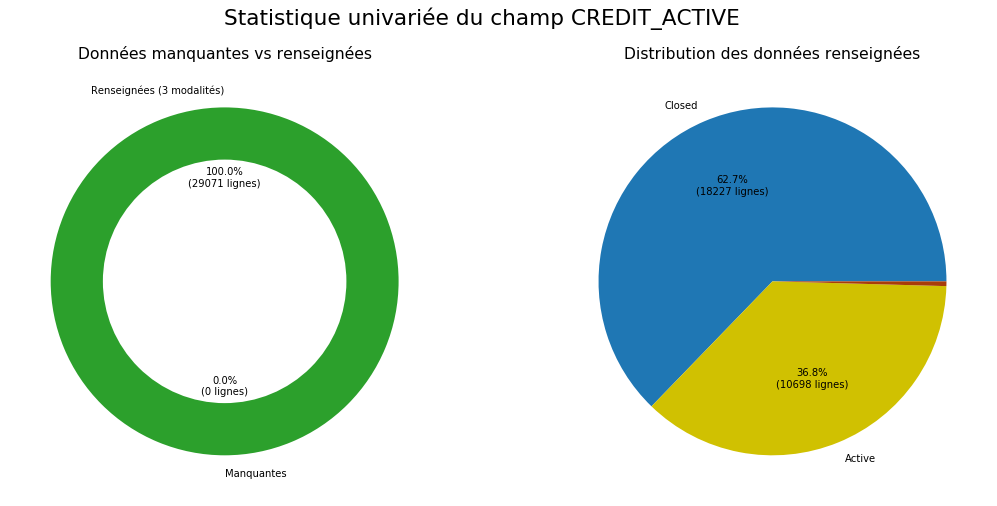

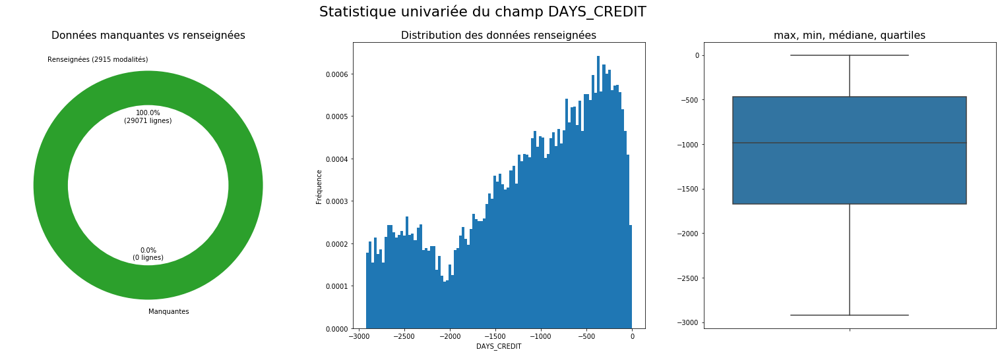

Mesures de position
 - Moyenne: -1140.38
 - Médiane: -987.0
Mesures de dispertion
 - Ecart type: 797.85
 - Min: -2922
 - Q25: -1670.0
 - Q75: -467.0
 - Max: -2
Mesures de forme
 - Skewness (asymétrie): -0.58
 - Kurtosis (applatissement): -0.75


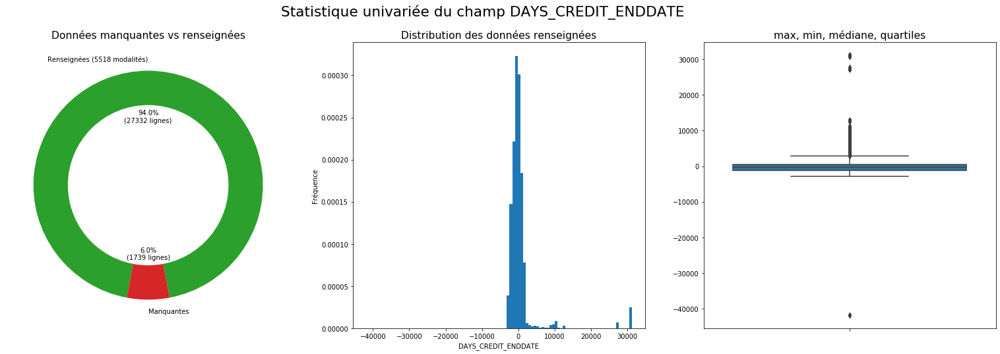

Mesures de position
 - Moyenne: 499.07
 - Médiane: -323.5
Mesures de dispertion
 - Ecart type: 4941.97
 - Min: -41874.0
 - Q25: -1135.0
 - Q75: 484.0
 - Max: 31198.0
Mesures de forme
 - Skewness (asymétrie): 5.09
 - Kurtosis (applatissement): 28.86


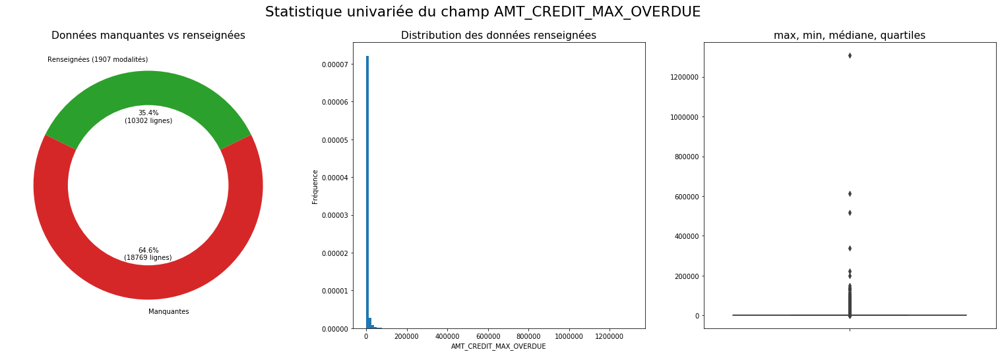

Mesures de position
 - Moyenne: 2689.49
 - Médiane: 0.0
Mesures de dispertion
 - Ecart type: 17723.1
 - Min: 0.0
 - Q25: 0.0
 - Q75: 0.0
 - Max: 1309014.0
Mesures de forme
 - Skewness (asymétrie): 46.89
 - Kurtosis (applatissement): 3086.77


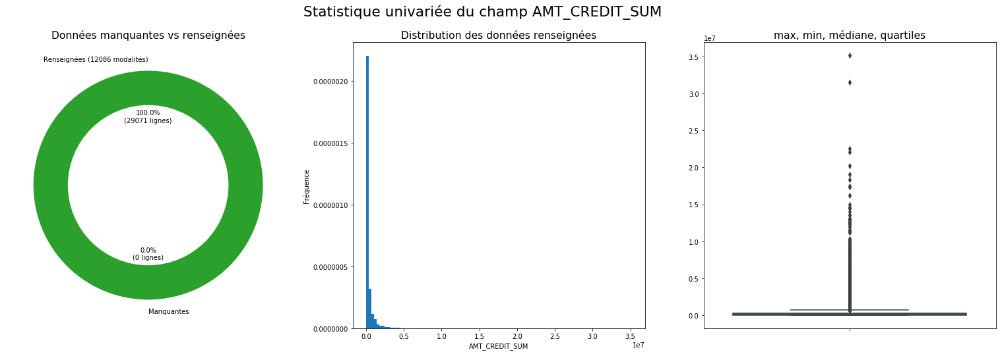

Mesures de position
 - Moyenne: 356984.06
 - Médiane: 126324.0
Mesures de dispertion
 - Ecart type: 904313.2
 - Min: 0.0
 - Q25: 51772.5
 - Q75: 308783.7
 - Max: 35190000.0
Mesures de forme
 - Skewness (asymétrie): 11.1
 - Kurtosis (applatissement): 227.42


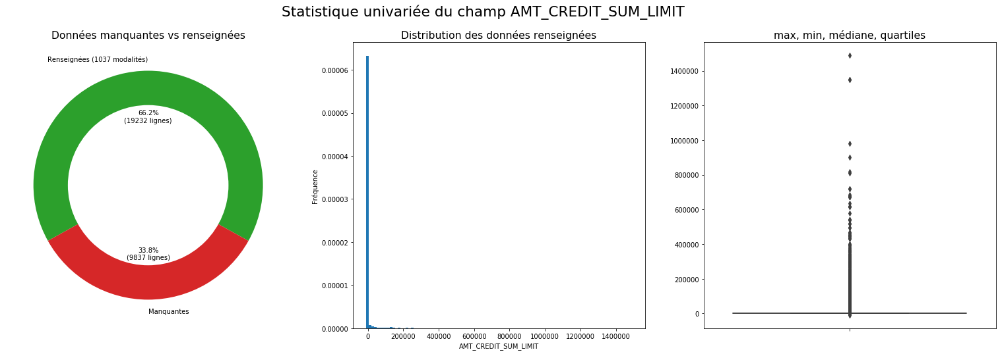

Mesures de position
 - Moyenne: 6016.17
 - Médiane: 0.0
Mesures de dispertion
 - Ecart type: 43116.99
 - Min: -10266.08
 - Q25: 0.0
 - Q75: 0.0
 - Max: 1490490.32
Mesures de forme
 - Skewness (asymétrie): 13.61
 - Kurtosis (applatissement): 278.55


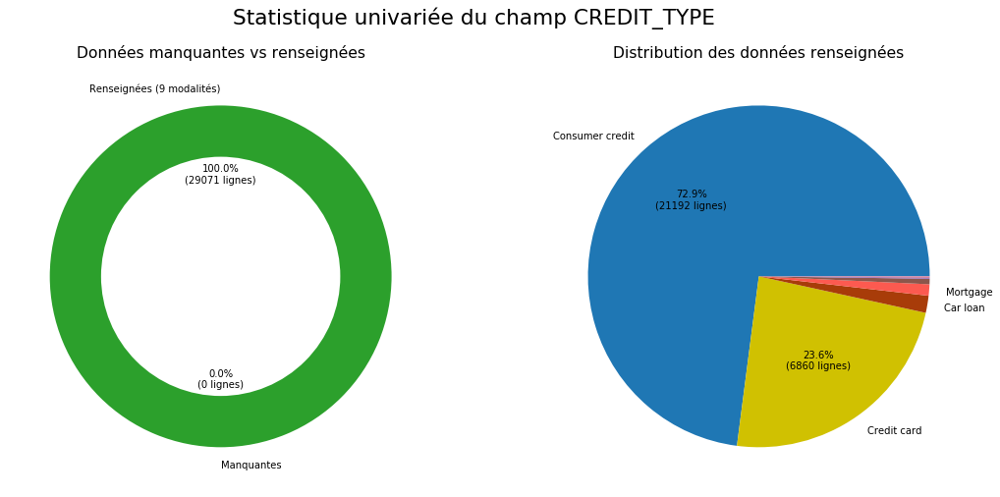

In [1465]:
myDf(dfBureau).Stat(typeStat='univ', statsNan=True, exclCol=['SK_ID_BUREAU','SK_ID_CURR'])